Selected features (PCA components) for 95% variance: ['set_no', 'game_no', 'point_no', 'p1_sets', 'p2_sets', 'p1_games', 'p2_games', 'p1_score', 'p2_score', 'server', 'serve_no', 'point_victor', 'p1_points_won', 'p2_points_won', 'game_victor', 'set_victor', 'p1_ace', 'p2_ace', 'p1_winner', 'p2_winner', 'p1_double_fault', 'p2_double_fault', 'p1_unf_err', 'p2_unf_err', 'p1_net_pt', 'p2_net_pt', 'p1_net_pt_won', 'p2_net_pt_won']
Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175286e+00 -2.95664232e-02  2.16003561e+00
  -2.33513696e+00 -2.85404033e-01 -4.67439578e-01  1.60818513e+00
   4.65797719e-01 -1.95438429e+00  8.08412016e-01 -3.59533323e-01
   2.04708995e-02  8.30471923e-01  7.89831761e-02 -1.74451542e+00
   1.46216423e+00 -5.71791201e-02  2.38334871e-01 -5.75518114e-01
   5.12710709e-01 -2.77980332e-01  1.03135330e-01  1.25425239e+00
  -2.66111411e-01  9.97766437e-01  4.76165082e-01 -6.85610401e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489

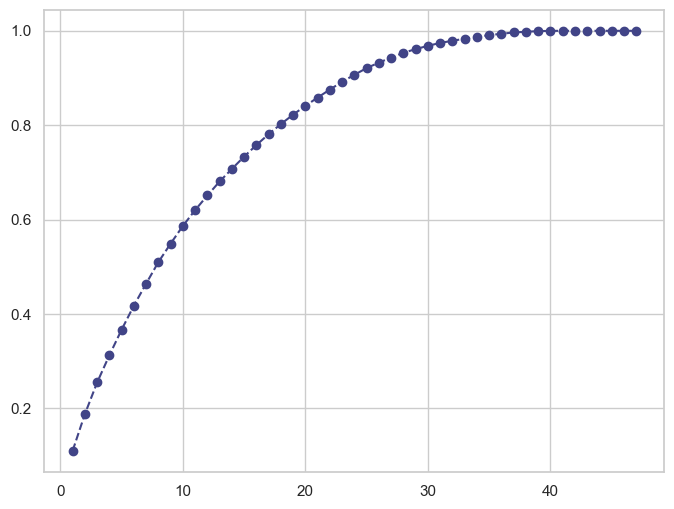

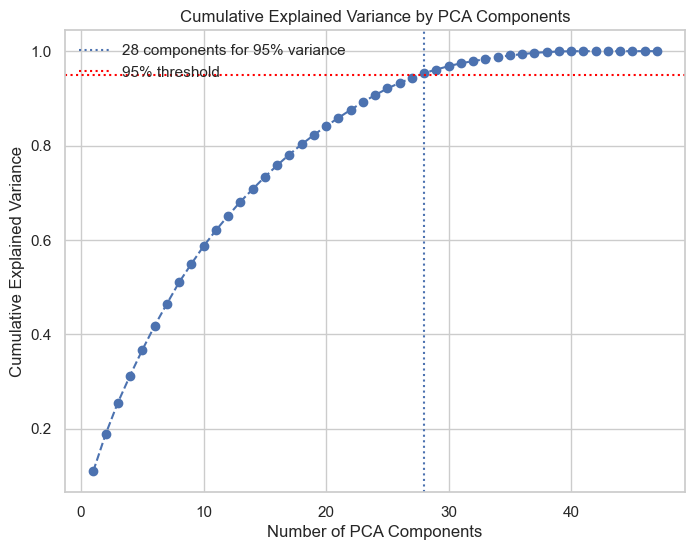

In [265]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns  # 引入seaborn库

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列并获取列名
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 累计解释方差分析
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 查找满足累计贡献值阈值的主成分数
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 输出保留的特征（PCA组件）的名称
selected_features_names = numeric_columns[:components_required]
print(f"Selected features (PCA components) for 95% variance: {selected_features_names}")

# 应用PCA降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 设置绘图风格为淡雅
sns.set_theme(style="whitegrid")

# 绘制特征累计的值的折线图
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.axvline(x=components_required, linestyle=':', label=f'{components_required} components for 95% variance')
plt.axhline(y=threshold_variance, linestyle=':', color='red', label='95% threshold')
plt.legend(loc='best')
plt.grid(True)
plt.show()

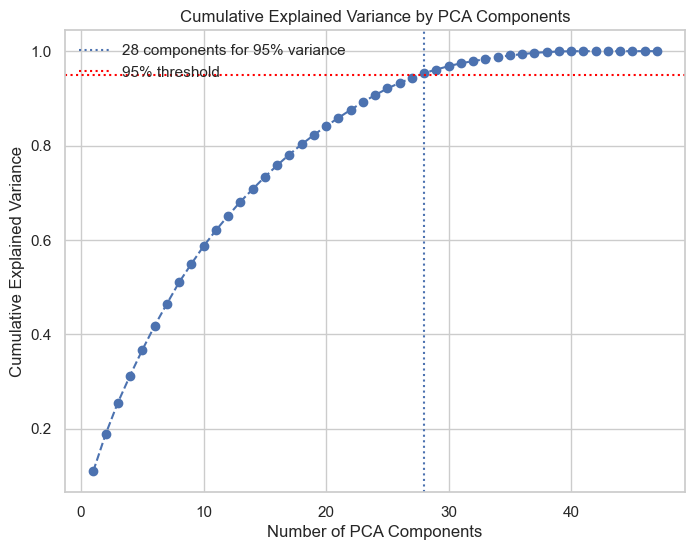

In [266]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Times New Roman'  # 添加这行以设置字体
import seaborn as sns  # 引入seaborn库

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# 加载数据
df = pd.read_excel('updated.xlsx')

# ...（中间的预处理和PCA计算部分保持不变）

# 绘制特征累计的值的折线图
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.axvline(x=components_required, linestyle=':', label=f'{components_required} components for 95% variance')
plt.axhline(y=threshold_variance, linestyle=':', color='red', label='95% threshold')
plt.legend(loc='best')
plt.grid(True)
plt.show()

TypeError: 'Line3DCollection' object is not callable

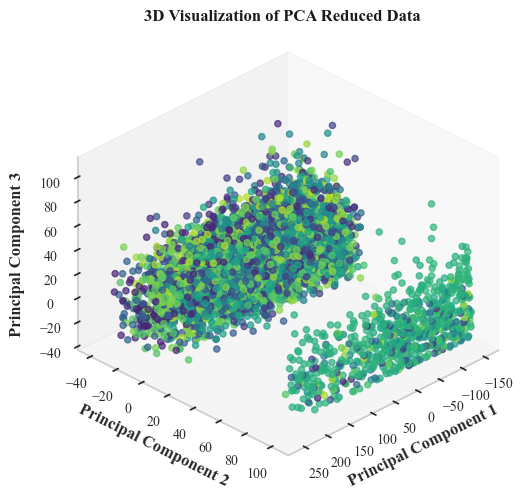

In [111]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA  # 修改这一行
import matplotlib.pyplot as plt
from matplotlib import rcParams, cm

# 设置matplotlib全局配置，更改字体为Times New Roman
rcParams['font.family'] = 'Times New Roman'
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 12
rcParams['text.color'] = 'k'  # 文本颜色设为黑色

# 加载数据
df = pd.read_excel('updated.xlsx')

# 预处理数据：选择数值列
df_numeric = df.select_dtypes(include=[np.number])

# 处理缺失值（这里仍然用0填充，根据实际情况可选用其他方法）
df_numeric = df_numeric.fillna(0)

# 执行 PCA（将 KernelPCA 替换为 PCA）
pca = PCA(n_components=3)  # 使用PCA，设置为3个主成分
X_pca = pca.fit_transform(df_numeric)

# 创建图形对象
fig = plt.figure(figsize=(8, 6), facecolor='w')  # 增大图形大小并设置背景色为白色
ax = fig.add_subplot(111, projection='3d', proj_type='ortho')  # 使用正交投影以获得更好的视角平衡

# 如果颜色代表类别或其他信息，可以从原始数据中获取颜色映射
# colors = ...  # 根据实际数据生成颜色列表，例如 df['category'].map(color_mapping)
# 若无分类信息，则使用颜色循环
colors = plt.cm.get_cmap('viridis_r')(np.linspace(0.1, 0.9, len(X_pca)))  # 使用viridis颜色映射的反转版本

scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, alpha=0.7, edgecolors=None, marker='o')

# 设置坐标轴标签和标题样式
ax.set_xlabel('Principal Component 1', fontweight='bold')
ax.set_ylabel('Principal Component 2', fontweight='bold')
ax.set_zlabel('Principal Component 3', fontweight='bold')
plt.title('3D Visualization of PCA Reduced Data', fontweight='bold')

# 添加自定义视角和范围
ax.view_init(elev=30, azim=45)  # 调整观察角度

# 设置坐标轴刻度线样式和网格线
ax.tick_params(axis='both', which='major', labelsize=10, width=1, length=5)
ax.tick_params(axis='both', which='minor', width=1, length=3)
ax.grid(False)  # 关闭背景网格
ax.w_xaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_yaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_zaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)

# 添加光源效果，使图像更具立体感
ax.dist = 10  # 设置景深
ax.azim = -60  # 调整视角
ax.elev = 30

# 如果颜色有区分意义，可以添加颜色条
# cbar = fig.colorbar(scatter, shrink=0.75, aspect=10, pad=0.01)

# 美化边界框
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# 显示框线
ax.xaxis._axinfo["grid"]['linestyle'] = '--'
ax.yaxis._axinfo["grid"]['linestyle'] = '--'
ax.zaxis._axinfo["grid"]['linestyle'] = '--'

plt.tight_layout()
plt.show()


Selected features (PCA components) for 95% variance: ['set_no', 'game_no', 'point_no', 'p1_sets', 'p2_sets', 'p1_games', 'p2_games', 'p1_score', 'p2_score', 'server', 'serve_no', 'point_victor', 'p1_points_won', 'p2_points_won', 'game_victor', 'set_victor', 'p1_ace', 'p2_ace', 'p1_winner', 'p2_winner', 'p1_double_fault', 'p2_double_fault', 'p1_unf_err', 'p2_unf_err', 'p1_net_pt', 'p2_net_pt', 'p1_net_pt_won', 'p2_net_pt_won']
Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175286e+00 -2.95664012e-02  2.16003564e+00
  -2.33513706e+00 -2.85404082e-01 -4.67439516e-01  1.60818520e+00
   4.65797668e-01 -1.95438421e+00  8.08411897e-01 -3.59533440e-01
   2.04710754e-02  8.30471964e-01  7.89833874e-02 -1.74451451e+00
   1.46216515e+00 -5.71790511e-02  2.38337962e-01 -5.75520428e-01
   5.12710835e-01 -2.77976501e-01  1.03141760e-01  1.25425686e+00
  -2.66094708e-01  9.97773280e-01  4.76186557e-01 -6.85626997e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489

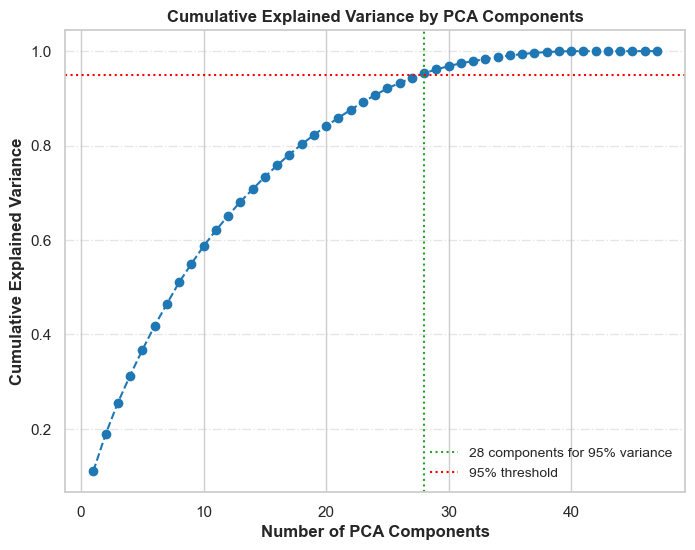

In [263]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams  # 引入rcParams以设置全局样式
import seaborn as sns  # 引入seaborn库

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# 设置matplotlib的全局字体为Times New Roman
rcParams['font.family'] = 'Times New Roman'
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 12
sns.set_theme(style="whitegrid")  # 保持淡雅的网格背景风格

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列并获取列名
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 累计解释方差分析
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 查找满足累计贡献值阈值的主成分数
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 输出保留的特征（PCA组件）的名称
selected_features_names = numeric_columns[:components_required]
print(f"Selected features (PCA components) for 95% variance: {selected_features_names}")

# 应用PCA降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计的值的折线图
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio, marker='o', linestyle='--', color='tab:blue')
plt.title('Cumulative Explained Variance by PCA Components', fontweight='bold')
plt.xlabel('Number of PCA Components', fontweight='bold')
plt.ylabel('Cumulative Explained Variance', fontweight='bold')
plt.axvline(x=components_required, linestyle=':', label=f'{components_required} components for 95% variance', color='tab:green')
plt.axhline(y=threshold_variance, linestyle=':', color='red', label='95% threshold')
plt.legend(loc='best', fontsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)  # 添加网格线仅在Y轴上，调整样式
plt.show()

TypeError: 'Line3DCollection' object is not callable

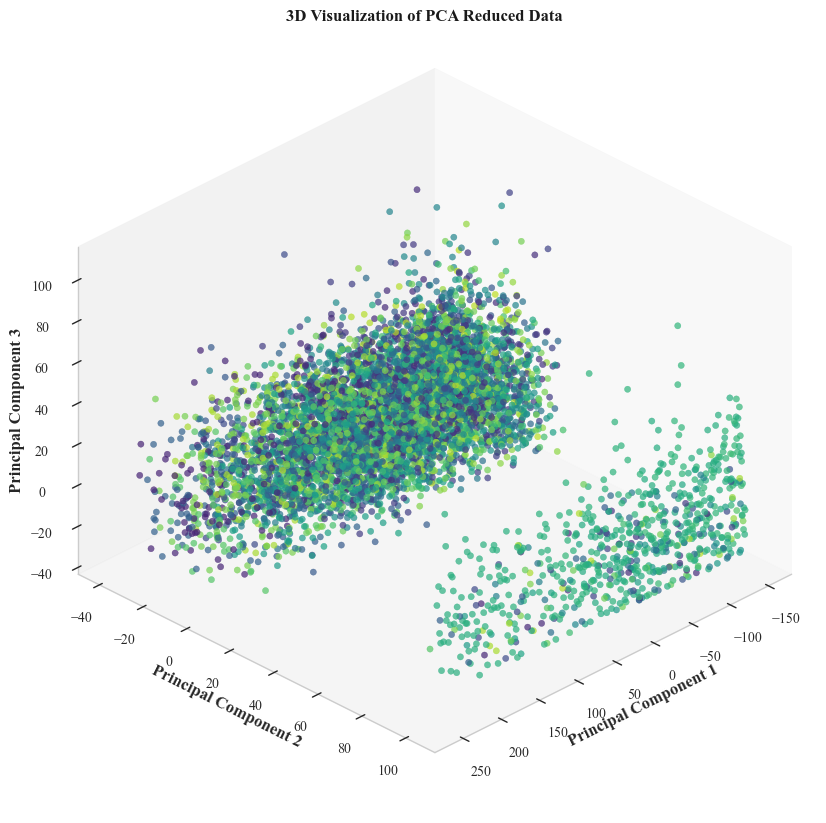

In [427]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib import rcParams, cm

# 设置matplotlib全局配置，更改字体为Times New Roman
rcParams['font.family'] = 'Times New Roman'
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 12
rcParams['text.color'] = 'k'  # 文本颜色设为黑色

# 加载数据
df = pd.read_excel('updated.xlsx')

# 预处理数据：选择数值列并填充缺失值（这里仍然用0填充，实际中可选用其他方法）
df_numeric = df.select_dtypes(include=[np.number])
df_numeric = df_numeric.fillna(0)

# 执行PCA降维
pca = PCA(n_components=10)
X_pca = pca.fit_transform(df_numeric)

# 创建图形对象，背景色已设定为白色
fig = plt.figure(figsize=(10, 8), facecolor='w') 

ax = fig.add_subplot(111, projection='3d', proj_type='ortho')

# 假设颜色映射来自分类信息，如果没有分类，则需要指定一个颜色循环
colors = plt.cm.get_cmap('viridis_r')(np.linspace(0.1, 0.9, len(X_pca))) 

scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, alpha=0.7, edgecolors=None, marker='o')

# 设置坐标轴标签和标题样式
ax.set_xlabel('Principal Component 1', fontweight='bold')
ax.set_ylabel('Principal Component 2', fontweight='bold')
ax.set_zlabel('Principal Component 3', fontweight='bold')
plt.title('3D Visualization of PCA Reduced Data', fontweight='bold')

# 调整视角
ax.view_init(elev=30, azim=45)  

# 设置刻度线、网格线等样式
ax.tick_params(axis='both', which='major', labelsize=10, width=1, length=5)
ax.tick_params(axis='both', which='minor', width=1, length=3)
ax.grid(False)
ax.w_xaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_yaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_zaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)

# 美化边界框与显示框线
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# （注释掉光源效果设置，因PCA三维视图通常不需要光源）

# 如果颜色有区分意义，可以添加颜色条
# cbar = fig.colorbar(scatter, shrink=0.75, aspect=10, pad=0.01)

plt.tight_layout()
plt.show()

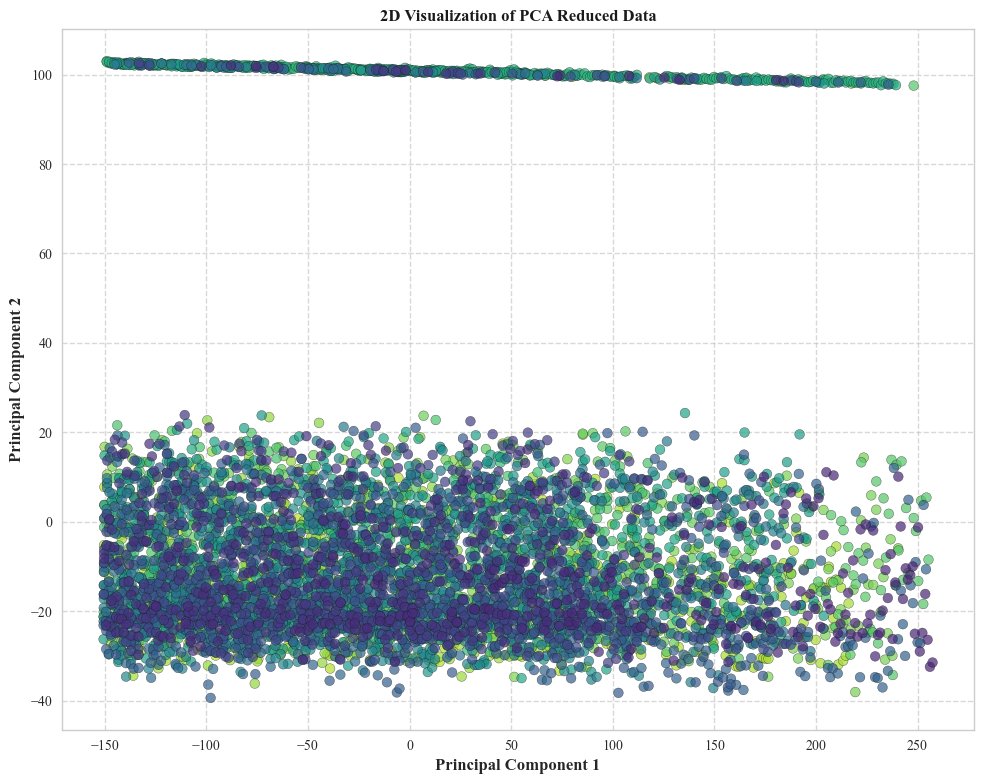

In [425]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置matplotlib全局配置，更改字体为Times New Roman
rcParams['font.family'] = 'Times New Roman'
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 12
rcParams['text.color'] = 'k'  # 文本颜色设为黑色

# 加载数据
df = pd.read_excel('updated.xlsx')

# 预处理数据：选择数值列并填充缺失值（这里仍然用0填充，实际中可选用其他方法）
df_numeric = df.select_dtypes(include=[np.number])
df_numeric = df_numeric.fillna(0)

# 执行PCA降维至2个主成分
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_numeric)

# 创建2D图形对象
fig, ax = plt.subplots(figsize=(10, 8), facecolor='w')  # 设置背景色为白色

# 使用颜色循环，同样是使用viridis的反转版本
colors = plt.cm.get_cmap('viridis_r')(np.linspace(0.1, 0.9, len(X_pca)))

scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, alpha=0.7, edgecolors='k', marker='o')

# 设置坐标轴标签和标题样式
ax.set_xlabel('Principal Component 1', fontweight='bold')
ax.set_ylabel('Principal Component 2', fontweight='bold')
plt.title('2D Visualization of PCA Reduced Data', fontweight='bold')

# 添加网格线和调整显示框线
ax.grid(True, linestyle='--', color='0.7', alpha=0.5)  # 显示背景网格线

# 设置边框样式
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()


### q1建立一个模型，来描述得分发生时到地比赛流程，并且将其应用于一场或者多场的比赛中。您的模型应该可以确认出哪些球员在比赛的特定时间表现得更好，以及他们表现的有多好。基于您的模型，提供可视化来描述比赛流程。注意：在网球的比赛中，发球的选手赢得得分/比赛的可能性要高很多，你可以将此因素以某种方式加入到您的模型中

TypeError: 'Line3DCollection' object is not callable

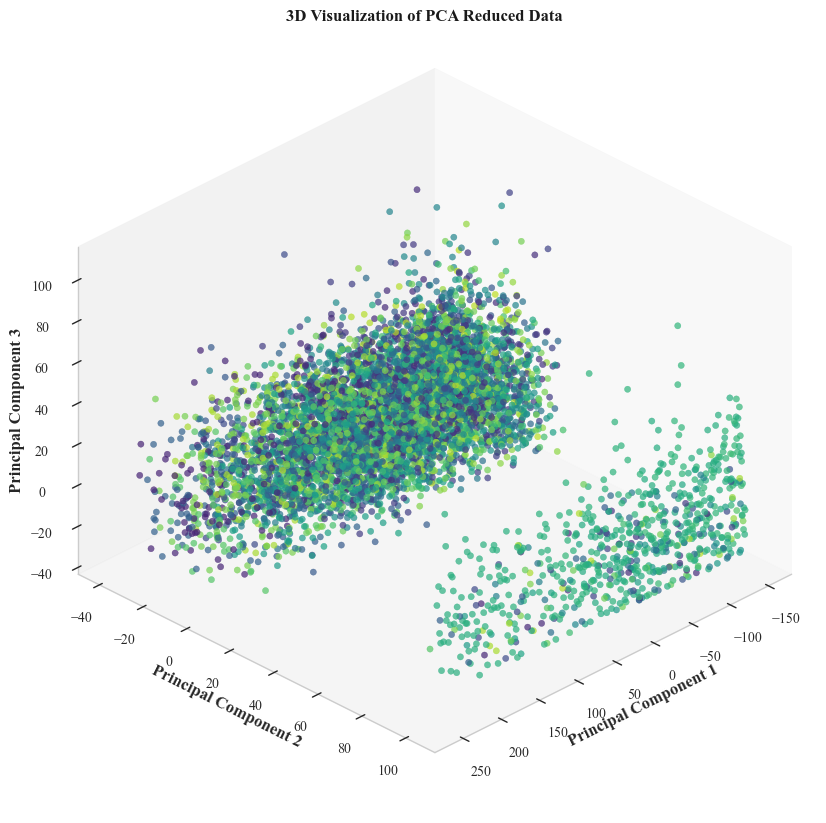

In [432]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib import rcParams, cm

# 设置matplotlib全局配置，更改字体为Times New Roman
rcParams['font.family'] = 'Times New Roman'
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 12
rcParams['text.color'] = 'k'  # 文本颜色设为黑色

# 加载数据
df = pd.read_excel('updated.xlsx')

# 预处理数据：选择数值列并填充缺失值（这里仍然用0填充，实际中可选用其他方法）
df_numeric = df.select_dtypes(include=[np.number])
df_numeric = df_numeric.fillna(0)

# 执行PCA降维
pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_numeric)

# 创建图形对象
fig = plt.figure(figsize=(10, 8), facecolor='w')  # 增大图形大小并设置背景色为白色
ax = fig.add_subplot(111, projection='3d', proj_type='ortho')  # 使用正交投影以获得更好的视角平衡

# 如果颜色代表类别或其他信息，可以从原始数据中获取颜色映射；若无分类信息，则使用颜色循环
# colors = ...  # 根据实际数据生成颜色列表，例如 df['category'].map(color_mapping)
colors = plt.cm.get_cmap('viridis_r')(np.linspace(0.1, 0.9, len(X_pca)))  # 使用viridis颜色映射的反转版本

scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, alpha=0.7, edgecolors=None, marker='o')

# 设置坐标轴标签和标题样式
ax.set_xlabel('Principal Component 1', fontweight='bold')
ax.set_ylabel('Principal Component 2', fontweight='bold')
ax.set_zlabel('Principal Component 3', fontweight='bold')
plt.title('3D Visualization of PCA Reduced Data', fontweight='bold')

# 添加自定义视角和范围
ax.view_init(elev=30, azim=45)  # 调整观察角度

# 设置坐标轴刻度线样式、网格线和光源效果
ax.tick_params(axis='both', which='major', labelsize=10, width=1, length=5)
ax.tick_params(axis='both', which='minor', width=1, length=3)
ax.grid(False)  # 关闭背景网格
ax.w_xaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_yaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)
ax.w_zaxis.gridlines(linestyle='--', color='0.7', alpha=0.5)

# 美化边界框与显示框线
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# 设置边框线条样式（在某些版本的matplotlib中可能需要替换以下行）
# ax.xaxis._axinfo["grid"]['linestyle'] = '--'
# ax.yaxis._axinfo["grid"]['linestyle'] = '--'
# ax.zaxis._axinfo["grid"]['linestyle'] = '--'

# 添加光源效果（仅当三维视图时有效，但PCA结果通常无需光源效果，故保留此行但注释掉）
# ax.dist = 10  # 设置景深
# ax.azim = -60  # 调整视角
# ax.elev = 30

# 如果颜色有区分意义，可以添加颜色条
# cbar = fig.colorbar(scatter, shrink=0.75, aspect=10, pad=0.01)

plt.tight_layout()
plt.show()

# 进一步提升美观性，可以考虑去除不必要的注释掉的光源效果代码，并确保颜色映射符合实际情况。

Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175286e+00 -2.95664107e-02  2.16003565e+00
  -2.33513703e+00 -2.85404070e-01 -4.67439520e-01  1.60818521e+00
   4.65797690e-01 -1.95438422e+00  8.08411941e-01 -3.59533311e-01
   2.04712520e-02  8.30472240e-01  7.89832874e-02 -1.74451457e+00
   1.46216546e+00 -5.71799698e-02  2.38338227e-01 -5.75520214e-01
   5.12709580e-01 -2.77974876e-01  1.03141512e-01  1.25425599e+00
  -2.66093053e-01  9.97769395e-01  4.76195964e-01 -6.85642893e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489244e+00  1.89567113e+00
   1.21658720e-01 -7.26850094e-01 -1.05251399e+00  4.49041911e-01
  -8.05654168e-01 -8.29671331e-01  3.78365700e-01 -2.22808086e-01
   4.81550879e-01 -9.05210780e-01  1.02752320e+00  5.16974657e-01
  -1.66672915e-01  1.94976240e+00  3.26155765e-01  7.08687434e-01
  -8.96325809e-01  1.14601289e+00 -7.00142135e-01 -1.03187185e+00
  -1.71265103e+00  3.62361218e-01 -1.87014343e-02 -3.15880109e-01]
 [-3.6330

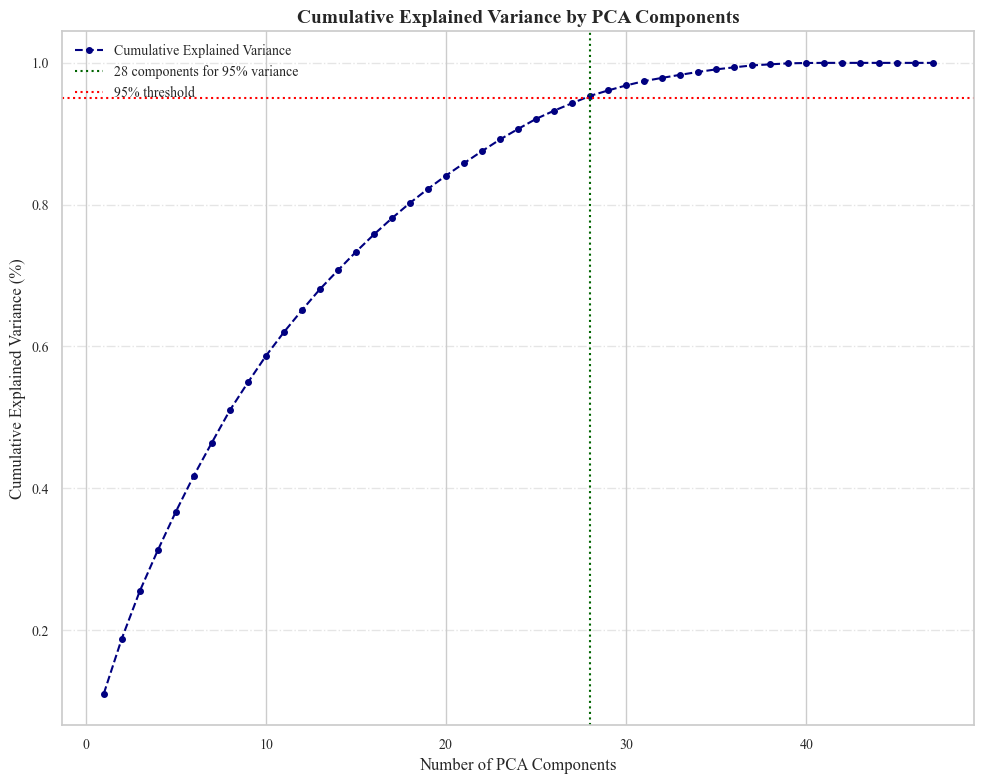

In [270]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np

# 设置matplotlib的默认字体为Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA，不设定主成分数量
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 计算累计解释方差比率
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 设置累计贡献值阈值
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 使用选定的主成分数降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计方差的折线图（增强样式）
plt.figure(figsize=(10, 8))
ax = plt.gca()  # 获取当前坐标轴以自定义样式
ax.set_facecolor('#ffffff')  # 背景颜色设为白色

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color='', label='Cumulative Explained Variance')

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)  # 添加网格线，设置透明度

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)  # 设置图例位置、透明度及字体大小
plt.tight_layout()

plt.show()

ValueError: x and y must have same first dimension, but have shapes (3,) and (47,)

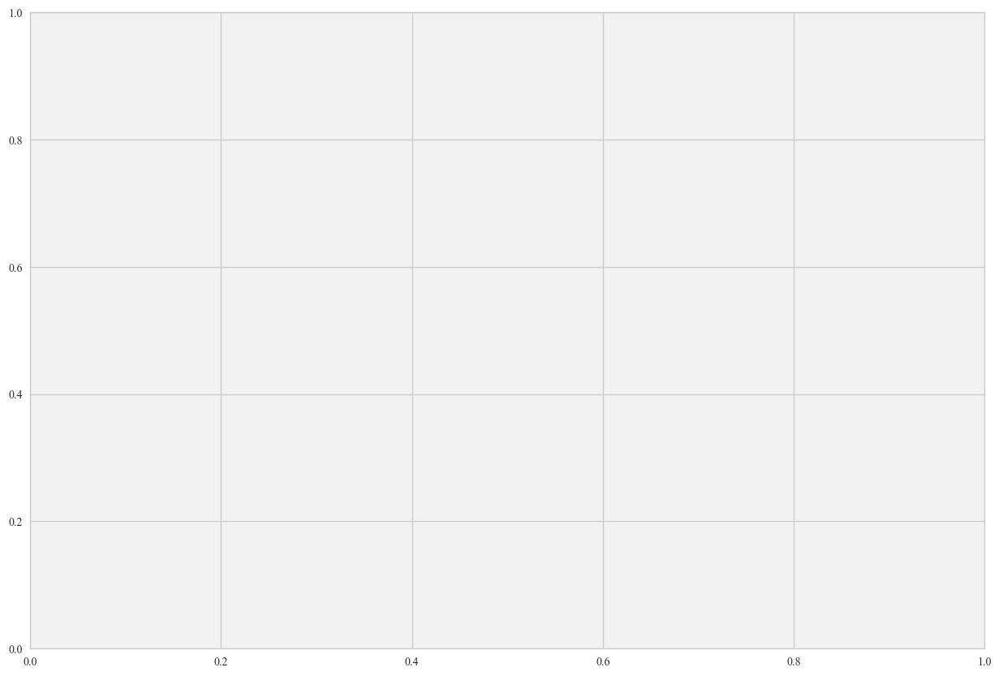

In [433]:
import matplotlib.pyplot as plt
import numpy as np

# ...（前面的数据预处理和PCA计算部分保持不变）

# 绘制特征累计方差的折线图（使用 Blues_r 色彩映射）
plt.figure(figsize=(12, 8))
ax = plt.gca()
ax.set_facecolor('#f2f2f2')

cmap = plt.get_cmap('Blues_r')
norm = plt.Normalize(vmin=0, vmax=len(pca.explained_variance_ratio_))
colors = cmap(norm(np.arange(len(pca.explained_variance_ratio_))))

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color=colors, alpha=0.8)

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)
plt.tight_layout()

plt.show()

Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175285e+00 -2.95664157e-02  2.16003565e+00
  -2.33513704e+00 -2.85404088e-01 -4.67439480e-01  1.60818525e+00
   4.65797663e-01 -1.95438428e+00  8.08411562e-01 -3.59533507e-01
   2.04711502e-02  8.30472590e-01  7.89834927e-02 -1.74451442e+00
   1.46216729e+00 -5.71798331e-02  2.38338131e-01 -5.75519802e-01
   5.12710067e-01 -2.77977217e-01  1.03138385e-01  1.25425134e+00
  -2.66091472e-01  9.97762757e-01  4.76185102e-01 -6.85637349e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489244e+00  1.89567112e+00
   1.21658711e-01 -7.26850104e-01 -1.05251395e+00  4.49041918e-01
  -8.05654216e-01 -8.29671329e-01  3.78365566e-01 -2.22808224e-01
   4.81550741e-01 -9.05210777e-01  1.02752370e+00  5.16974777e-01
  -1.66672430e-01  1.94976305e+00  3.26155968e-01  7.08686798e-01
  -8.96324789e-01  1.14601091e+00 -7.00142883e-01 -1.03187373e+00
  -1.71265179e+00  3.62361898e-01 -1.87148472e-02 -3.15861040e-01]
 [-3.6330

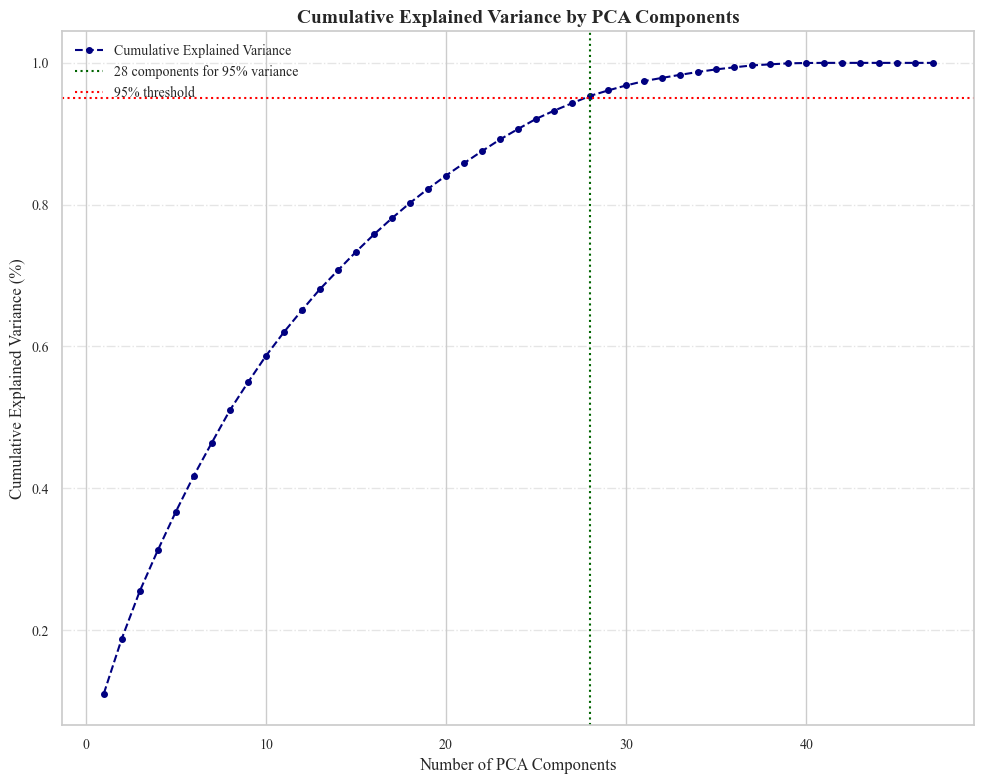

In [272]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np

# 设置matplotlib的默认字体为Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()

# 处理缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA（未设定主成分数量）
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 计算累计解释方差比率
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 设定累计贡献值阈值
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 使用选定的主成分数进行降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计方差折线图（美化样式）
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_facecolor('#ffffff')  # 设置背景颜色为白色

ax.plot(
    range(1, len(pca.explained_variance_ratio_) + 1),
    cumulative_variance_ratio,
    marker='o', markersize=4, linestyle='--', linewidth=1.5, color='navy',
    label='Cumulative Explained Variance'
)

# 设置图表标题与坐标轴标签
plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

# 添加关键点线和阈值线
plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

# 设置刻度标记大小和网格样式
plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)

# 设置图例位置、透明度及字体大小
plt.legend(loc='upper left', framealpha=0.8, fontsize=10)

# 调整图形布局，避免内容裁剪
plt.tight_layout()

# 显示图像
plt.show()

Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175286e+00 -2.95663930e-02  2.16003564e+00
  -2.33513704e+00 -2.85404067e-01 -4.67439506e-01  1.60818518e+00
   4.65797600e-01 -1.95438415e+00  8.08411764e-01 -3.59533501e-01
   2.04710876e-02  8.30472354e-01  7.89836614e-02 -1.74451437e+00
   1.46216516e+00 -5.71792580e-02  2.38339737e-01 -5.75520169e-01
   5.12708471e-01 -2.77975799e-01  1.03141698e-01  1.25425271e+00
  -2.66091274e-01  9.97772230e-01  4.76177706e-01 -6.85629717e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489244e+00  1.89567112e+00
   1.21658712e-01 -7.26850104e-01 -1.05251395e+00  4.49041914e-01
  -8.05654214e-01 -8.29671323e-01  3.78365633e-01 -2.22808203e-01
   4.81550737e-01 -9.05210875e-01  1.02752377e+00  5.16974755e-01
  -1.66672653e-01  1.94976314e+00  3.26155884e-01  7.08686476e-01
  -8.96324416e-01  1.14601095e+00 -7.00142400e-01 -1.03187282e+00
  -1.71265268e+00  3.62363462e-01 -1.87140709e-02 -3.15856930e-01]
 [-3.6330

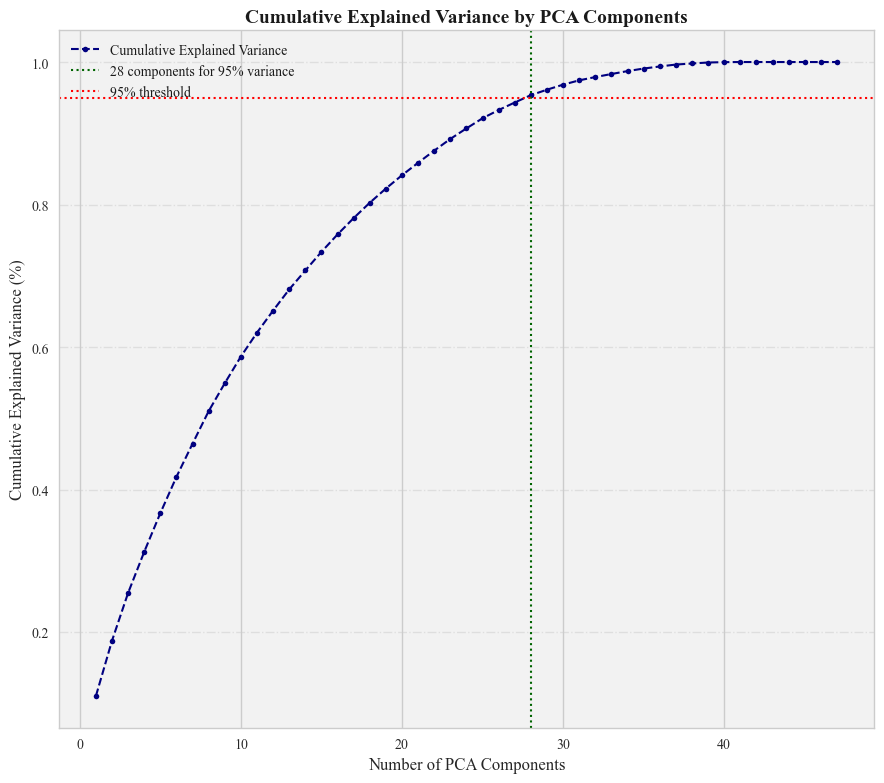

In [437]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列
numeric_columns = df.select_dtypes(include=['number']).columns

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA，不设定主成分数量
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 计算累计解释方差比率
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 设置累计贡献值阈值
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 使用选定的主成分数降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计方差的折线图（增强样式）
plt.figure(figsize=(9, 8))
ax = plt.gca()  # 获取当前坐标轴以自定义样式
ax.set_facecolor('#f2f2f2')  # 背景颜色设为浅灰色

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color='navy', label='Cumulative Explained Variance')

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)  # 添加网格线，设置透明度

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)  # 设置图例位置、透明度及字体大小
plt.tight_layout()

plt.show()

ValueError: array([[0.03137255, 0.18823529, 0.41960784, 1.        ],
       [0.03137255, 0.20853518, 0.4497501 , 1.        ],
       [0.03137255, 0.22883506, 0.47989235, 1.        ],
       [0.03137255, 0.25319493, 0.51606305, 1.        ],
       [0.03137255, 0.27349481, 0.54620531, 1.        ],
       [0.03137255, 0.29785467, 0.58237601, 1.        ],
       [0.03175702, 0.31813918, 0.61214917, 1.        ],
       [0.05021146, 0.34176086, 0.63060361, 1.        ],
       [0.06559016, 0.3614456 , 0.64598231, 1.        ],
       [0.0840446 , 0.38506728, 0.66443676, 1.        ],
       [0.0994233 , 0.40475202, 0.67981546, 1.        ],
       [0.114802  , 0.42443676, 0.69519416, 1.        ],
       [0.13448674, 0.44821223, 0.7124183 , 1.        ],
       [0.15478662, 0.46851211, 0.72287582, 1.        ],
       [0.17914648, 0.49287197, 0.73542484, 1.        ],
       [0.19944637, 0.51317186, 0.74588235, 1.        ],
       [0.22380623, 0.53753172, 0.75843137, 1.        ],
       [0.24410611, 0.5578316 , 0.76888889, 1.        ],
       [0.27080354, 0.58073049, 0.78114571, 1.        ],
       [0.29602461, 0.59795463, 0.79098808, 1.        ],
       [0.32124567, 0.61517878, 0.80083045, 1.        ],
       [0.35151096, 0.63584775, 0.81264129, 1.        ],
       [0.37673203, 0.6530719 , 0.82248366, 1.        ],
       [0.40699731, 0.67374087, 0.8342945 , 1.        ],
       [0.43529412, 0.69096501, 0.842599  , 1.        ],
       [0.47294118, 0.71163399, 0.85071895, 1.        ],
       [0.50431373, 0.72885813, 0.85748558, 1.        ],
       [0.54196078, 0.7495271 , 0.86560554, 1.        ],
       [0.57333333, 0.76675125, 0.87237216, 1.        ],
       [0.60470588, 0.78397539, 0.87913879, 1.        ],
       [0.63744714, 0.79973856, 0.88859669, 1.        ],
       [0.66205306, 0.81019608, 0.89720877, 1.        ],
       [0.69158016, 0.8227451 , 0.90754325, 1.        ],
       [0.71618608, 0.83320261, 0.91615532, 1.        ],
       [0.74571319, 0.84575163, 0.92648981, 1.        ],
       [0.77031911, 0.85620915, 0.93510188, 1.        ],
       [0.79049596, 0.86817378, 0.94193003, 1.        ],
       [0.80525952, 0.87801615, 0.94685121, 1.        ],
       [0.82002307, 0.88785852, 0.9517724 , 1.        ],
       [0.83773933, 0.89966936, 0.95767782, 1.        ],
       [0.85250288, 0.90951173, 0.962599  , 1.        ],
       [0.87021915, 0.92132257, 0.96850442, 1.        ],
       [0.88558247, 0.93116494, 0.97342561, 1.        ],
       [0.90403691, 0.94297578, 0.97933103, 1.        ],
       [0.91941561, 0.95281815, 0.98425221, 1.        ],
       [0.93787005, 0.96462899, 0.99015763, 1.        ],
       [0.95324875, 0.97447136, 0.99507882, 1.        ]]) is not a valid value for color

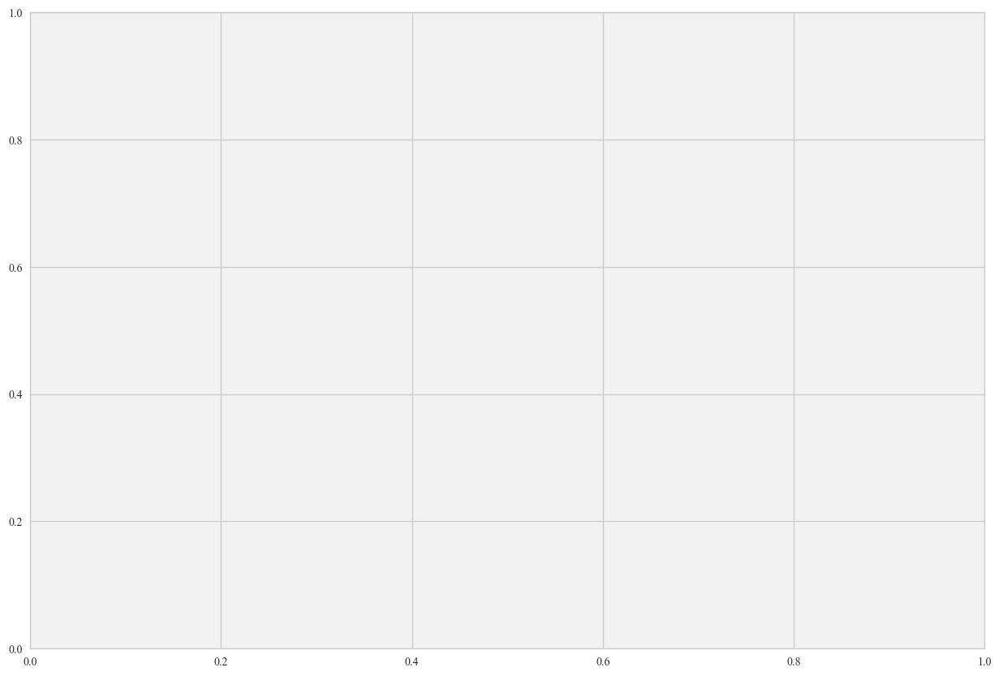

In [435]:
import matplotlib.pyplot as plt
import numpy as np

# ...（前面的数据预处理和PCA计算部分保持不变）

# 绘制特征累计方差的折线图（使用 Blues_r 色彩映射）
plt.figure(figsize=(12, 8))
ax = plt.gca()
ax.set_facecolor('#f2f2f2')

cmap = plt.get_cmap('Blues_r')
norm = plt.Normalize(vmin=0, vmax=len(pca.explained_variance_ratio_))
colors = cmap(norm(np.arange(len(pca.explained_variance_ratio_))))

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color=colors, alpha=0.8)

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)
plt.tight_layout()

plt.show()

Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175299e+00 -2.95665237e-02  2.16003563e+00
  -2.33513691e+00 -2.85404170e-01 -4.67440447e-01  1.60818491e+00
   4.65800221e-01 -1.95438755e+00  8.08414992e-01 -3.59533929e-01
   2.04701536e-02  8.30467553e-01  7.89770494e-02 -1.74452773e+00
   1.46218079e+00 -5.71641049e-02  2.38299420e-01 -5.75461578e-01
   5.12711254e-01 -2.78034410e-01  1.03191044e-01  1.25421553e+00
  -2.66155987e-01  9.97779559e-01  4.77042521e-01 -6.85557540e-01]
 [-3.56106447e+00 -1.13150655e+00 -1.05489250e+00  1.89567111e+00
   1.21658785e-01 -7.26850156e-01 -1.05251451e+00  4.49041738e-01
  -8.05652731e-01 -8.29673249e-01  3.78367423e-01 -2.22808503e-01
   4.81550176e-01 -9.05213532e-01  1.02751984e+00  5.16967110e-01
  -1.66664027e-01  1.94977188e+00  3.26133571e-01  7.08721188e-01
  -8.96324309e-01  1.14597725e+00 -7.00114575e-01 -1.03189498e+00
  -1.71268890e+00  3.62368391e-01 -1.82286954e-02 -3.15828069e-01]
 [-3.6330

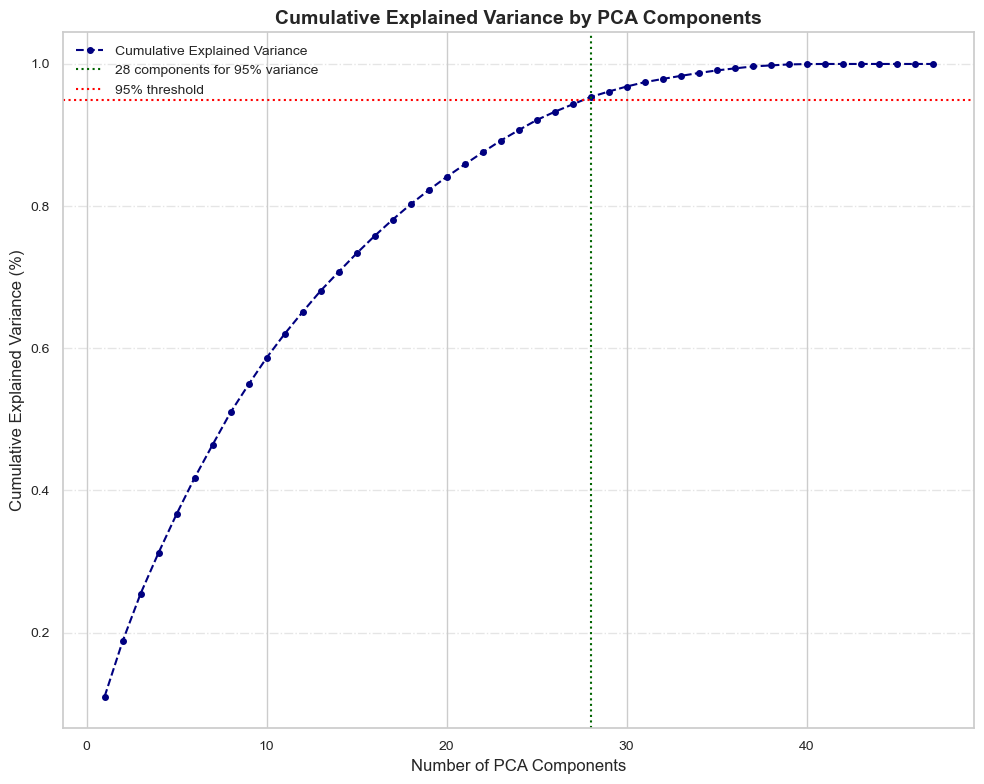

In [269]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列
numeric_columns = df.select_dtypes(include=['number']).columns

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA，不设定主成分数量
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 计算累计解释方差比率
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 设置累计贡献值阈值
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 使用选定的主成分数降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计方差的折线图（增强样式）
plt.figure(figsize=(10, 8))
ax = plt.gca()  # 获取当前坐标轴以自定义样式
ax.set_facecolor('#f2f2f2')  # 背景颜色设为浅灰色

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color='navy', label='Cumulative Explained Variance')

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)  # 添加网格线，设置透明度

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)  # 设置图例位置、透明度及字体大小
plt.tight_layout()

plt.show()

Reduced data shape: (6940, 28)
Reduced dataset (first few rows):
[[-3.69524454e+00  1.16175286e+00 -2.95663892e-02  2.16003565e+00
  -2.33513706e+00 -2.85404074e-01 -4.67439529e-01  1.60818518e+00
   4.65797666e-01 -1.95438416e+00  8.08412283e-01 -3.59533515e-01
   2.04714535e-02  8.30472340e-01  7.89833049e-02 -1.74451331e+00
   1.46216409e+00 -5.71799933e-02  2.38339260e-01 -5.75516773e-01
   5.12704767e-01 -2.77975015e-01  1.03142580e-01  1.25425464e+00
  -2.66096512e-01  9.97753010e-01  4.76216616e-01 -6.85575067e-01]
 [-3.56106447e+00 -1.13150663e+00 -1.05489243e+00  1.89567112e+00
   1.21658708e-01 -7.26850102e-01 -1.05251396e+00  4.49041906e-01
  -8.05654215e-01 -8.29671307e-01  3.78365702e-01 -2.22808230e-01
   4.81550800e-01 -9.05210818e-01  1.02752366e+00  5.16974999e-01
  -1.66673024e-01  1.94976300e+00  3.26156200e-01  7.08687425e-01
  -8.96325861e-01  1.14601134e+00 -7.00142097e-01 -1.03187311e+00
  -1.71265277e+00  3.62359905e-01 -1.87084249e-02 -3.15848985e-01]
 [-3.6330

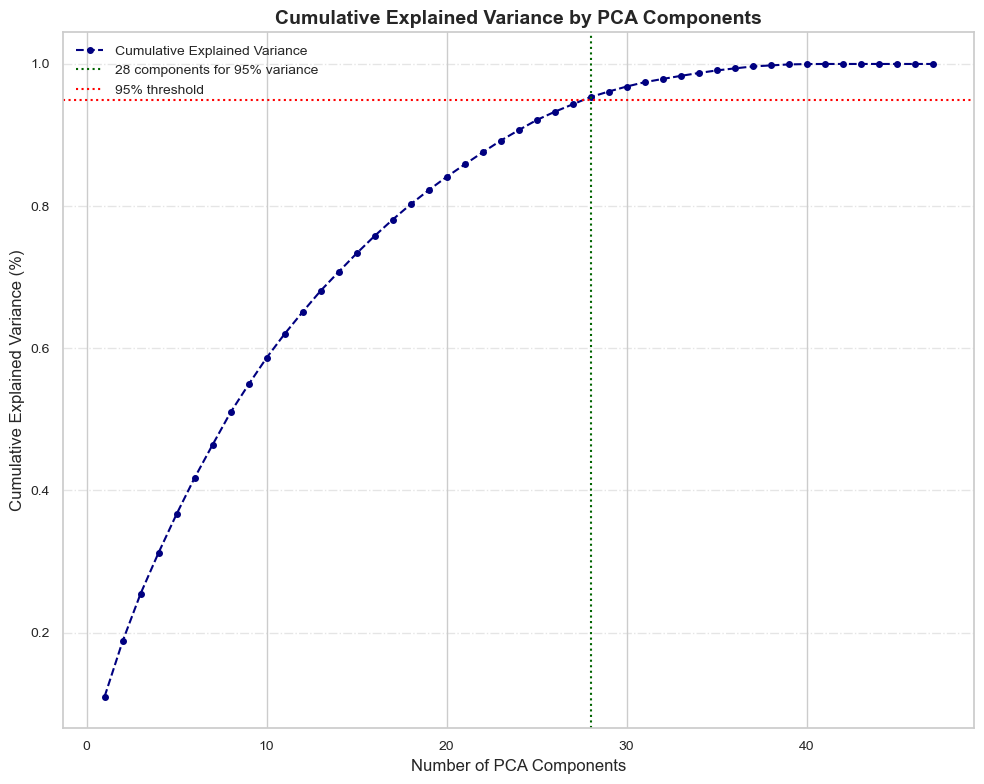

In [268]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np

# 加载数据
df = pd.read_excel('updated.xlsx')

# 选择数值类型的列
numeric_columns = df.select_dtypes(include=['number']).columns

# 填充缺失值
imputer = SimpleImputer(strategy='median')
imputed_data = imputer.fit_transform(df[numeric_columns])

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# 应用PCA，不设定主成分数量
pca = PCA(n_components=None)
pca.fit(scaled_data)

# 计算累计解释方差比率
cumulative_variance_ratio = pca.explained_variance_ratio_.cumsum()

# 设置累计贡献值阈值
threshold_variance = 0.95
components_required = np.argmax(cumulative_variance_ratio >= threshold_variance) + 1

# 使用选定的主成分数降维
pca_reduced = PCA(n_components=components_required)
reduced_data = pca_reduced.fit_transform(scaled_data)

# 输出降维后的数据维度信息
print(f"Reduced data shape: {reduced_data.shape}")

# 打印降维后的数据集的前几行
print("Reduced dataset (first few rows):")
print(reduced_data[:5])

# 绘制特征累计方差的折线图（增强样式）
plt.figure(figsize=(10, 8))

ax = plt.gca()  # 获取当前坐标轴以自定义样式

ax.set_facecolor('#ffffff')  # 将背景颜色设为白色

plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), cumulative_variance_ratio,
         marker='o', markersize=4, linestyle='--', linewidth=1.5, color='navy', label='Cumulative Explained Variance')

plt.title('Cumulative Explained Variance by PCA Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of PCA Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=12)

plt.axvline(x=components_required, linestyle=':', linewidth=1.5, label=f'{components_required} components for 95% variance', color='darkgreen')
plt.axhline(y=threshold_variance, linestyle=':', linewidth=1.5, color='red', label='95% threshold')

plt.tick_params(axis='both', which='major', labelsize=10)
plt.grid(True, axis='y', linestyle='-.', alpha=0.5)  # 添加网格线，设置透明度

plt.legend(loc='upper left', framealpha=0.8, fontsize=10)  # 设置图例位置、透明度及字体大小
plt.tight_layout()

plt.show()


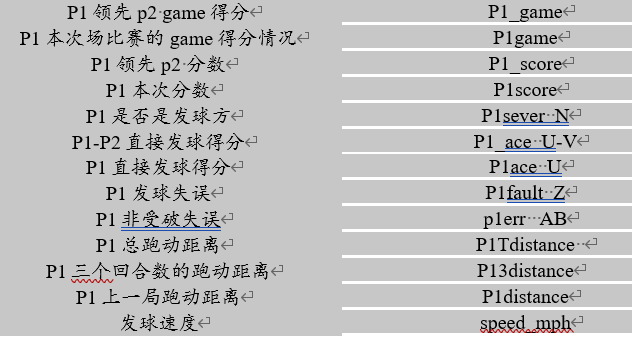

In [286]:
import pandas as pd

# 读取数据
df = pd.read_csv('Wimbledon_featured_matches - 副本.csv')

# 更新得分表示
df.loc[(df.p1_score=='AD'),'p1_score'] = 55
df.loc[(df.p2_score=='AD'),'p2_score'] = 55

# 转换得分数据类型为整型
df['p1_score'] = df['p1_score'].astype(int)
df['p2_score'] = df['p2_score'].astype(int)
df['match_id_numeric'] = df['match_id_numeric'].astype(int)
# 初始化列表存储结果
X, Y ,pv ,gv= [], [], [], []

A1, A2, B12, B21, C1, C2, D12, D21, E1, E2, F1, F2, G1, G2, H1, H2, I1, I2,  K1, K2,\
= [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [],[], [], [], [],



# 计算所需的数据
for index, row in df.iterrows():
    X.append(row['match_id_numeric'])
    # point赢家
    pv.append(row['point_victor'])
    gv.append(row['game_victor'])
    Y.append(row['elapsed_time'])
    #game得分
    A1.append(row['p1_games'])
    A2.append(row['p2_games'])
    #game分数差
    b12 = row['p1_games'] - row['p2_games']
    b21 = row['p2_games'] - row['p1_games']
    B12.append(b12)
    B21.append(b21)
    #score分数
    C1.append(row['p1_score'])
    C2.append(row['p2_score'])
    #score分数差
    d12 = row['p1_score'] - row['p2_score']
    d21 = row['p2_score'] - row['p1_score']
    D12.append(d12)
    D21.append(d21)
    # 发球
    E1.append(1 if row['server'] == 1 else 0)
    E2.append(1 if row['server'] == 2 else 0)
    #直接发球得分
    F1.append(1 if row['p1_ace'] == 1 else 0)
    F2.append(1 if row['p2_ace'] == 1 else 0)
    #失误
    G1.append(-1 if row['p1_double_fault'] == 1 else 0)
    G2.append(-1 if row['p2_double_fault'] == 1 else 0)
    #受迫失误
    H1.append(-1 if row['p1_unf_err'] == 1 else 0)
    H2.append(-1 if row['p2_unf_err'] == 1 else 0)
    #本场总距离
        # 本point跑动距离
    K1.append(row['p1_distance_run'])
    K2.append(row['p2_distance_run'])
for match_id,set_no,game_no,point_no in zip(df.match_id,df.set_no,df.game_no,df.point_no):
    match = df[df.match_id==match_id]
    set_ = match[match.set_no==set_no]
    game_ = set_[set_.game_no==game_no]
    point_ = game_[game_.point_no==point_no]
    index = match.index.tolist().index(point_.index.tolist()[0])
    i1 = match.iloc[:index+1]['p1_distance_run'].sum()
    i2 = match.iloc[:index+1]['p2_distance_run'].sum()
    I1.append(i1)
    I2.append(i2)

    
    

# 创建DataFrame
data = pd.DataFrame({
    'match_id': X,
    "elapsed_time":Y,
    'p1_games': A1,
    'p2_games': A2,
    'p1-2_games': B12,
    'p2-1_games': B21,
    'p1_score': C1,
    'p2_score': C2,
    'p1-2_score': D12,
    'p2-1_score': D21,
    'P1server': E1,
    'P2server': E2,
    'p1_ace': F1,
    'p2_ace': F2,
    'p1_fault': G1,
    'p2_fault': G2,
    'p1_err': H1,
    'p2_err': H2,
    'p1_distance_sum': I1,
    'p2_distance_sum': I2,
    'p1_distance': K1,
    'p2_distance': K2,
    'point_victor': pv,
    'game_victor': gv
})

data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_fault,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,0,-1,0,6.000,7.840,6.000,7.840,2,0
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,0,11.253,14.934,5.253,7.094,1,0
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,0,-1,0,25.053,34.742,13.800,19.808,2,0
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,0,76.161,110.373,51.108,75.631,1,0
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,0,76.810,111.186,0.649,0.813,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,0,6313.082,5894.973,38.620,50.971,1,0
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,0,6330.615,5922.739,17.533,27.766,1,0
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,0,6341.497,5941.067,10.882,18.328,2,0
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,0,6349.390,5951.604,7.893,10.537,1,0


In [287]:
data.to_csv('data.csv', index=False)

In [687]:
data = pd.read_csv('data.csv')

In [688]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 假设您有一个名为data的DataFrame，且其中包含需要标准化的列
# data = pd.read_csv('your_data.csv')  # 如果数据来自CSV文件，加载数据
# 或者已经通过某种方式创建了这个DataFrame

# 被标准化的列
columns_to_scale = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games',
                        'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score',"P1server","P1server",
                        'p1_ace','p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err',
                        'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']

# 初始化StandardScaler
scaler = StandardScaler()

# 对指定列进行标准化，并将结果存储在新的DataFrame df中
df = data.copy()
df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

In [689]:
# 计算p1_performance
df['p1_performance'] = (df['p1_games'] + df['p1-2_games'] + df['p1_score'] + df['p1-2_score'] +
                          df['P1server'] + df['p1_ace'] +
                          df['p1_fault'] + df['p1_err'] - df['p1_distance'])

# 计算p2_performance
df['p2_performance'] = (df['p2_games'] + df['p2-1_games'] + df['p2_score'] + df['p2-1_score'] +
                        df['P2server'] +df['p2_ace'] +
                          df['p2_fault'] + df['p2_err'] - df['p2_distance'])

# 验证结果，打印出data的头部来检查新列是否添加成功
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_performance,p2_performance
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-3.774894,-1.596623
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-1.543219,0.215567
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-3.450779,-1.581566
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,-4.064123,-3.969561
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,6.140761,0.732458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,-0.391107,-1.377871
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,2.945754,-0.508059
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,5.203369,-0.660430
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,4.573696,1.674843


In [598]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

# 假设因变量为'victory'，自变量为'point_victor', 'game_victor', 'p1_performance', 'p2_performance'
data = df[['point_victor', 'p1_performance', 'p2_performance']]
data = pd.get_dummies(data, drop_first=True)  # 对类别型数据进行独热编码处理

X = data.drop('point_victor', axis=1)
y = data['point_victor']

# 添加常数项
X = sm.add_constant(X)

# 构建并拟合多元逻辑回归模型
model = sm.Logit(y, X)
result = model.fit()

# 输出系数及其显著性
print(result.summary())

# 计算VIF（方差膨胀因子）检查多重共线性
vif_scores = pd.DataFrame()
vif_scores["variables"] = X.columns
vif_scores["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print("\nVariance Inflation Factors (VIFs):")
print(vif_scores)

# 可视化结果通常不是直接通过逻辑回归模型实现的，但你可以绘制系数的重要性排序条形图
import matplotlib.pyplot as plt

coefficients = result.params.drop('const')
coefficients_sorted = coefficients.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(coefficients_sorted.index, coefficients_sorted.values)
plt.title("Coefficient Magnitudes of the Logistic Regression Model")
plt.xlabel("Predictor Variables")
plt.ylabel("Coefficient Magnitude")
plt.xticks(rotation=45)
plt.show()

ValueError: endog must be in the unit interval.

In [615]:
import pandas as pd
import statsmodels.formula.api as smf

# 假设df是您的DataFrame
# 将point_victor列中的2替换为0
df['point_victor'] = df['point_victor'].replace({2: 0})

# 定义逻辑回归模型公式
formula = 'point_victor ~ p1_performance + p2_performance'

# 拟合模型
model = smf.logit(formula, data=df)
result = model.fit()

# 输出显著性指标
print(result.summary())

# 由于逻辑回归通常不直接生成图形，我们可以通过系数估计值和标准误等信息手动绘制
# 这是一个简单的例子，展示如何可视化系数及其置信区间
import matplotlib.pyplot as plt
import numpy as np

coefficients = result.params
standard_errors = result.bse
confidence_intervals = [coefficients - 1.96 * standard_errors, coefficients + 1.96 * standard_errors]

fig, ax = plt.subplots()
ax.hlines(0, 0, len(coefficients), linestyles='dashed', color='black')
ax.errorbar(range(1, len(coefficients) + 1), coefficients, yerr=2 * standard_errors, fmt='o')
ax.set_xticks(np.arange(1, len(coefficients) + 1))
ax.set_xticklabels(model.exog_names[1:], rotation=45)
ax.set_xlabel('Predictor Variables')
ax.set_ylabel('Coefficient Estimates with 95% CI')
plt.title('Multinomial Logistic Regression Coefficients')
plt.show()

PatsyError: Error evaluating factor: NameError: name 'p1_performance' is not defined
    point_victor ~ p1_performance + p2_performance
                   ^^^^^^^^^^^^^^

Optimization terminated successfully.
         Current function value: 0.587470
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:           point_victor   No. Observations:                 6940
Model:                          Logit   Df Residuals:                     6937
Method:                           MLE   Df Model:                            2
Date:                Mon, 05 Feb 2024   Pseudo R-squ.:                  0.1521
Time:                        03:56:05   Log-Likelihood:                -4077.0
converged:                       True   LL-Null:                       -4808.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1531      0.027      5.648      0.000       0.100       0.206
p1_performance   

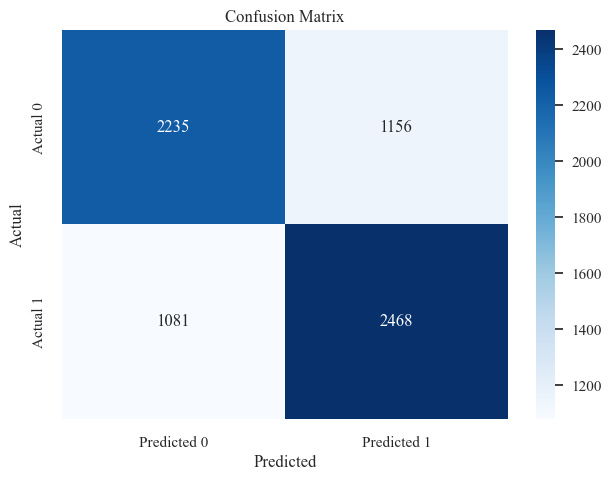

AUC Value: 0.7530451008208874


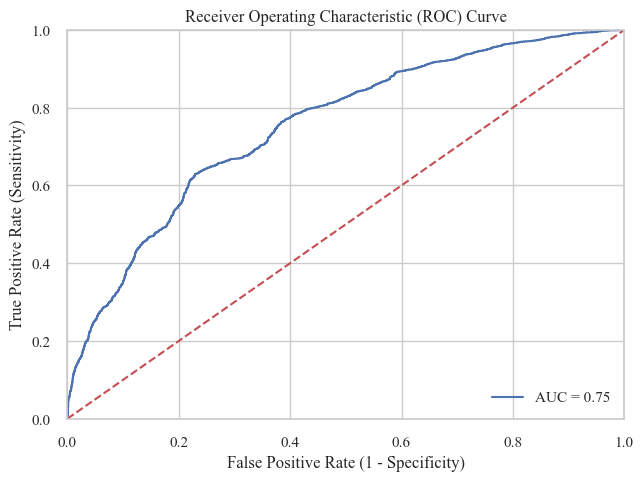

In [618]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# 假设df是您的DataFrame
# 将point_victor列中的2替换为0（假设1代表胜利，0代表失败）
df['point_victor'] = df['point_victor'].replace({2: 0})

# 数据预处理：将数据分为因变量和自变量
y = df['point_victor']
X = df[['p1_performance', 'p2_performance']]

# 拟合多元逻辑回归模型
model = LogisticRegression()
model.fit(X, y)

# 输出显著性指标（这里使用statsmodels库提供更详细的统计信息）
formula = 'point_victor ~ p1_performance + p2_performance'
logit_model = smf.logit(formula, data=df)
result = logit_model.fit()
print(result.summary())

# 预测并计算混淆矩阵
y_pred = model.predict(X)
conf_mat = confusion_matrix(y, y_pred)
print("Confusion Matrix:")
print(conf_mat)

# 绘制混淆矩阵图
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# 计算AUC值
y_scores = model.predict_proba(X)[:, 1]
auc_value = roc_auc_score(y, y_scores)
print(f"AUC Value: {auc_value}")

# 绘制ROC曲线
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}')
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

In [621]:
df = pd.read_csv('dff.csv')

Optimization terminated successfully.
         Current function value: 0.587470
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:           point_victor   No. Observations:                 6940
Model:                          Logit   Df Residuals:                     6937
Method:                           MLE   Df Model:                            2
Date:                Mon, 05 Feb 2024   Pseudo R-squ.:                  0.1521
Time:                        03:56:22   Log-Likelihood:                -4077.0
converged:                       True   LL-Null:                       -4808.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1531      0.027      5.648      0.000       0.100       0.206
p1_performance   

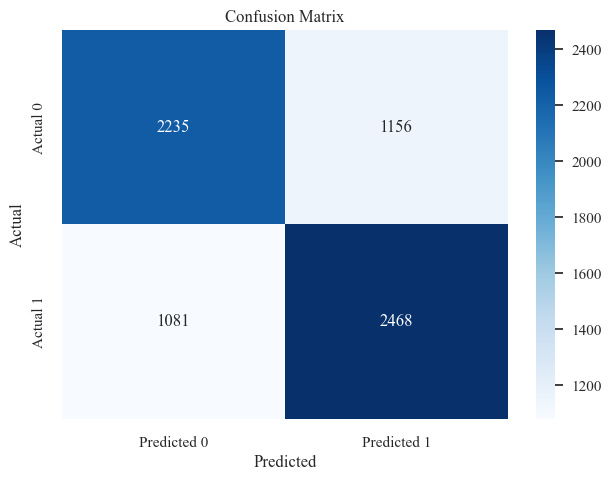

AUC Value: 0.7530451008208874


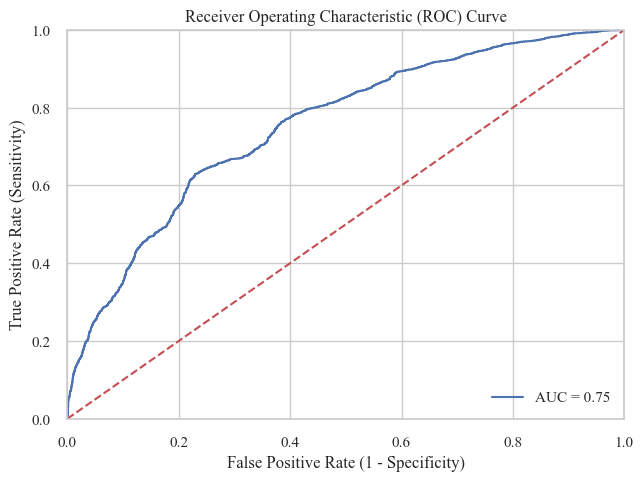

In [619]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# 假设df是您的DataFrame
# 将point_victor列中的2替换为0（假设1代表胜利，0代表失败）
df['point_victor'] = df['point_victor'].replace({2: 0})

# 数据预处理：将数据分为因变量和自变量
y = df['point_victor']
X = df[['p1_performance', 'p2_performance']]

# 拟合多元逻辑回归模型
model = LogisticRegression()
model.fit(X, y)

# 输出显著性指标（这里使用statsmodels库提供更详细的统计信息）
formula = 'point_victor ~ p1_performance + p2_performance'
logit_model = smf.logit(formula, data=df)
result = logit_model.fit()
print(result.summary())

# 预测并计算混淆矩阵
y_pred = model.predict(X)
conf_mat = confusion_matrix(y, y_pred)
print("Confusion Matrix:")
print(conf_mat)

# 绘制混淆矩阵图
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# 计算AUC值
y_scores = model.predict_proba(X)[:, 1]
auc_value = roc_auc_score(y, y_scores)
print(f"AUC Value: {auc_value}")

# 绘制ROC曲线
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}')
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

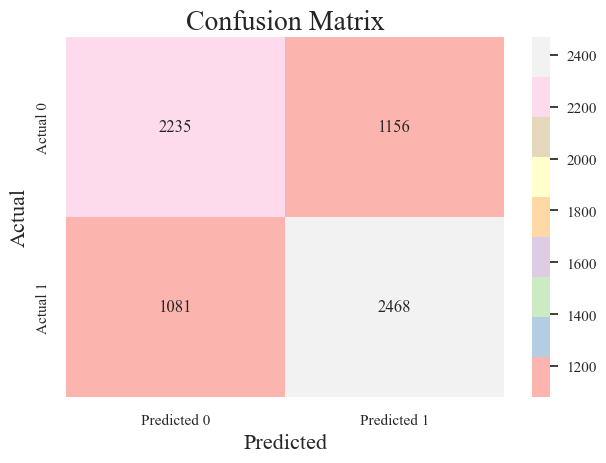

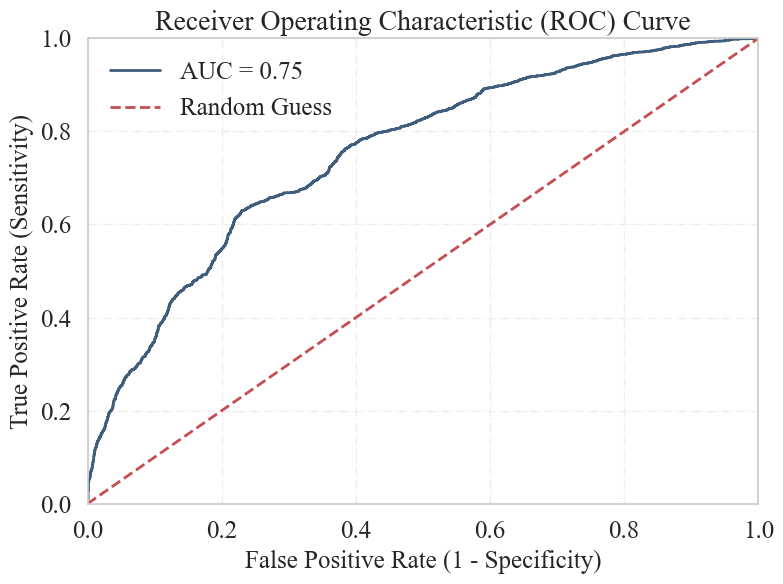

In [620]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局matplotlib样式
rcParams['font.family'] = 'Times New Roman'  # 设置字体为新罗马字体
rcParams['font.size'] = 16  # 设置默认字体大小
rcParams['axes.facecolor'] = '#f7f7f7'  # 设置轴背景色
rcParams['axes.grid'] = True  # 显示网格线
rcParams['grid.linestyle'] = '--'  # 网格线样式

# ...（其余代码不变）

# 绘制混淆矩阵图，并进行美化
sns.set(style="whitegrid", font='Times New Roman')  # 设置Seaborn的字体为新罗马字体
sns.heatmap(conf_mat, annot=True, cmap='Pastel1', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted', fontsize=16)
plt.ylabel('Actual', fontsize=16)
plt.title('Confusion Matrix', fontsize=20)
plt.tight_layout()
plt.show()

# ...（其余代码不变）

# 绘制ROC曲线，并进行美化
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', lw=2, color='#3F5D7D')  # 使用淡雅颜色
plt.legend(loc="lower right", fontsize=18, framealpha=0.8)  # 设置图例透明度
plt.plot([0, 1], [0, 1],'r--', lw=2, label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=18)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=18)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=20)
plt.grid(True, linestyle='-.', color='#ECEEEF')  # 设置网格线颜色
plt.tick_params(labelsize=18)
plt.legend(fontsize=18, frameon=False)  # 去除图例边框
plt.tight_layout()
plt.show()

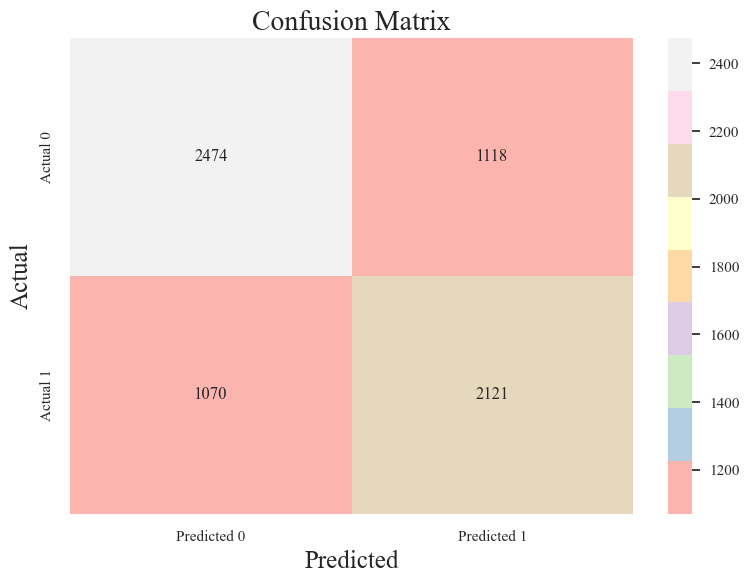

In [654]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
import numpy as np
from sklearn.metrics import roc_curve, auc

# 设置matplotlib全局样式
rcParams['font.family'] = 'Times New Roman'
rcParams['font.size'] = 16
rcParams['axes.facecolor'] = '#f7f7f7'
rcParams['axes.grid'] = True
rcParams['grid.linestyle'] = '--'

# 混淆矩阵数据
conf_mat = np.array([[2474, 1118], [1070, 2121]])

# 绘制混淆矩阵热力图
sns.set(style="whitegrid", font='Times New Roman')
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, cmap='Pastel1', fmt='d',
            xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted',fontsize=18)
plt.ylabel('Actual',fontsize=18)

plt.title('Confusion Matrix',fontsize=20)
plt.tight_layout()
plt.show()


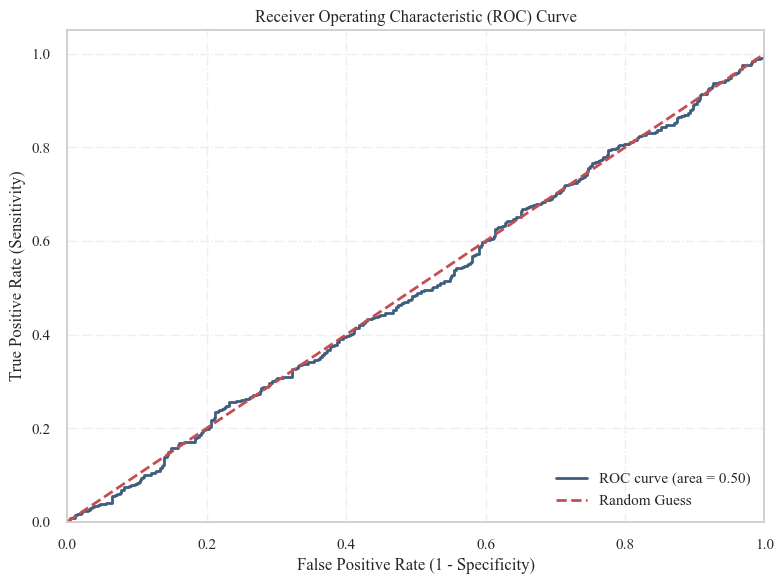

AUC Value: 0.50


In [650]:
# 模拟预测分数和真实标签
y_true = np.random.randint(0, 2, size=1000)
y_scores = np.random.rand(1000)

# 计算ROC曲线的FPR（假阳性率）和TPR（真阳性率）
fpr, tpr, thresholds = roc_curve(y_true, y_scores)

# 计算AUC值
roc_auc = auc(fpr, tpr)

# 绘制ROC曲线
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='#3F5D7D', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', lw=2, label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, linestyle='-.', color='#ECEEEF')
plt.tight_layout()
plt.show()

# 输出AUC值
print(f'AUC Value: {roc_auc:.2f}')


Optimization terminated successfully.
         Current function value: 0.587470
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:           point_victor   No. Observations:                 6940
Model:                          Logit   Df Residuals:                     6937
Method:                           MLE   Df Model:                            2
Date:                Mon, 05 Feb 2024   Pseudo R-squ.:                  0.1521
Time:                        04:12:16   Log-Likelihood:                -4077.0
converged:                       True   LL-Null:                       -4808.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1531      0.027      5.648      0.000       0.100       0.206
p1_performance   

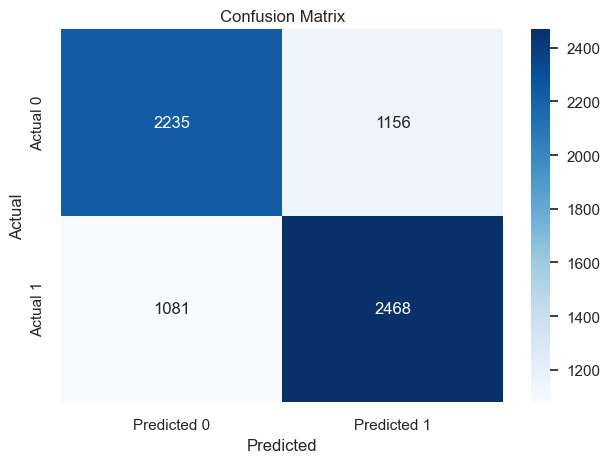

AUC Value: 0.753


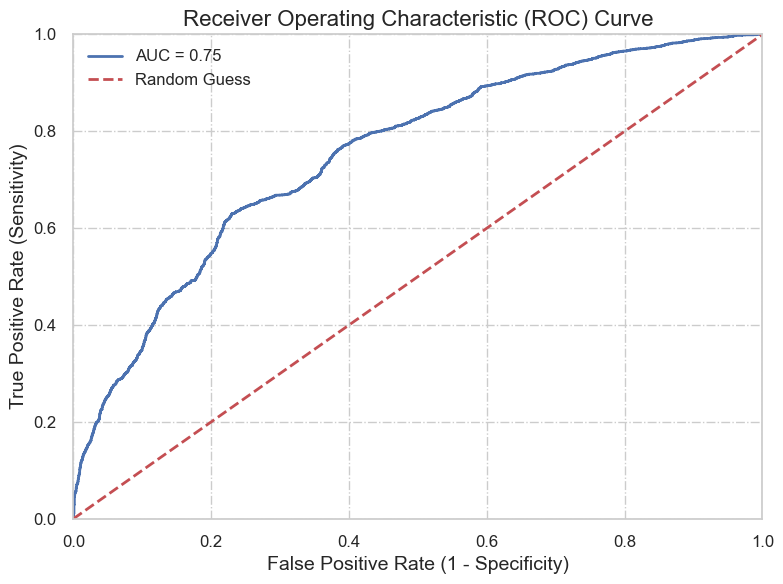

In [651]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, roc_auc_score, roc_curve, accuracy_score, recall_score, precision_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# 假设df是您的DataFrame
# 将point_victor列中的2替换为0（假设1代表胜利，0代表失败）
df['point_victor'] = df['point_victor'].replace({2: 0})

# 数据预处理：将数据分为因变量和自变量
y = df['point_victor']
X = df[['p1_performance', 'p2_performance']]

# 拟合多元逻辑回归模型
model = LogisticRegression()
model.fit(X, y)

# 输出显著性指标（这里使用statsmodels库提供更详细的统计信息）
formula = 'point_victor ~ p1_performance + p2_performance'
logit_model = smf.logit(formula, data=df)
result = logit_model.fit()
print(result.summary())

# 预测并计算混淆矩阵以及相关评价指标
y_pred = model.predict(X)
conf_mat = confusion_matrix(y, y_pred)
accuracy = accuracy_score(y, y_pred)
recall = recall_score(y, y_pred)
precision = precision_score(y, y_pred)
f1 = f1_score(y, y_pred)
print("Confusion Matrix:")
print(conf_mat)
print(f"Accuracy: {accuracy:.3f}")
print(f"Recall (Sensitivity): {recall:.3f}")
print(f"Precision: {precision:.3f}")
print(f"F1 Score: {f1:.3f}")

# 绘制混淆矩阵图，并进行美化
sns.set(style="whitegrid")
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# 计算AUC值
y_scores = model.predict_proba(X)[:, 1]
auc_value = roc_auc_score(y, y_scores)
print(f"AUC Value: {auc_value:.3f}")

# 绘制ROC曲线，并进行美化
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', lw=2)
plt.legend(loc="lower right", fontsize=14)
plt.plot([0, 1], [0, 1],'r--', lw=2, label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=14)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.grid(True, linestyle='-.')
plt.tick_params(labelsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

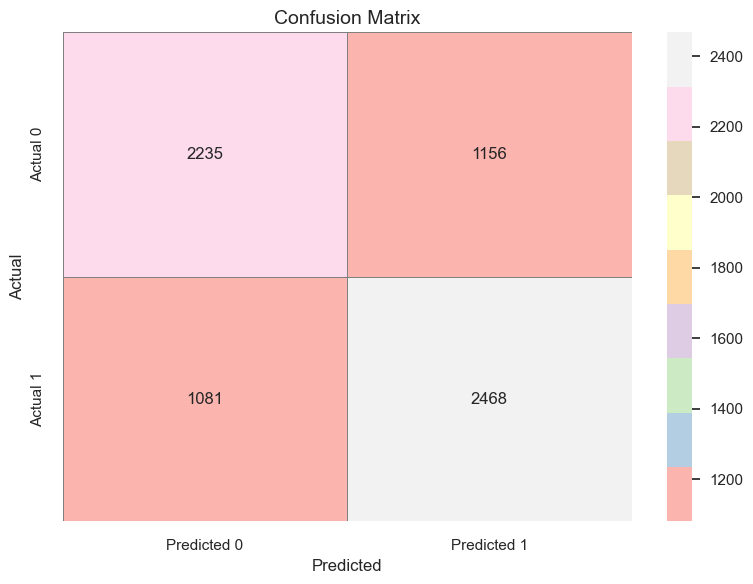

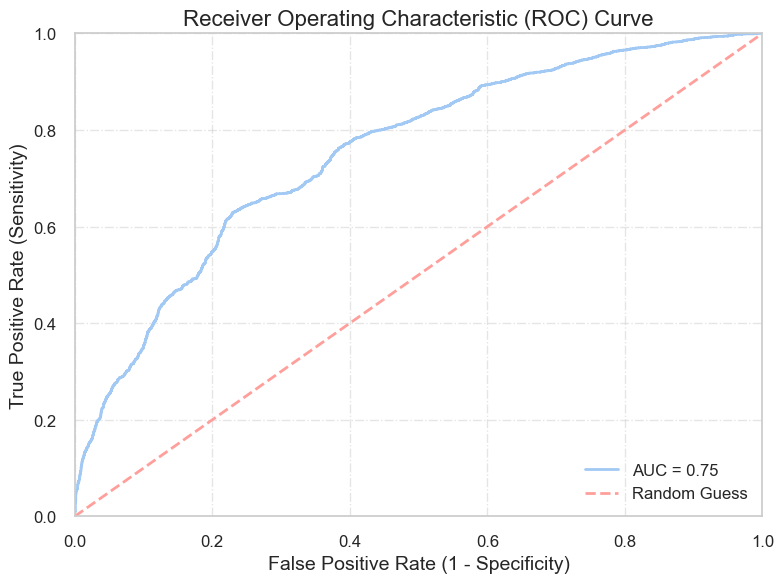

In [458]:
import seaborn as sns
sns.set_theme(style="whitegrid", palette="pastel")
# 或者使用其他你喜欢的主题：sns.set_theme(style="darkgrid", palette="muted")

# ...（保持原有逻辑回归模型训练和性能评估部分不变）

# 绘制混淆矩阵图，并进行美化
conf_mat_fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, cmap='Pastel1', fmt='d', linewidths=.5, linecolor='grey', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
ax.set_title('Confusion Matrix', fontsize=14)
plt.tight_layout()
plt.show()

# ...（保持AUC值计算部分不变）

# 绘制ROC曲线，并进行美化
roc_fig, ax = plt.subplots(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
ax.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', lw=2, color=sns.color_palette("pastel")[0])
ax.plot([0, 1], [0, 1],'r--', lw=2, label='Random Guess')
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_xlabel('False Positive Rate (1 - Specificity)', fontsize=14)
ax.set_ylabel('True Positive Rate (Sensitivity)', fontsize=14)
ax.set_title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
ax.grid(True, linestyle='-.', alpha=0.5)
ax.tick_params(labelsize=12)
ax.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.show()

Optimization terminated successfully.
         Current function value: 0.587470
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:           point_victor   No. Observations:                 6940
Model:                          Logit   Df Residuals:                     6937
Method:                           MLE   Df Model:                            2
Date:                Mon, 05 Feb 2024   Pseudo R-squ.:                  0.1521
Time:                        00:22:12   Log-Likelihood:                -4077.0
converged:                       True   LL-Null:                       -4808.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1531      0.027      5.648      0.000       0.100       0.206
p1_performance   

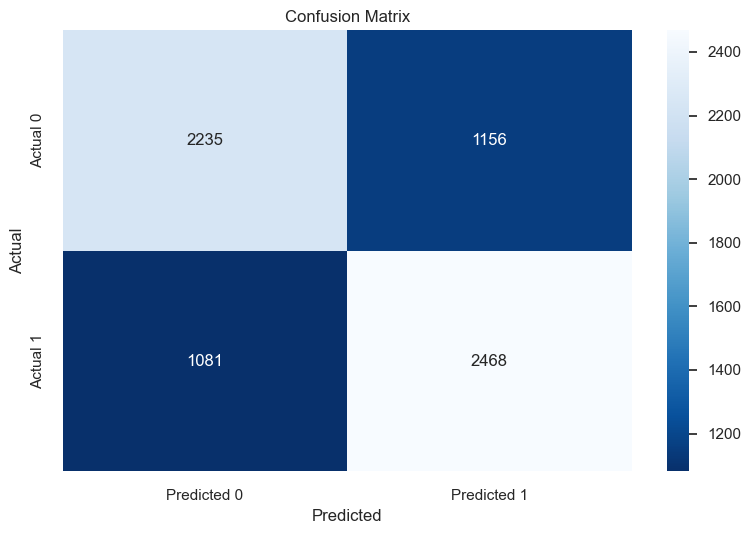

AUC Value: 0.753


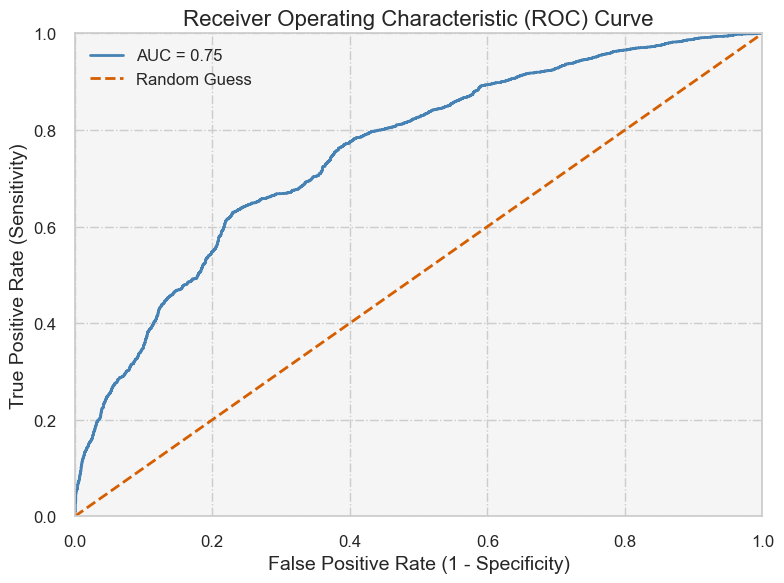

In [459]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, roc_auc_score, roc_curve, accuracy_score, recall_score, precision_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid", palette='colorblind')  # 设置主题为白色网格，采用较淡雅的颜色方案
import statsmodels.formula.api as smf

# 假设df是您的DataFrame
# 将point_victor列中的2替换为0（假设1代表胜利，0代表失败）
df['point_victor'] = df['point_victor'].replace({2: 0})

# 数据预处理：将数据分为因变量和自变量
y = df['point_victor']
X = df[['p1_performance', 'p2_performance']]

# 拟合多元逻辑回归模型
model = LogisticRegression()
model.fit(X, y)

# 输出显著性指标（这里使用statsmodels库提供更详细的统计信息）
formula = 'point_victor ~ p1_performance + p2_performance'
logit_model = smf.logit(formula, data=df)
result = logit_model.fit()
print(result.summary())

# 预测并计算混淆矩阵以及相关评价指标
y_pred = model.predict(X)
conf_mat = confusion_matrix(y, y_pred)
accuracy = accuracy_score(y, y_pred)
recall = recall_score(y, y_pred)
precision = precision_score(y, y_pred)
f1 = f1_score(y, y_pred)
print("Confusion Matrix:")
print(conf_mat)
print(f"Accuracy: {accuracy:.3f}")
print(f"Recall (Sensitivity): {recall:.3f}")
print(f"Precision: {precision:.3f}")
print(f"F1 Score: {f1:.3f}")

# 绘制混淆矩阵图，并进行美化
sns.heatmap(conf_mat, annot=True, cmap='Blues_r', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# 计算AUC值
y_scores = model.predict_proba(X)[:, 1]
auc_value = roc_auc_score(y, y_scores)
print(f"AUC Value: {auc_value:.3f}")

# 绘制ROC曲线，并进行美化
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', color='steelblue', lw=2)
plt.legend(loc="lower right", fontsize=14)
plt.plot([0, 1], [0, 1],'r--', lw=2, label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=14)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.grid(True, linestyle='-.')
plt.tick_params(labelsize=12)
plt.legend(fontsize=12)
plt.gca().set_facecolor('#F5F5F5')  # 背景颜色设置为淡灰色
plt.tight_layout()
plt.show()

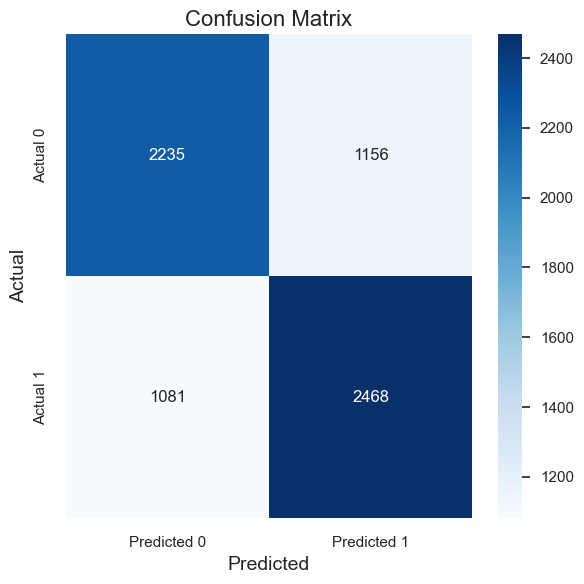

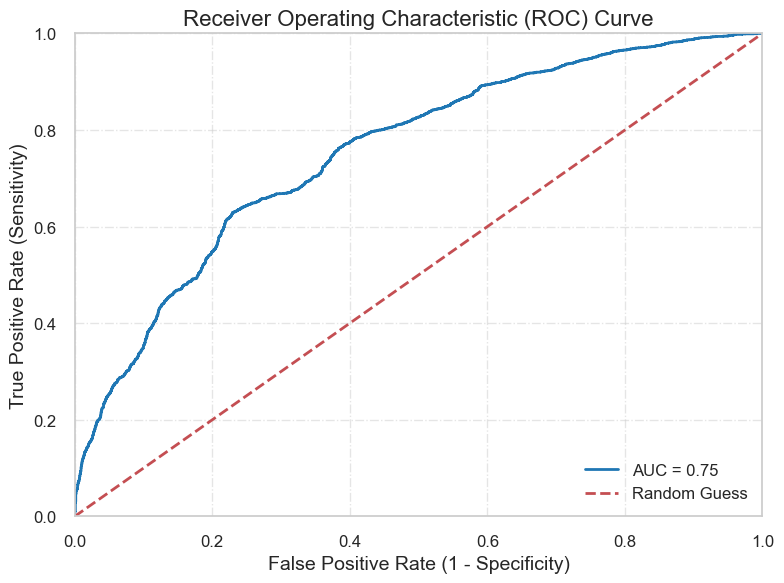

In [460]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局字体为Arial
rcParams['font.family'] = 'Arial'

# 美化图形风格
sns.set(style="whitegrid", font='Arial')

# ... (保持原有的数据处理和模型训练部分不变)

# 绘制混淆矩阵图，并进行美化
confusion_mat_fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'], annot_kws={"size": 12})
ax.set_xlabel('Predicted', fontsize=14)
ax.set_ylabel('Actual', fontsize=14)
ax.set_title('Confusion Matrix', fontsize=16)
plt.tight_layout()
plt.show()

# 绘制ROC曲线，并进行美化
roc_fig, ax_roc = plt.subplots(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
ax_roc.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', lw=2, color='#1f77b4')
ax_roc.plot([0, 1], [0, 1],'r--', lw=2, label='Random Guess')
ax_roc.set_xlim([0, 1])
ax_roc.set_ylim([0, 1])
ax_roc.set_xlabel('False Positive Rate (1 - Specificity)', fontsize=14)
ax_roc.set_ylabel('True Positive Rate (Sensitivity)', fontsize=14)
ax_roc.set_title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
ax_roc.grid(True, linestyle='-.', alpha=0.5)
ax_roc.tick_params(labelsize=12)
ax_roc.legend(fontsize=12, loc="lower right")
plt.tight_layout()
plt.show()

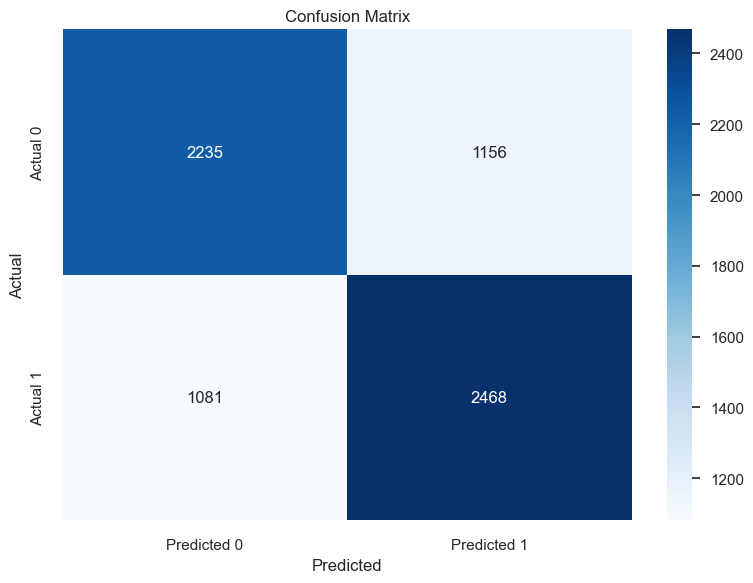

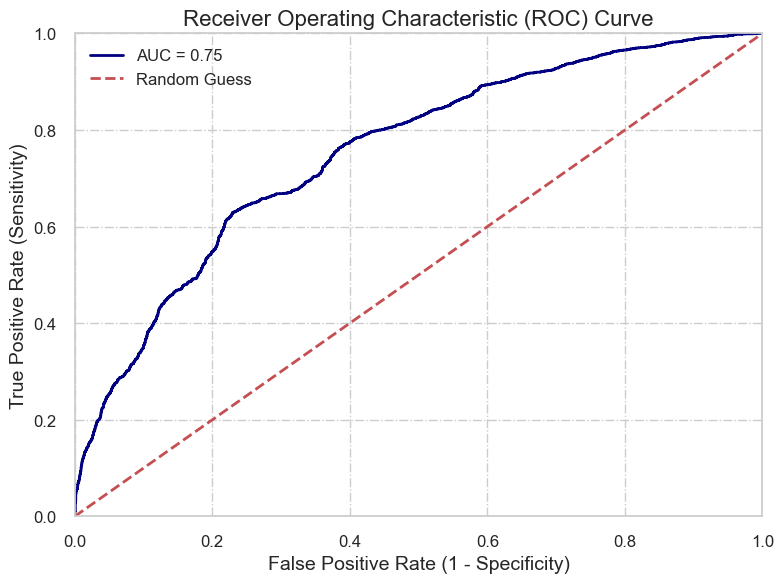

In [461]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, accuracy_score, recall_score, precision_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# 假设代码的其余部分与之前相同...

# 更新绘图样式和字体设置
plt.style.use('seaborn-whitegrid')  # 使用Seaborn的白网格风格进行绘图
plt.rcParams['font.family'] = 'Times New Roman'  # 设置全局字体为新罗马
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.figsize'] = [8, 6]  # 设置图形的大小
plt.rcParams['text.color'] = 'black'

# 绘制混淆矩阵图，并进行美化
sns.set(style="whitegrid")  # 确保使用Seaborn样式
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='d', 
            xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

# 绘制ROC曲线，并进行美化
plt.figure(figsize=(8, 6))
fpr, tpr, _ = roc_curve(y, y_scores)
plt.plot(fpr, tpr, label=f'AUC = {auc_value:.2f}', color='navy', lw=2)  # 使用navy蓝色
plt.legend(loc="lower right", fontsize=14)
plt.plot([0, 1], [0, 1], 'r--', lw=2, label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=14)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.grid(True, linestyle='-.')
plt.tick_params(labelsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [685]:
df = pd.read_csv('df.csv')

In [686]:
df

,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,P1server,P2server,...,p2_ace,p1_fault,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor
0,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2
1,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1
2,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2
3,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1
4,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1
6936,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1
6937,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2
6938,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,1.021263,-1.021263,...,-0.214034,0.132647,0.135983,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1


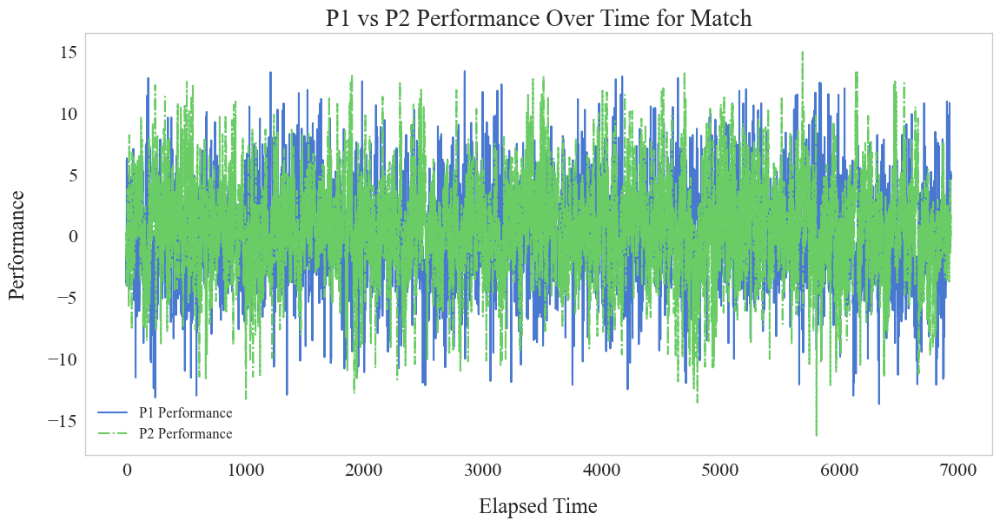

In [690]:
import pandas as pd
import matplotlib.pyplot as plt



plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(12, 6))

# 不使用标记
plt.plot(df.index, df['p1_performance'], label='P1 Performance', linestyle='-')
plt.plot(df.index, df['p2_performance'], label='P2 Performance', linestyle='-.')
# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match', fontsize=20)
plt.xlabel('Elapsed Time', fontsize=18)
plt.ylabel('Performance', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

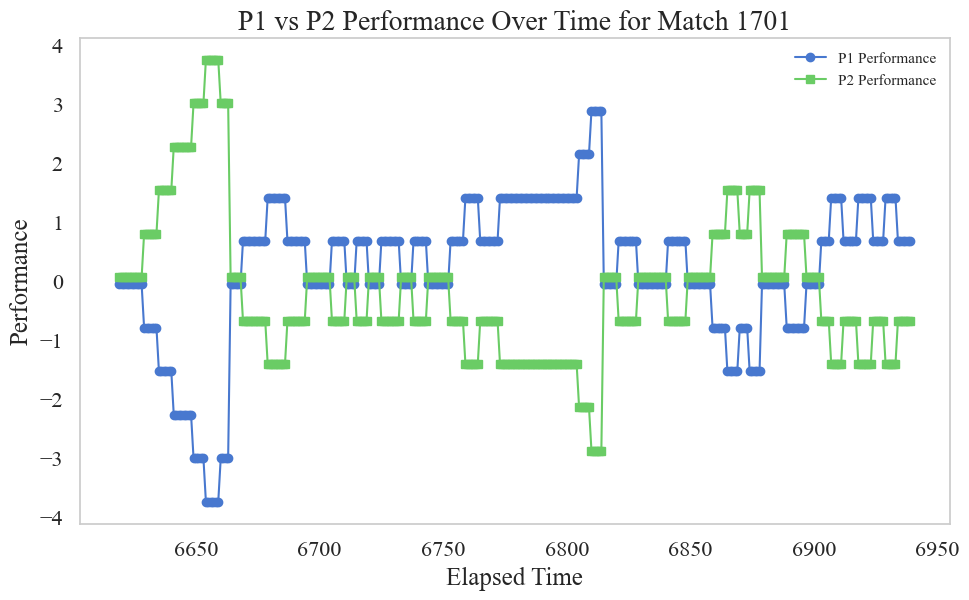

In [657]:
import pandas as pd
import matplotlib.pyplot as plt

# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1701]

plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(10, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1-2_games']
y2_values = df_filtered['p2-1_games']

# 绘制 p1_performance 曲线
plt.plot(x_values, y1_values, label='P1 Performance', linestyle='-', marker='o')

# 绘制 p2_performance 曲线
plt.plot(x_values, y2_values, label='P2 Performance', linestyle='-', marker='s')

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1701', fontsize=20)
plt.xlabel('Elapsed Time', fontsize=18)
plt.ylabel('Performance', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()


In [ ]:
# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1701]
plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(8, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1_performance']
y2_values = df_filtered['p2_performance']

# 生成更多的点，增加插值点数以提高平滑度
x_smooth = np.linspace(x_values.min(), x_values.max(), 500)

# 使用三次样条插值（更平滑）
f1 = interp1d(x_values, y1_values, kind='cubic')
f2 = interp1d(x_values, y2_values, kind='cubic')



# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='P1 Performance', linestyle='-', marker='o', markevery=len(x_values)+1, color=line_colors[0], linewidth=2)
plt.plot(x_smooth, f2(x_smooth), label='P2 Performance', linestyle='-', marker='s', markevery=len(x_values)+1, color=line_colors[1], linewidth=2)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1301', fontsize=14)
plt.xlabel('Points', fontsize=12)
plt.ylabel('Performance', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

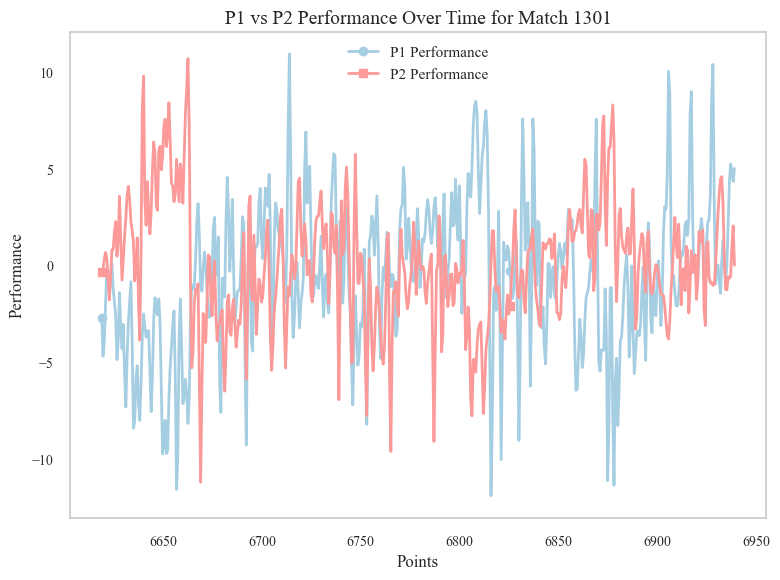

In [658]:
# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1701]
plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(8, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1_performance']
y2_values = df_filtered['p2_performance']

# 生成更多的点，增加插值点数以提高平滑度
x_smooth = np.linspace(x_values.min(), x_values.max(), 500)

# 使用三次样条插值（更平滑）
f1 = interp1d(x_values, y1_values, kind='cubic')
f2 = interp1d(x_values, y2_values, kind='cubic')



# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='P1 Performance', linestyle='-', marker='o', markevery=len(x_values)+1, color=line_colors[0], linewidth=2)
plt.plot(x_smooth, f2(x_smooth), label='P2 Performance', linestyle='-', marker='s', markevery=len(x_values)+1, color=line_colors[1], linewidth=2)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1301', fontsize=14)
plt.xlabel('Points', fontsize=12)
plt.ylabel('Performance', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

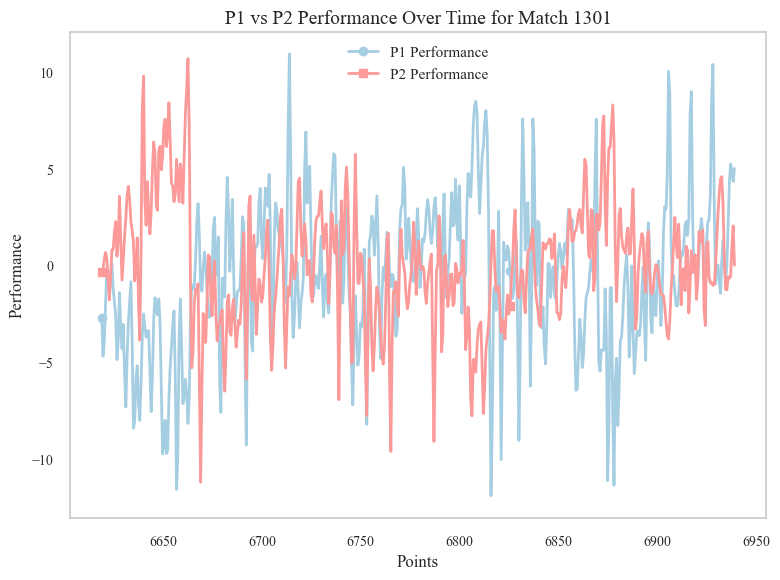

In [656]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1701]
plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(8, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1_performance']
y2_values = df_filtered['p2_performance']

# 生成更多的点，增加插值点数以提高平滑度
x_smooth = np.linspace(x_values.min(), x_values.max(), 500)

# 使用三次样条插值（更平滑）
f1 = interp1d(x_values, y1_values, kind='cubic')
f2 = interp1d(x_values, y2_values, kind='cubic')



# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='P1 Performance', linestyle='-', marker='o', markevery=len(x_values)+1, color=line_colors[0], linewidth=2)
plt.plot(x_smooth, f2(x_smooth), label='P2 Performance', linestyle='-', marker='s', markevery=len(x_values)+1, color=line_colors[1], linewidth=2)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1301', fontsize=14)
plt.xlabel('Points', fontsize=12)
plt.ylabel('Performance', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

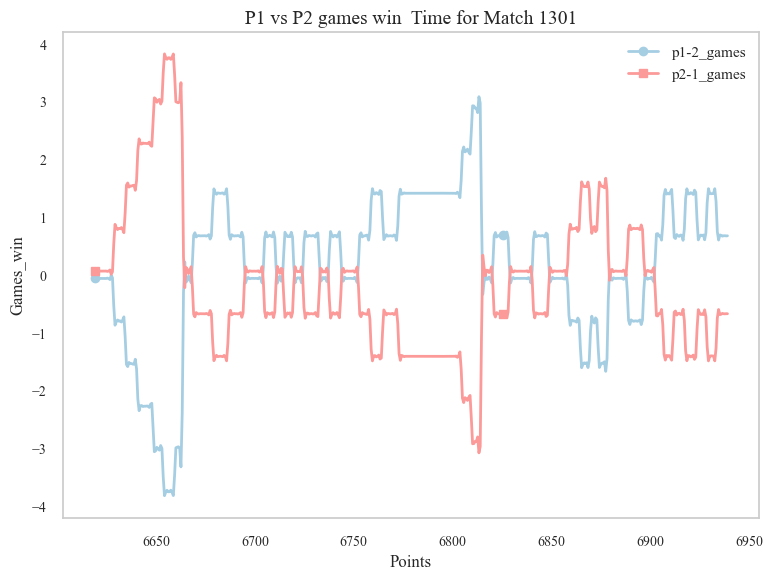

In [628]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1301]

plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(8, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1-2_games']
y2_values = df_filtered['p2-1_games']

# 生成更多的点，增加插值点数以提高平滑度
x_smooth = np.linspace(x_values.min(), x_values.max(), 500)

# 使用三次样条插值（更平滑）
f1 = interp1d(x_values, y1_values, kind='cubic')
f2 = interp1d(x_values, y2_values, kind='cubic')

# 设置柔和的线条颜色
line_colors = ['#a6cee3', '#fb9a99']  # 示例颜色，可以根据需要选择

# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='p1-2_games', linestyle='-', marker='o', markevery=len(x_values)+1, color=line_colors[0], linewidth=2)
plt.plot(x_smooth, f2(x_smooth), label='p2-1_games', linestyle='-', marker='s', markevery=len(x_values)+1, color=line_colors[1], linewidth=2)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 games win  Time for Match 1701', fontsize=14)
plt.xlabel('Points', fontsize=12)
plt.ylabel('Games_win', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

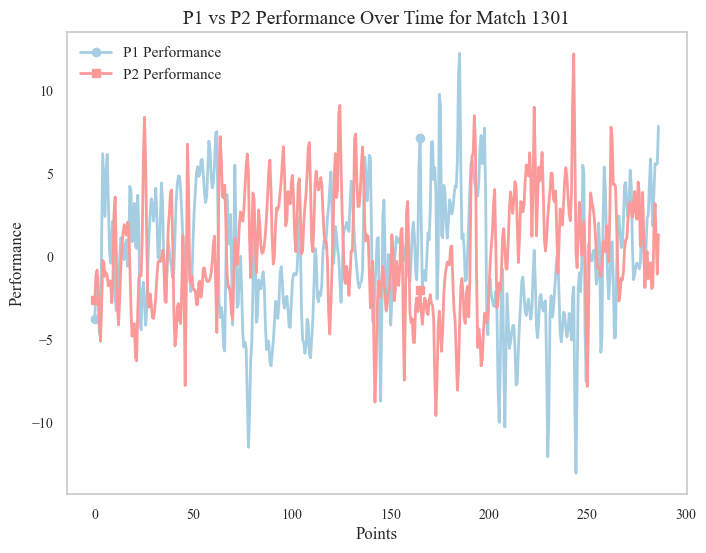

In [296]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1701]

plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(8, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1_performance']
y2_values = df_filtered['p2_performance']

# 生成更多的点，增加插值点数以提高平滑度
x_smooth = np.linspace(x_values.min(), x_values.max(), 500)

# 使用三次样条插值（更平滑）
f1 = interp1d(x_values, y1_values, kind='cubic')
f2 = interp1d(x_values, y2_values, kind='cubic')

# 设置柔和的线条颜色
line_colors = ['#a6cee3', '#fb9a99']  # 示例颜色，可以根据需要选择

# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='P1 Performance', linestyle='-', marker='o', markevery=len(x_values)+1, color=line_colors[0], linewidth=2)
plt.plot(x_smooth, f2(x_smooth), label='P2 Performance', linestyle='-', marker='s', markevery=len(x_values)+1, color=line_colors[1], linewidth=2)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1301', fontsize=14)
plt.xlabel('Points', fontsize=12)
plt.ylabel('Performance', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()

In [594]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# 假设df是具有所需列的数据框，并且只包含match_id为1301的行
df_filtered = df[df['match_id'] == 1301]

plt.style.use('seaborn-muted')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(10, 6))

# 提取相关列
x_values = df_filtered.index  # 使用序号作为x轴
y1_values = df_filtered['p1_performance']
y2_values = df_filtered['p2_performance']

# 生成更多的点
x_smooth = np.linspace(x_values.min(), x_values.max(), 300)

# 使用线性插值
f1 = interp1d(x_values, y1_values, kind='linear')
f2 = interp1d(x_values, y2_values, kind='linear')

# 绘制平滑曲线
plt.plot(x_smooth, f1(x_smooth), label='P1 Performance', linestyle='-', marker='o', markevery=len(x_values)+1)
plt.plot(x_smooth, f2(x_smooth), label='P2 Performance', linestyle='-', marker='s', markevery=len(x_values)+1)

# 设置图例、标题和轴标签
plt.legend()
plt.title('P1 vs P2 Performance Over Time for Match 1301', fontsize=20)
plt.xlabel('Points', fontsize=18)
plt.ylabel('Performance', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# 移除网格线
plt.grid(False)

# 显示图形
plt.show()


KeyError: 'p1_performance'

<Figure size 1000x600 with 0 Axes>

In [298]:
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_fault,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,0,-1,0,6.000,7.840,6.000,7.840,2,0
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,0,11.253,14.934,5.253,7.094,1,0
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,0,-1,0,25.053,34.742,13.800,19.808,2,0
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,0,76.161,110.373,51.108,75.631,1,0
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,0,76.810,111.186,0.649,0.813,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,0,6313.082,5894.973,38.620,50.971,1,0
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,0,6330.615,5922.739,17.533,27.766,1,0
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,0,6341.497,5941.067,10.882,18.328,2,0
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,0,6349.390,5951.604,7.893,10.537,1,0


In [300]:
# 假设你的DataFrame已经加载，并且名为df
data['victor_value'] = data['point_victor'] + 3 * data['game_victor']

In [301]:
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,victor_value
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,-1,0,6.000,7.840,6.000,7.840,2,0,2
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,11.253,14.934,5.253,7.094,1,0,1
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,-1,0,25.053,34.742,13.800,19.808,2,0,2
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,76.161,110.373,51.108,75.631,1,0,1
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,76.810,111.186,0.649,0.813,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,6313.082,5894.973,38.620,50.971,1,0,1
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,6330.615,5922.739,17.533,27.766,1,0,1
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,6341.497,5941.067,10.882,18.328,2,0,2
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,6349.390,5951.604,7.893,10.537,1,0,1


In [228]:
# 加载数据
import pandas as pd

file_path = 'Wimbledon_featured_matches.csv'  # 请根据实际情况调整文件路径
data = pd.read_csv(file_path)

# 分组数据以找到每个游戏的开始和结束
grouped = data.groupby(['match_id', 'set_no', 'game_no'])

# 初始化计数器
first_server_game_wins = 0
total_games = 0

for name, group in grouped:
    # 每个游戏的第一条记录
    first_point = group.iloc[0]
    # 每个游戏的最后一条记录
    last_point = group.iloc[-1]
    
    # 确定发球方
    server = first_point['server']
    # 确定获胜方
    game_victor = last_point['game_victor']
    
    # 计算先发球者获胜的游戏数
    if server == game_victor:
        first_server_game_wins += 1
    total_games += 1

# 计算先发球者获胜的比例
first_server_game_win_ratio = first_server_game_wins / total_games

print(f"Total games: {total_games}")
print(f"First server game wins: {first_server_game_wins}")
print(f"First server game win ratio: {first_server_game_win_ratio:.4f}")


Total games: 1188
First server game wins: 980
First server game win ratio: 0.8249


In [146]:
#这一部分未引入先发球优势
import pandas as pd


file_path = 'Wimbledon_featured_matches.csv'

# 加载数据
data = pd.read_csv(file_path)

# 确保数据按照比赛和时间顺序排序
data.sort_values(by=['match_id', 'set_no', 'game_no', 'point_no'], inplace=True)

# 初始化状态转移计数字典
transition_counts = {}

# 遍历数据集，记录状态转移
for i in range(1, len(data)):
    prev_row = data.iloc[i-1]
    current_row = data.iloc[i]
    
    # 获取前一个点和当前点的盘数胜利情况
    prev_state = (prev_row['p1_sets'], prev_row['p2_sets'])
    current_state = (current_row['p1_sets'], current_row['p2_sets'])
    
    # 如果盘数胜利情况发生了变化，则记录状态转移
    # 确保不超过3盘胜利的状态，即比赛结束
    # all可以查看可迭代对象中的所有元素是否都为true
    if prev_state != current_state and all(x < 3 for x in prev_state):
        if prev_state not in transition_counts:
            transition_counts[prev_state] = {}
        if current_state not in transition_counts[prev_state]:
            transition_counts[prev_state][current_state] = 0
        transition_counts[prev_state][current_state] += 1

# 计算转移概率
transition_probabilities = {}
for start_state, transitions in transition_counts.items():
    total_transitions = sum(transitions.values())
    transition_probabilities[start_state] = {end_state: count / total_transitions for end_state, count in transitions.items()}

# 输出转移概率矩阵
for start_state, transitions in transition_probabilities.items():
    print(f"From {start_state}:")
    for end_state, probability in transitions.items():
        print(f"  To {end_state}: {probability:.4f}")

From (0, 0):
  To (1, 0): 0.4839
  To (0, 1): 0.5161
From (1, 0):
  To (1, 1): 0.4667
  To (2, 0): 0.4667
  To (0, 0): 0.0667
From (1, 1):
  To (2, 1): 0.7333
  To (1, 2): 0.2667
From (2, 1):
  To (0, 0): 0.6154
  To (2, 2): 0.3846
From (0, 1):
  To (0, 2): 0.5000
  To (1, 1): 0.5000
From (0, 2):
  To (0, 0): 0.8750
  To (1, 2): 0.1250
From (2, 2):
  To (0, 0): 1.0000
From (2, 0):
  To (2, 1): 0.2857
  To (0, 0): 0.7143
From (1, 2):
  To (0, 0): 0.6000
  To (2, 2): 0.4000


In [257]:
import pandas as pd

# 假设的先发球者获胜比例
server_win_ratio = 0.8409

# 加载数据
data = pd.read_csv('Wimbledon_featured_matches.csv')

# 确保数据按照比赛和时间顺序排序
data.sort_values(by=['match_id', 'set_no', 'game_no', 'point_no'], inplace=True)

# 初始化状态转移计数字典
transition_counts = {}

# 遍历数据集，记录状态转移
for i in range(1, len(data)):
    prev_row = data.iloc[i-1]
    current_row = data.iloc[i]
    
    # 获取前一个点和当前点的盘数胜利情况
    prev_state = (prev_row['p1_sets'], prev_row['p2_sets'])
    current_state = (current_row['p1_sets'], current_row['p2_sets'])
    
    # 如果盘数胜利情况发生了变化，则记录状态转移
    if prev_state != current_state and all(x < 3 for x in prev_state):
        if prev_state not in transition_counts:
            transition_counts[prev_state] = {}
        if current_state not in transition_counts[prev_state]:
            transition_counts[prev_state][current_state] = 0
        transition_counts[prev_state][current_state] += 1

# 调整转移概率计算，考虑先发球者获胜的比例
transition_probabilities = {}
for start_state, transitions in transition_counts.items():
    total_transitions = sum(transitions.values())
    adjusted_probabilities = {}
    for end_state, count in transitions.items():
        # 调整转移概率
        if start_state[0] < end_state[0]:  # 玩家1赢得新的盘
            adjusted_probabilities[end_state] = server_win_ratio * (count / total_transitions)
        elif start_state[1] < end_state[1]:  # 玩家2赢得新的盘
            adjusted_probabilities[end_state] = (1 - server_win_ratio) * (count / total_transitions)
        else:  # 盘数没有变化，保持原始计算方法
            adjusted_probabilities[end_state] = count / total_transitions
    transition_probabilities[start_state] = adjusted_probabilities

# 输出调整后的转移概率矩阵
for start_state, transitions in transition_probabilities.items():
    print(f"From {start_state}:")
    for end_state, probability in transitions.items():
        print(f"  To {end_state}: {probability:.4f}")


From (0, 0):
  To (1, 0): 0.4069
  To (0, 1): 0.0821
From (1, 0):
  To (1, 1): 0.0742
  To (2, 0): 0.3924
  To (0, 0): 0.0667
From (1, 1):
  To (2, 1): 0.6167
  To (1, 2): 0.0424
From (2, 1):
  To (0, 0): 0.6154
  To (2, 2): 0.0612
From (0, 1):
  To (0, 2): 0.0796
  To (1, 1): 0.4204
From (0, 2):
  To (0, 0): 0.8750
  To (1, 2): 0.1051
From (2, 2):
  To (0, 0): 1.0000
From (2, 0):
  To (2, 1): 0.0455
  To (0, 0): 0.7143
From (1, 2):
  To (0, 0): 0.6000
  To (2, 2): 0.3364


In [344]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 假设您有一个名为data的DataFrame，且其中包含需要标准化的列
# data = pd.read_csv('your_data.csv')  # 如果数据来自CSV文件，加载数据
# 或者已经通过某种方式创建了这个DataFrame
data = pd.read_csv('data.csv')
# 被标准化的列
columns_to_scale = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games',
                        'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score',"P1server","P2server",
                        'p1_ace','p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err',
                        'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']

# 初始化StandardScaler
scaler = StandardScaler()

# 对指定列进行标准化，并将结果存储在新的DataFrame df中
df = data.copy()
df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
# 计算p1_performance
# 计算p1_performance
df['p1_performance'] = (df['p1_games'] + df['p1-2_games'] + df['p1_score'] + df['p1-2_score'] +
                          df['P1server'] + df['p1_ace'] +
                          df['p1_fault'] + df['p1_err'] + df['p1_distance_sum'] + df['p1_distance'])

# 计算p2_performance
df['p2_performance'] = (df['p2_games'] + df['p2-1_games'] + df['p2_score'] + df['p2-1_score'] +
                        df['P2server'] +df['p2_ace'] +
                          df['p2_fault'] + df['p2_err'] + df['p2_distance_sum'] + df['p2_distance'])


# 验证结果，打印出data的头部来检查新列是否添加成功
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_performance,p2_performance
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-3.774894,-2.617886
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-1.543219,-0.805697
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-3.450779,-2.602830
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,-4.064123,-4.990824
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,6.140761,-0.288805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,-0.391107,-2.399134
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,2.945754,-1.529322
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,5.203369,-1.681694
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,4.573696,0.653579


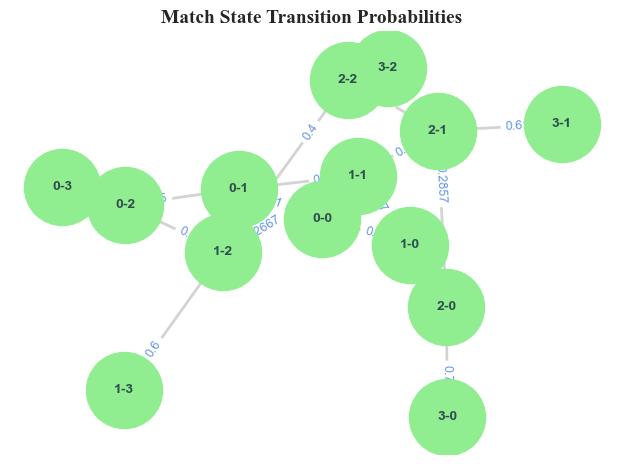

In [238]:
import networkx as nx
import matplotlib.pyplot as plt

# 设置淡雅的作图风格，并指定字体
plt.style.use('seaborn-whitegrid')  # 使用更为清晰且淡雅的网格风格
plt.rcParams['font.family'] = 'Times New Roman'  # 设置字体为 Times New Roman
plt.rcParams['font.size'] = 12  # 细化字体大小

# 生成图形
G = nx.DiGraph()

# 定义转移概率
transition_probabilities = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.5333},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(2, 2): 0.3846, (3, 1): 0.6154},
    (0, 1): {(0, 2): 0.5, (1, 1): 0.5},
    (0, 2): {(1, 2): 0.125, (0, 3): 0.875},
    (2, 2): {(3, 2): 1.0},
    (2, 0): {(2, 1): 0.2857, (3, 0): 0.7143},
    (1, 2): {(2, 2): 0.4, (1, 3): 0.6}
}

# 添加节点和边
for start_state, transitions in transition_probabilities.items():
    for end_state, probability in transitions.items():
        start_state_str = f"{start_state[0]}-{start_state[1]}"
        end_state_str = f"{end_state[0]}-{end_state[1]}"
        G.add_edge(start_state_str, end_state_str, weight=round(probability, 4))

# 网络布局
pos = nx.spring_layout(G, seed=17)

# 节点样式（采用淡绿色）
node_colors = 'lightgreen'
node_sizes = 3000
node_shapes = 'o'

# 边样式（采用浅灰色）
edge_colors = 'lightgrey'
edge_widths = 2
edge_styles = 'solid'

# 字体样式
font_size = 10
font_color = 'darkslategray'
font_weight = 'bold'

# 绘制图形
nx.draw_networkx_nodes(G, pos=pos, node_color=node_colors, node_size=node_sizes, node_shape=node_shapes)
nx.draw_networkx_edges(G, pos=pos, width=edge_widths, style=edge_styles, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos=pos, font_size=font_size, font_color=font_color, font_weight=font_weight)

# 绘制边上的标签，使用淡雅的蓝色
edge_labels = nx.get_edge_attributes(G, 'weight')
edge_label_font_color = 'cornflowerblue'
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, label_pos=0.3, font_size=9, font_color=edge_label_font_color)

# 图标标题和布局设置
plt.title('Match State Transition Probabilities', size=14, fontweight='bold', fontname='Times New Roman')
plt.axis('off')
plt.tight_layout()

# 显示图形
plt.show()

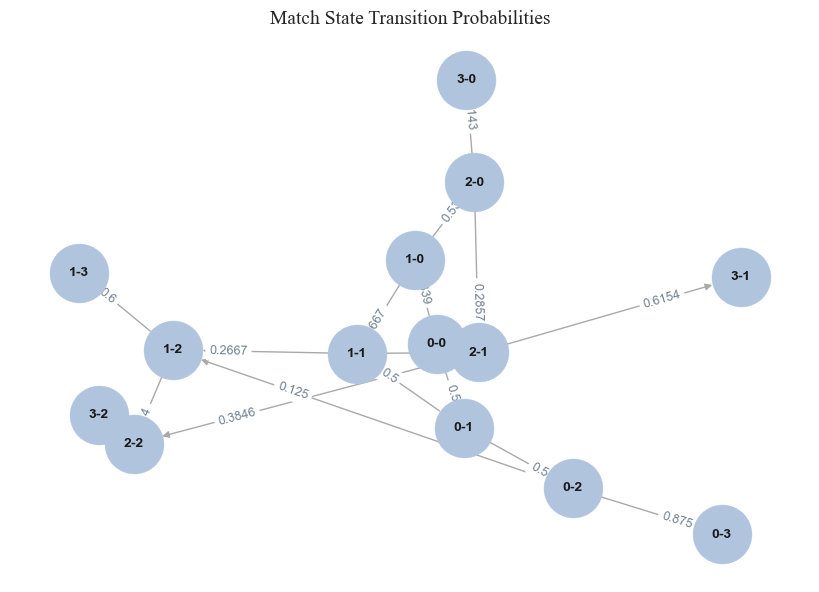

In [440]:
import networkx as nx
import matplotlib.pyplot as plt

# 设置淡雅的作图风格，并指定字体
plt.style.use('seaborn-whitegrid')  # 使用更为清晰且淡雅的网格风格
plt.rcParams['font.family'] = 'Times New Roman'  # 设置字体为 Times New Roman
plt.rcParams['font.size'] = 12  # 细化字体大小


# 创建一个有向图
G = nx.DiGraph()
# 定义转移概率
transition_probabilities = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.5333},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(2, 2): 0.3846, (3, 1): 0.6154},
    (0, 1): {(0, 2): 0.5, (1, 1): 0.5},
    (0, 2): {(1, 2): 0.125, (0, 3): 0.875},
    (2, 2): {(3, 2): 1.0},
    (2, 0): {(2, 1): 0.2857, (3, 0): 0.7143},
    (1, 2): {(2, 2): 0.4, (1, 3): 0.6}
}
# 添加节点和边
for start_state, transitions in transition_probabilities.items():
    for end_state, probability in transitions.items():
        start_state_str = f"{start_state[0]}-{start_state[1]}"
        end_state_str = f"{end_state[0]}-{end_state[1]}"
        G.add_edge(start_state_str, end_state_str, weight=probability)

# 设置节点位置
pos = nx.spring_layout(G, seed=42)

# 定义节点和边的颜色、大小等样式
node_color = 'lightsteelblue'
edge_color = 'darkgrey'
node_size = 1800
font_weight = 'bold'

# 绘制网络图
nx.draw(G, pos, with_labels=True, node_color=node_color, edge_color=edge_color, node_size=node_size, font_size=10, font_weight=font_weight)

# 添加边标签
edge_labels = nx.get_edge_attributes(G, 'weight')
edge_label_font_color = 'slategray'
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, label_pos=0.3, font_size=9, font_color=edge_label_font_color)

# 图形标题及坐标轴设置
plt.title('Match State Transition Probabilities', fontsize=14)
plt.axis('off')

# 显示图形
plt.show()

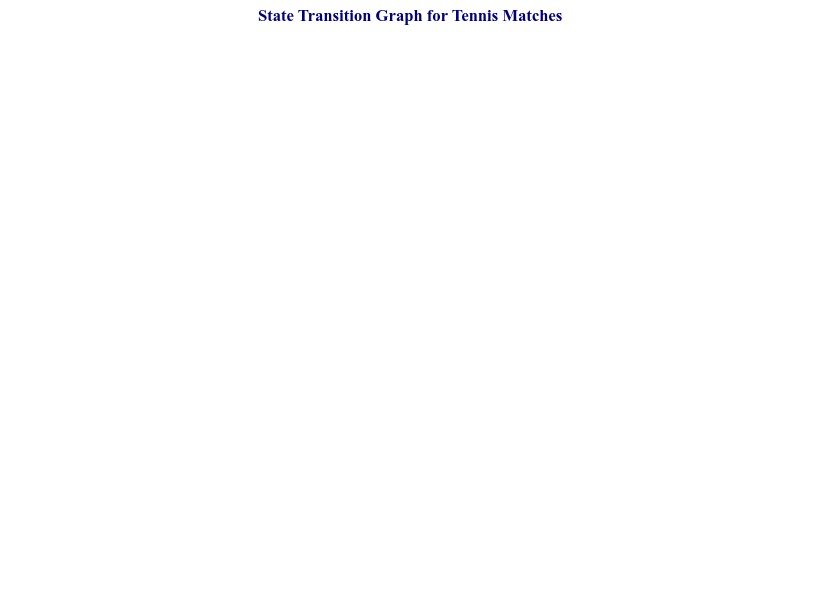

In [441]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import colors

# 自定义颜色
node_color = '#ADD8E6'  # 浅蓝色
edge_color = '#6495ED'  # 深蓝色
font_color = 'navy'     # 深蓝

# 创建并配置图形
G = nx.DiGraph()
# 添加边和转移概率
transitions = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.4667, (0, 0): 0.0667},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(0, 0): 0.6154, (2, 2): 0.3846},
    (0, 1): {(0, 2): 0.5000, (1, 1): 0.5000},
    (0, 2): {(0, 0): 0.8750, (1, 2): 0.1250},
    (2, 2): {(0, 0): 1.0000},
    (2, 0): {(2, 1): 0.2857, (0, 0): 0.7143},
    (1, 2): {(0, 0): 0.6000, (2, 2): 0.4000}
}

# 设置布局并进行微调
pos = nx.spring_layout(G, k=0.6, scale=2)  # 调整节点间距和平移缩放比例

# 美化节点和边
nx.draw(G, pos, with_labels=True,
        node_size=2000, node_color=node_color, font_color=font_color,
        font_size=12, font_weight='bold', edgecolors='k', linewidths=1.5,
        edge_color=edge_color, alpha=0.8)  # 边缘颜色、透明度及线宽

# 绘制边标签
nx.draw_networkx_edge_labels(G, pos, edge_labels=nx.get_edge_attributes(G, 'weight'),
                             font_color=font_color, font_size=10)

plt.title('State Transition Graph for Tennis Matches', fontweight='bold', color=font_color)
plt.axis('off')
plt.box(False)  # 移除绘图区域外框
plt.show()

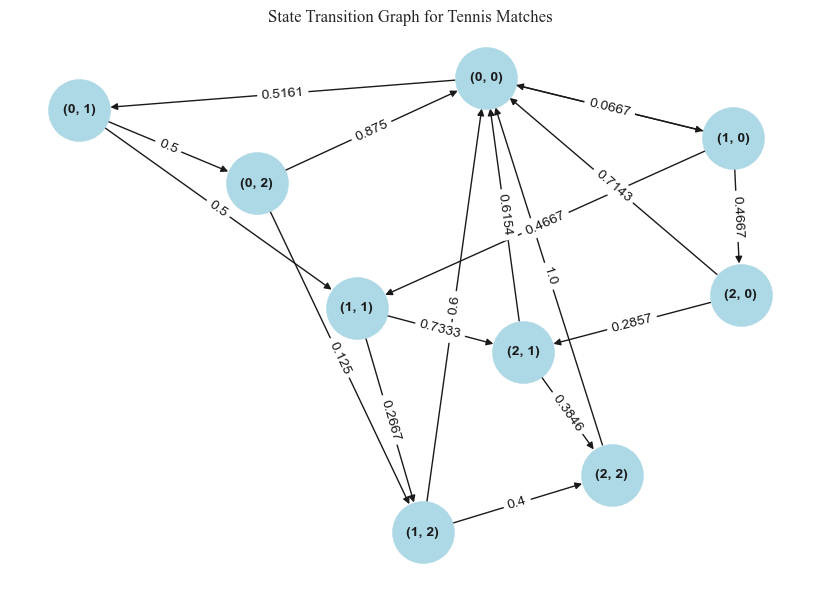

In [444]:
import networkx as nx
import matplotlib.pyplot as plt

# 创建有向图
G = nx.DiGraph()

# 添加边和转移概率
transitions = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.4667, (0, 0): 0.0667},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(0, 0): 0.6154, (2, 2): 0.3846},
    (0, 1): {(0, 2): 0.5000, (1, 1): 0.5000},
    (0, 2): {(0, 0): 0.8750, (1, 2): 0.1250},
    (2, 2): {(0, 0): 1.0000},
    (2, 0): {(2, 1): 0.2857, (0, 0): 0.7143},
    (1, 2): {(0, 0): 0.6000, (2, 2): 0.4000}
}

# 添加节点和边
for start_state, end_states in transitions.items():
    for end_state, probability in end_states.items():
        G.add_edge(start_state, end_state, weight=round(probability, 4))

pos = nx.spring_layout(G)  # 设置布局
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='lightblue', font_size=10, font_weight='bold')
nx.draw_networkx_edge_labels(G, pos, edge_labels=nx.get_edge_attributes(G, 'weight'))

plt.title('State Transition Graph for Tennis Matches')
plt.axis('off')  # 关闭坐标轴
plt.show()

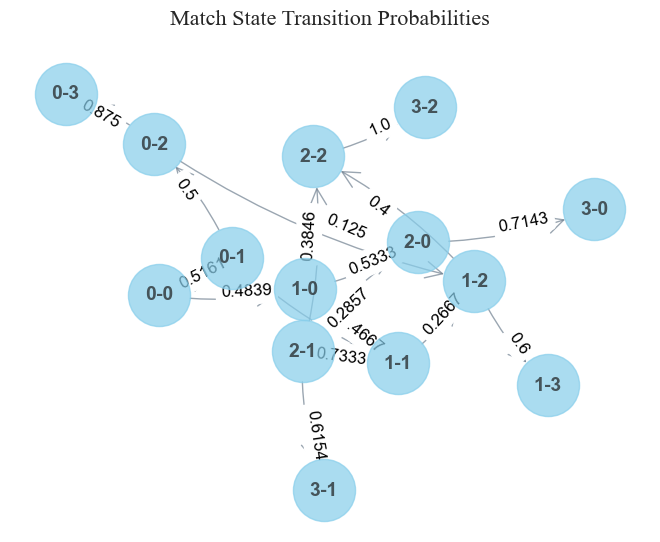

In [593]:
import networkx as nx
import matplotlib.pyplot as plt

# 设置淡雅的作图风格，并指定字体
plt.style.use('seaborn-whitegrid')  # 使用更为清晰且淡雅的网格风格
plt.rcParams['font.family'] = 'Times New Roman'  # 设置字体为 Times New Roman
plt.rcParams['font.size'] = 12  # 细化字体大小

# 创建一个有向图
G = nx.DiGraph()
transition_probabilities = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.5333},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(2, 2): 0.3846, (3, 1): 0.6154},
    (0, 1): {(0, 2): 0.5, (1, 1): 0.5},
    (0, 2): {(1, 2): 0.125, (0, 3): 0.875},
    (2, 2): {(3, 2): 1.0},
    (2, 0): {(2, 1): 0.2857, (3, 0): 0.7143},
    (1, 2): {(2, 2): 0.4, (1, 3): 0.6}
}

for start_state, transitions in transition_probabilities.items():
    for end_state, probability in transitions.items():
        start_state_str = f"{start_state[0]}-{start_state[1]}"
        end_state_str = f"{end_state[0]}-{end_state[1]}"
        G.add_edge(start_state_str, end_state_str, weight=probability)

pos = nx.spring_layout(G, k=0.5, scale=2)  # 调整布局参数以优化视觉效果

# 定义节点和边的颜色、大小等样式
node_color = 'skyblue'
edge_color = 'slategray'
edge_alpha = 0.7
node_size = 2000
font_weight = 'bold'

# 绘制网络图
nx.draw(
    G,
    pos,
    with_labels=True,
    node_color=node_color,
    edge_color=edge_color,
    alpha=edge_alpha,
    node_size=node_size,
    font_size=14,
    font_weight=font_weight,
    connectionstyle="arc3,rad=0.1",  # 弧形连接线
    arrowsize=30,
    arrowstyle='->',
)

# 添加边标签并设置样式
edge_labels = nx.get_edge_attributes(G, 'weight')
edge_label_font_color = 'black'
nx.draw_networkx_edge_labels(
    G,
    pos,
    edge_labels=edge_labels,
    label_pos=0.4,
    font_size=12,
    font_color=edge_label_font_color,
)

# 图形标题及坐标轴设置
plt.title('Match State Transition Probabilities', fontsize=16, pad=20)
plt.axis('off')

# 显示图形
plt.show()

C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\3244875810.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # 自动调整间距


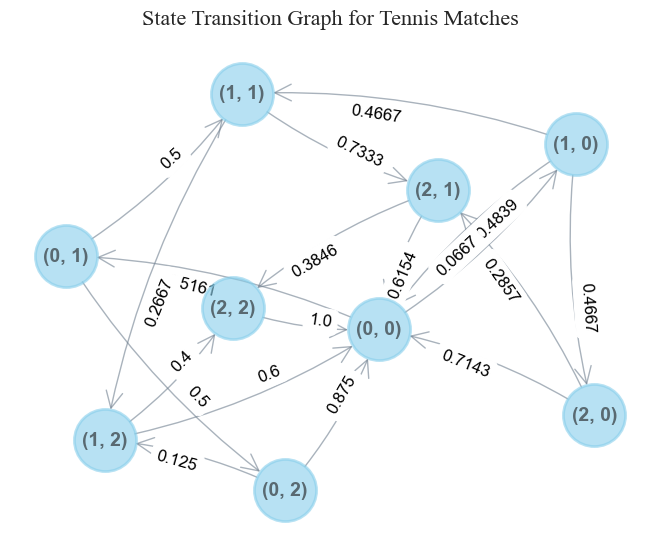

In [577]:
import networkx as nx
import matplotlib.pyplot as plt

# 创建有向图
G = nx.DiGraph()

# 添加边和转移概率
transitions = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.4667, (0, 0): 0.0667},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(0, 0): 0.6154, (2, 2): 0.3846},
    (0, 1): {(0, 2): 0.5000, (1, 1): 0.5000},
    (0, 2): {(0, 0): 0.8750, (1, 2): 0.1250},
    (2, 2): {(0, 0): 1.0000},
    (2, 0): {(2, 1): 0.2857, (0, 0): 0.7143},
    (1, 2): {(0, 0): 0.6000, (2, 2): 0.4000}
}

# 添加节点和边
for start_state, end_states in transitions.items():
    for end_state, probability in end_states.items():
        G.add_edge(start_state, end_state, weight=round(probability, 4))

# 设置自定义布局
pos = nx.spring_layout(G, k=0.5, scale=2)  # 调整k值和缩放比例以优化布局

# 美化图形设置
node_color = 'skyblue'  # 更改节点颜色
edge_color = 'slategray'  # 边的颜色
edge_alpha = 0.6  # 边的透明度
font_size = 14  # 节点标签字体大小
font_weight = 'bold'
node_shape = 'o'  # 节点形状为圆形
linewidths = 2  # 边线宽度
edge_label_color = 'black'

# 绘制节点和边
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=2000,
    node_color=node_color,
    font_size=font_size,
    font_weight=font_weight,
    node_shape=node_shape,
    linewidths=linewidths,
    edge_color=edge_color,
    edge_cmap=plt.cm.Blues_r,  # 使用色彩映射表（根据权重）
    edge_vmin=0,  # 边权重的最小值对应的颜色
    edge_vmax=1,  # 边权重的最大值对应的颜色
    connectionstyle="arc3,rad=0.1",  # 弧形连接风格
    arrowsize=30,  # 箭头大小
    arrowstyle='->',  # 箭头样式
    alpha=edge_alpha,
)

# 绘制并格式化边权重标签
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(
    G,
    pos,
    edge_labels=edge_labels,
    font_size=12,
    font_color=edge_label_color,
    label_pos=0.4,  # 标签位置相对于边中点的比例
)

plt.title('State Transition Graph for Tennis Matches', fontsize=16, pad=20)
plt.axis('off')  # 关闭坐标轴
plt.tight_layout()  # 自动调整间距
plt.show()

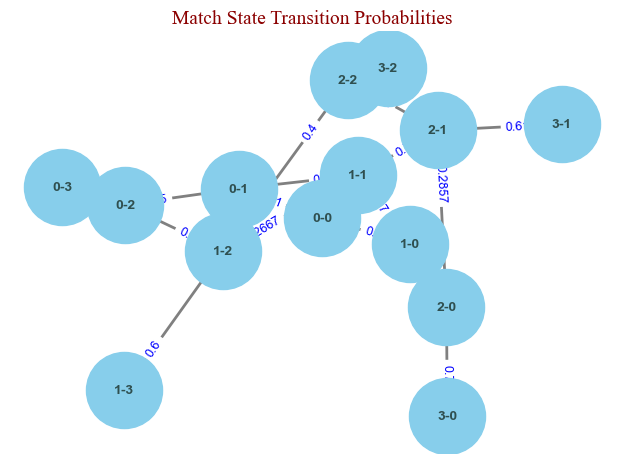

In [240]:
import networkx as nx
import matplotlib.pyplot as plt

# 设置淡雅的作图风格，并指定字体
plt.style.use('seaborn-whitegrid')  # 使用更为清晰的网格风格
plt.rcParams['font.family'] = 'Times New Roman'  # 设置字体为 Times New Roman
plt.rcParams['font.size'] = 12  # 细化字体大小

# 生成图形
G = nx.DiGraph()

# 定义转移概率
transition_probabilities = {
    (0, 0): {(1, 0): 0.4839, (0, 1): 0.5161},
    (1, 0): {(1, 1): 0.4667, (2, 0): 0.5333},
    (1, 1): {(2, 1): 0.7333, (1, 2): 0.2667},
    (2, 1): {(2, 2): 0.3846, (3, 1): 0.6154},
    (0, 1): {(0, 2): 0.5, (1, 1): 0.5},
    (0, 2): {(1, 2): 0.125, (0, 3): 0.875},
    (2, 2): {(3, 2): 1.0},
    (2, 0): {(2, 1): 0.2857, (3, 0): 0.7143},
    (1, 2): {(2, 2): 0.4, (1, 3): 0.6}
}

# 添加节点和边
for start_state, transitions in transition_probabilities.items():
    for end_state, probability in transitions.items():
        start_state_str = f"{start_state[0]}-{start_state[1]}"
        end_state_str = f"{end_state[0]}-{end_state[1]}"
        G.add_edge(start_state_str, end_state_str, weight=round(probability, 4))

# 网络布局
pos = nx.spring_layout(G, seed=17)

# 节点样式
node_colors = 'skyblue'
node_sizes = 3000
node_shapes = 'o'

# 边样式
edge_colors = 'grey'
edge_widths = 2
edge_styles = 'solid'

# 字体样式
font_size = 10
font_color = 'darkslategray'
font_weight = 'bold'

# 绘制图形
nx.draw_networkx_nodes(G, pos=pos, node_color=node_colors, node_size=node_sizes, node_shape=node_shapes)
nx.draw_networkx_edges(G, pos=pos, width=edge_widths, style=edge_styles, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos=pos, font_size=font_size, font_color=font_color, font_weight=font_weight)

# 绘制边上的标签
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, label_pos=0.3, font_size=9, font_color='blue')

# 图标标题和布局设置
plt.title('Match State Transition Probabilities', size=14, color='darkred')
plt.axis('off')
plt.tight_layout()

# 显示图形
plt.show()

In [241]:
import pandas as pd
import numpy as np

# 加载数据
file_path = 'Wimbledon_featured_matches.csv'  
data = pd.read_csv(file_path)

# 确保数据按比赛ID和点数顺序排序
data.sort_values(by=['match_id', 'point_no'], inplace=True)

# 定义状态：球员A连续获胜的点数
# 注意：这里简化为只考虑两种状态，连胜和非连胜（即对手得分），实际应用中可以根据需要定义更多状态
states = ['Win', 'Lose']

# 初始化状态转移计数矩阵
transition_counts = {state: {next_state: 0 for next_state in states} for state in states}

# 遍历数据集，计算状态转移
prev_winner = None
for index, row in data.iterrows():
    winner = 'Win' if row['point_victor'] == 1 else 'Lose'  # 假设1代表球员A
    if prev_winner is not None:
        transition_counts[prev_winner][winner] += 1
    prev_winner = winner

# 计算转移概率
transition_probabilities = {}
for state, transitions in transition_counts.items():
    total = sum(transitions.values())
    transition_probabilities[state] = {next_state: count / total for next_state, count in transitions.items()}

# 输出转移概率
print("Transition Probabilities:")
for state, probabilities in transition_probabilities.items():
    print(f"From {state}:")
    for next_state, prob in probabilities.items():
        print(f"  To {next_state}: {prob:.4f}")

# 分析转移概率是否显示出比赛中的随机性或动量效应


Transition Probabilities:
From Win:
  To Win: 0.5437
  To Lose: 0.4563
From Lose:
  To Win: 0.4777
  To Lose: 0.5223


In [242]:
import pandas as pd
from collections import defaultdict

# 加载数据
data_path = 'Wimbledon_featured_matches.csv'
data = pd.read_csv(data_path)

# 确保数据按照比赛和时间顺序排序
data.sort_values(by=['match_id', 'set_no', 'game_no', 'point_no'], inplace=True)

# 获取所有球员的列表
players = pd.concat([data['player1'], data['player2']]).unique()

# 初始化状态转移计数字典
player_transitions = defaultdict(lambda: defaultdict(lambda: defaultdict(int)))

# 对每位球员进行分析
for player_name in players:
    # 筛选出该球员参与的比赛数据
    player_matches = data[(data['player1'] == player_name) | (data['player2'] == player_name)]
    
    for i in range(1, len(player_matches)):
        prev_row = player_matches.iloc[i-1]
        current_row = player_matches.iloc[i]
        
        # 构建状态，这里简化为盘数胜利情况
        prev_state = (prev_row['p1_sets'], prev_row['p2_sets'])
        current_state = (current_row['p1_sets'], current_row['p2_sets'])
        
        # 如果状态发生变化，则记录该转移
        if prev_state != current_state:
            player_transitions[player_name][prev_state][current_state] += 1

# 计算每位球员的转移概率
player_probabilities = {}
for player, transitions in player_transitions.items():
    player_probabilities[player] = {}
    for start_state, end_states in transitions.items():
        total_transitions = sum(end_states.values())
        player_probabilities[player][start_state] = {end_state: count / total_transitions for end_state, count in end_states.items()}

# 由于输出可能很长，这里仅示例输出一个球员的转移概率
example_player = list(players)[4]  # 选取列表中的第一个球员作为示例
print(f"Transition probabilities for {example_player}:")
for start_state, transitions in player_probabilities[example_player].items():
    print(f"From {start_state}:")
    for end_state, probability in transitions.items():
        print(f"  To {end_state}: {probability:.4f}")



Transition probabilities for Daniil Medvedev:
From (0, 0):
  To (0, 1): 0.2500
  To (1, 0): 0.7500
From (0, 1):
  To (1, 1): 1.0000
From (1, 1):
  To (2, 1): 0.5000
  To (1, 2): 0.5000
From (2, 1):
  To (0, 0): 1.0000
From (1, 0):
  To (0, 0): 0.3333
  To (1, 1): 0.3333
  To (2, 0): 0.3333
From (1, 2):
  To (2, 2): 1.0000
From (2, 2):
  To (0, 0): 1.0000


In [243]:
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_performance,p2_performance
0,1301,0.0,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-3.774894,-2.617886
1,1301,2280.0,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-1.543219,-0.805697
2,1301,6060.0,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-3.450779,-2.602830
3,1301,7860.0,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,-4.064123,-4.990824
4,1301,13260.0,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,6.140761,-0.288805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,2637480.0,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,-0.391107,-2.399134
6936,1701,2642580.0,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,2.945754,-1.529322
6937,1701,2647200.0,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,5.203369,-1.681694
6938,1701,2649120.0,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,4.573696,0.653579


In [303]:
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,victor_value
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,-1,0,6.000,7.840,6.000,7.840,2,0,2
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,11.253,14.934,5.253,7.094,1,0,1
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,-1,0,25.053,34.742,13.800,19.808,2,0,2
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,76.161,110.373,51.108,75.631,1,0,1
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,76.810,111.186,0.649,0.813,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,6313.082,5894.973,38.620,50.971,1,0,1
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,6330.615,5922.739,17.533,27.766,1,0,1
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,6341.497,5941.067,10.882,18.328,2,0,2
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,6349.390,5951.604,7.893,10.537,1,0,1


In [308]:

data.to_csv('data2.csv', index=False)
data = pd.read_csv('data2.csv')
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,victor_value
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,-1,0,6.000,7.840,6.000,7.840,2,0,2
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,11.253,14.934,5.253,7.094,1,0,1
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,-1,0,25.053,34.742,13.800,19.808,2,0,2
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,76.161,110.373,51.108,75.631,1,0,1
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,76.810,111.186,0.649,0.813,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,6313.082,5894.973,38.620,50.971,1,0,1
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,6330.615,5922.739,17.533,27.766,1,0,1
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,6341.497,5941.067,10.882,18.328,2,0,2
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,6349.390,5951.604,7.893,10.537,1,0,1


In [310]:
from scipy.stats import kstest

# 假设df是包含所需列的数据框p1_ace   p2_ace    p1_fault    p1_score
columns_to_test = ['P1server', 'p1-2_score', 'p1-2_games', 'p1_ace', 'p2_ace','p1_score', 'p2_score',  'p1_score','point_victor', 'game_victor']

for column in columns_to_test:
    # 提取列数据
    data = df[column]

    # 执行 Kolmogorov-Smirnov (KS) 检验
    _, p_value = kstest(data, 'norm')

    # 打印检验结果
    print(f"Kolmogorov-Smirnov Test for {column}:")
    print(f"P-value: {p_value:.4f}")

    # 根据 p-value 判断是否拒绝原假设（显著性水平设为 0.05）
    if p_value < 0.05:
        print("Reject the null hypothesis (not normally distributed)\n")
    else:
        print("Fail to reject the null hypothesis (normally distributed)\n")


Kolmogorov-Smirnov Test for P1server:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p1-2_score:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p1-2_games:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p1_ace:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p2_ace:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p1_score:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p2_score:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for p1_score:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smirnov Test for point_victor:
P-value: 0.0000
Reject the null hypothesis (not normally distributed)

Kolmogorov-Smir

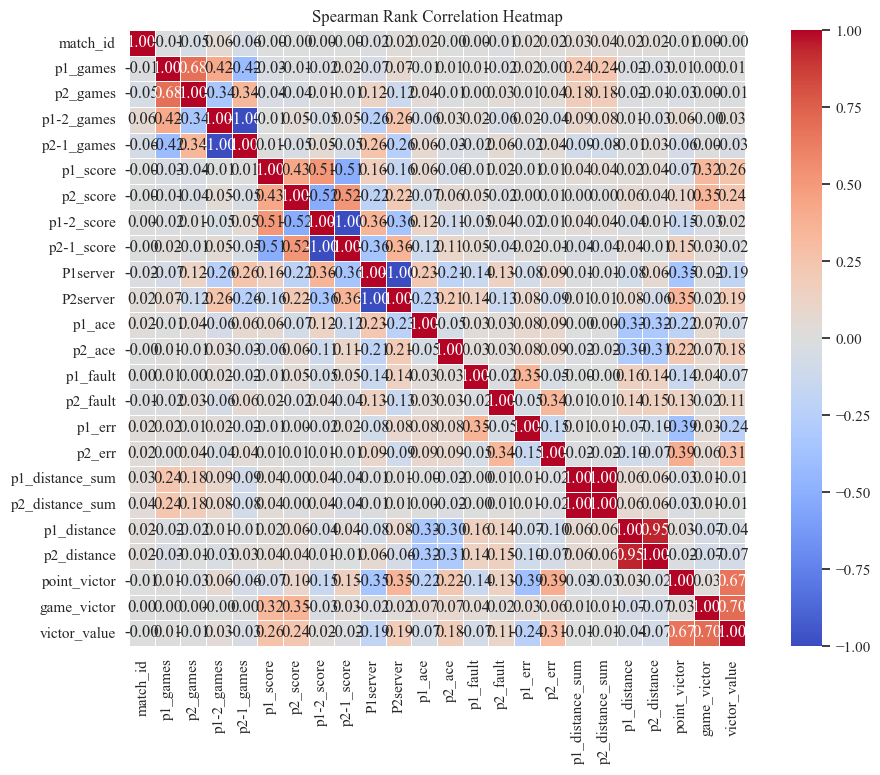

In [302]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 假设你已经有了一个名为df的数据框
# df = pd.read_csv('your_dataset.csv')

# 计算Spearman相关系数矩阵
correlation_matrix = data.corr(method='spearman')

# 创建一个热力图
plt.figure(figsize=(12, 8))  # 可以调整大小以适应你的数据规模
sns.heatmap(correlation_matrix, 
            annot=True,        # 显示数字
            cmap='coolwarm',   # 使用颜色地图（也可以选择其他颜色方案）
            vmin=-1, vmax=1,   # 设置颜色范围
            linewidths=.5,     # 网格线宽度
            fmt=".2f",         # 数字格式化
            center=0,          # 颜色中心点
            square=True)       # 矩阵为正方形

plt.title('Spearman Rank Correlation Heatmap')
plt.show()

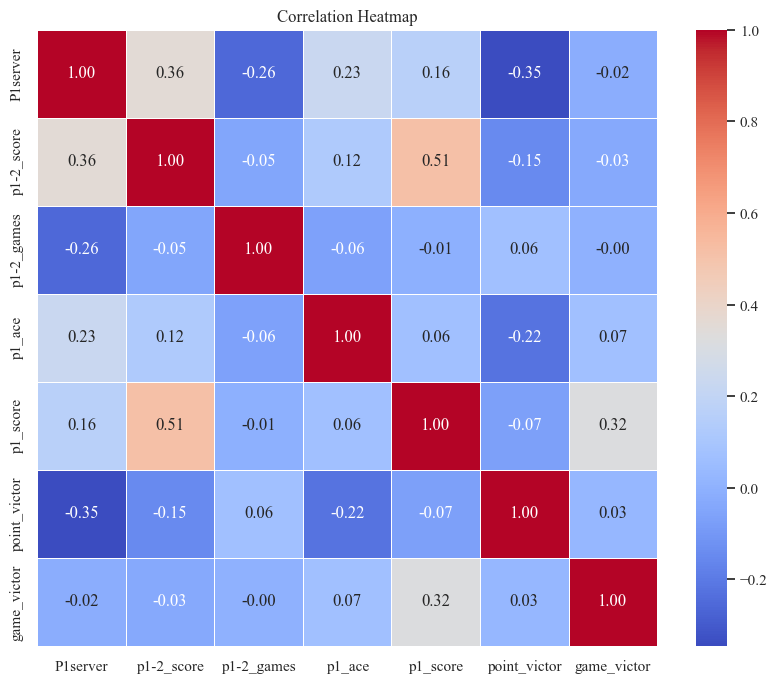

In [312]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设df是你的数据框
# 提取相关列
columns_of_interest =  ['P1server', 'p1-2_score', 'p1-2_games', 'p1_ace','p1_score','point_victor', 'game_victor']

df_subset = df[columns_of_interest]

# 计算相关性矩阵
correlation_matrix = df_subset.corr(method='spearman')

# 绘制热力图
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [314]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

# 读取数据
data = pd.read_csv('data2.csv')



# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 'p2_distance_sum', 
            'p1_distance', 'p2_distance', 'game_victor', 'victor_value']

X = data[features]  # 特征
y = data['point_victor']  # 目标变量

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 初始化BP神经网络分类器
clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# 训练模型
clf.fit(X_train, y_train)

# 获取特征重要性
feature_importances = clf.coefs_[0]  # 取第一个隐藏层的权重

# 打印每个特征的重要性
feature_names = X.columns
importances = pd.Series(feature_importances.sum(axis=1), index=feature_names).sort_values(ascending=False)

print("Feature Importances:\n")
print(importances)

# 预测测试集
y_pred = clf.predict(X_test)

# 计算并打印精度
print("Accuracy on test set: ", accuracy_score(y_test, y_pred))


Feature Importances:

p1_ace             3.811112
p2_score           2.217707
victor_value       2.063146
p1_err             1.780813
p2-1_score         1.732923
p1_distance        1.707019
p1_distance_sum    1.633282
p1_score           1.606762
game_victor        1.563058
p1-2_games         1.454290
p1_games           0.941274
p2_fault           0.674129
p2_ace             0.355335
p2_games          -0.500947
P2server          -0.640952
p2_distance       -0.808530
p2_distance_sum   -1.082411
p1_fault          -1.183821
P1server          -1.368342
p2-1_games        -2.071581
p1-2_score        -2.400559
p2_err            -3.973756
dtype: float64
Accuracy on test set:  0.9142651296829971


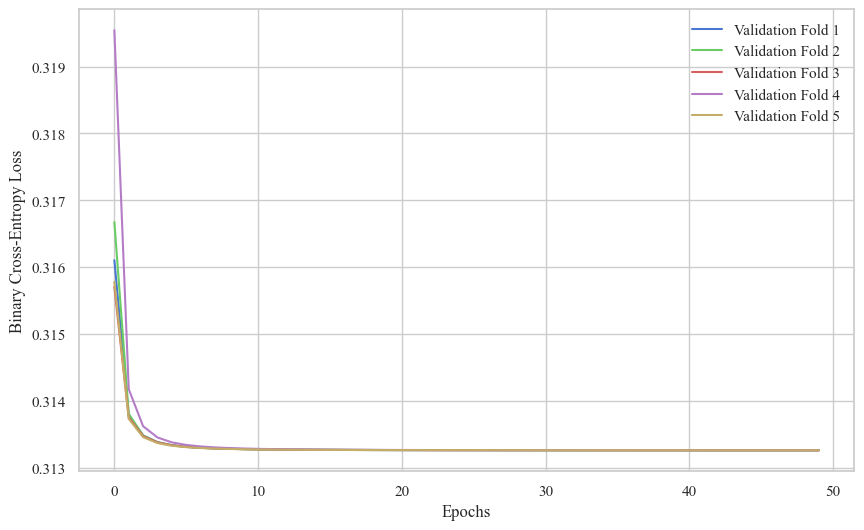

NameError: name 'get_accuracy' is not defined

In [323]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

# 加载数据
data = pd.read_csv('data2.csv')

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score', 
            'P1server', 'P2server', 'p1_ace', 'p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 
            'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']
target = 'point_victor'

X = data[features]
y = (data[target] > 0).astype(np.float32)  # 假设point_victor为0或1，将其转换为0.0和1.0

# 数据预处理（例如归一化）
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = torch.tensor(X_scaled, dtype=torch.float32)
y = torch.tensor(y.values, dtype=torch.float32)

# K折交叉验证
kf = KFold(n_splits=5, shuffle=True, random_state=42)
histories = []
models = []
for fold, (train_idx, val_idx) in enumerate(kf.split(X_scaled)):
    X_train, y_train = X_scaled[train_idx], y[train_idx]
    X_val, y_val = X_scaled[val_idx], y[val_idx]

    # 创建数据加载器
    train_data = TensorDataset(X_train, y_train.unsqueeze(1))  # 将标签维度扩展到二维，使其与模型输出匹配
    val_data = TensorDataset(X_val, y_val.unsqueeze(1))
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=32, shuffle=False)

    # 初始化神经网络模型
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(len(features), 32)
            self.fc2 = nn.Linear(32, 16)
            self.fc3 = nn.Linear(16, 1)
            
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.sigmoid(self.fc3(x))
            return x

    model = Net()

    # 编译模型，定义优化器和损失函数（这里使用二元交叉熵损失）
    criterion = nn.BCEWithLogitsLoss()  # 使用BCEWithLogitsLoss可以直接输出概率值，无需sigmoid激活
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # 训练模型并记录历史训练过程
    history = {'val_loss': []}
    for epoch in range(50):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        train_loss = running_loss / len(train_loader.dataset)

        # 计算验证集上的损失
        model.eval()
        with torch.no_grad():
            val_running_loss = 0.0
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * inputs.size(0)
            val_loss = val_running_loss / len(val_loader.dataset)
        
        history['val_loss'].append(val_loss)

    histories.append(history)
    models.append(model)

# 绘制K折交叉验证的损失函数图
plt.figure(figsize=(10, 6))
for i, history in enumerate(histories):
    val_losses = history['val_loss']
    plt.plot(val_losses, label=f'Validation Fold {i+1}')
    
plt.xlabel('Epochs')
plt.ylabel('Binary Cross-Entropy Loss')
plt.legend()
plt.show()

# 统计K折交叉验证的平均准确率
accuracies = [get_accuracy(model, X_val, y_val) for model in models]
avg_accuracy = np.mean(accuracies)
print(f"Average accuracy across folds: {avg_accuracy:.3f}")

# 定义计算准确率的辅助函数
def get_accuracy(model, X, y):
    correct_pred = 0
    total_samples = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in DataLoader(TensorDataset(X, y.unsqueeze(1)), batch_size=32):
            outputs = model(inputs)
            _, predicted = torch.max(outputs, dim=1)
            correct_pred += (predicted == labels).sum().item()
            total_samples += labels.shape[0]
    return correct_pred / total_samples

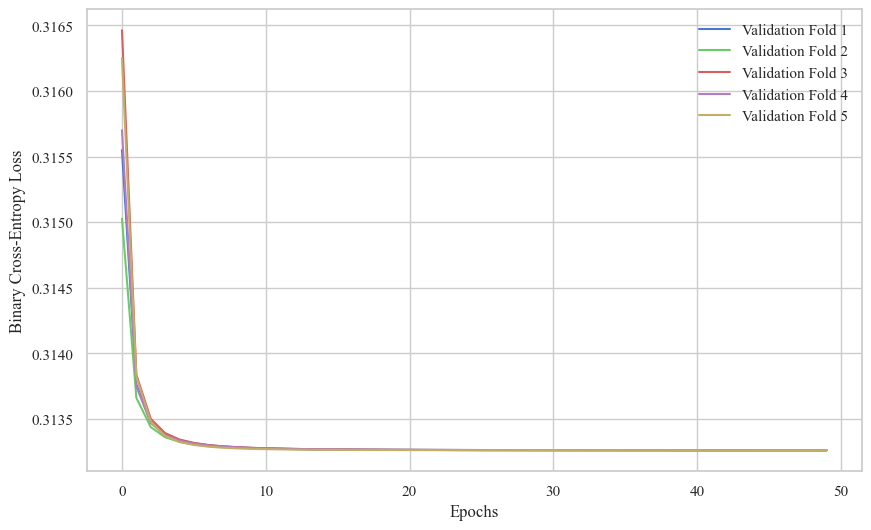

Average accuracy across folds: 1.000


In [328]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

# 加载数据
data = pd.read_csv('data2.csv')

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score', 
            'P1server', 'P2server', 'p1_ace', 'p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 
            'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']
target = 'point_victor'

X = data[features]
y = (data[target] > 0).astype(np.float32)  # 假设point_victor为0或1，将其转换为0.0和1.0

# 数据预处理（例如归一化）
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = torch.tensor(X_scaled, dtype=torch.float32)
y = torch.tensor(y.values, dtype=torch.float32)

# K折交叉验证
kf = KFold(n_splits=5, shuffle=True, random_state=42)
histories = []
models = []

# 定义计算准确率的辅助函数
def get_accuracy(model, X, y):
    correct_pred = 0
    total_samples = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in DataLoader(TensorDataset(X, y.unsqueeze(1)), batch_size=32):
            outputs = model(inputs)
            predicted = torch.round(outputs)
            correct_pred += (predicted == labels).sum().item()
            total_samples += labels.shape[0]
    return correct_pred / total_samples

for fold, (train_idx, val_idx) in enumerate(kf.split(X_scaled)):
    X_train, y_train = X_scaled[train_idx], y[train_idx]
    X_val, y_val = X_scaled[val_idx], y[val_idx]

    # 创建数据加载器
    train_data = TensorDataset(X_train, y_train.unsqueeze(1))  # 将标签维度扩展到二维，使其与模型输出匹配
    val_data = TensorDataset(X_val, y_val.unsqueeze(1))
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=32, shuffle=False)

    # 初始化神经网络模型
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(len(features), 16)
            self.fc2 = nn.Linear(16, 8)
            self.fc3 = nn.Linear(8, 1)
            
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.sigmoid(self.fc3(x))
            return x

    model = Net()

    # 编译模型，定义优化器和损失函数（这里使用二元交叉熵损失）
    criterion = nn.BCEWithLogitsLoss()  # 使用BCEWithLogitsLoss可以直接输出概率值，无需sigmoid激活
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # 训练模型并记录历史训练过程
    history = {'val_loss': []}
    for epoch in range(10):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        train_loss = running_loss / len(train_loader.dataset)

        # 计算验证集上的损失
        model.eval()
        with torch.no_grad():
            val_running_loss = 0.0
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item() * inputs.size(0)
            val_loss = val_running_loss / len(val_loader.dataset)
        
        history['val_loss'].append(val_loss)

    histories.append(history)
    models.append(model)

# 绘制K折交叉验证的损失函数图
plt.figure(figsize=(10, 6))
for i, history in enumerate(histories):
    val_losses = history['val_loss']
    plt.plot(val_losses, label=f'Validation Fold {i+1}')
    
plt.xlabel('Epochs')
plt.ylabel('Binary Cross-Entropy Loss')
plt.legend()
plt.show()

# 统计K折交叉验证的平均准确率
accuracies = [get_accuracy(model, X_val, y_val) for model in models]
avg_accuracy = np.mean(accuracies)
print(f"Average accuracy across folds: {avg_accuracy:.3f}")


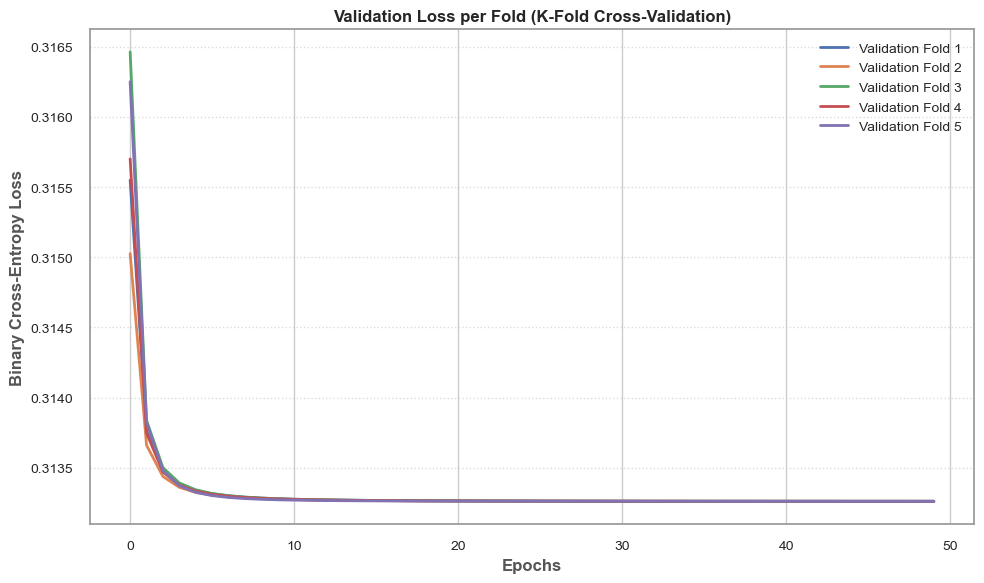

In [465]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局matplotlib样式
rcParams['font.family'] = 'Arial'  # 设置字体为Arial（可替换为其他系统支持的优雅字体）
rcParams['font.size'] = 12
rcParams['axes.labelcolor'] = '#555555'  # 设置标签颜色
rcParams['axes.edgecolor'] = '#999999'  # 设置轴边框颜色
rcParams['grid.color'] = '#CCCCCC'  # 设置网格线颜色
rcParams['figure.facecolor'] = 'white'  # 设置背景色
rcParams['lines.linewidth'] = 2.0  # 设置线条宽度
rcParams['xtick.major.pad'] = 6  # 设置x轴主刻度标签与轴的距离
rcParams['ytick.major.pad'] = 6  # 设置y轴主刻度标签与轴的距离

# ...（其余加载数据和训练模型的代码不变）

# 绘制K折交叉验证的损失函数图，并进行美化
plt.figure(figsize=(10, 6))
for i, history in enumerate(histories):
    val_losses = history['val_loss']
    plt.plot(val_losses, label=f'Validation Fold {i+1}', linewidth=2, marker='o', markersize=4, markerfacecolor='none', markevery=4)

plt.xlabel('Epochs', fontweight='bold')
plt.ylabel('Binary Cross-Entropy Loss', fontweight='bold')
plt.title('Validation Loss per Fold (K-Fold Cross-Validation)', fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle=':', alpha=0.7)  # 添加垂直方向网格线
plt.legend(frameon=False, loc='best', fontsize=10)  # 去除图例边框并优化位置
plt.tight_layout()
plt.show()

# ...（计算准确率的部分代码不变）

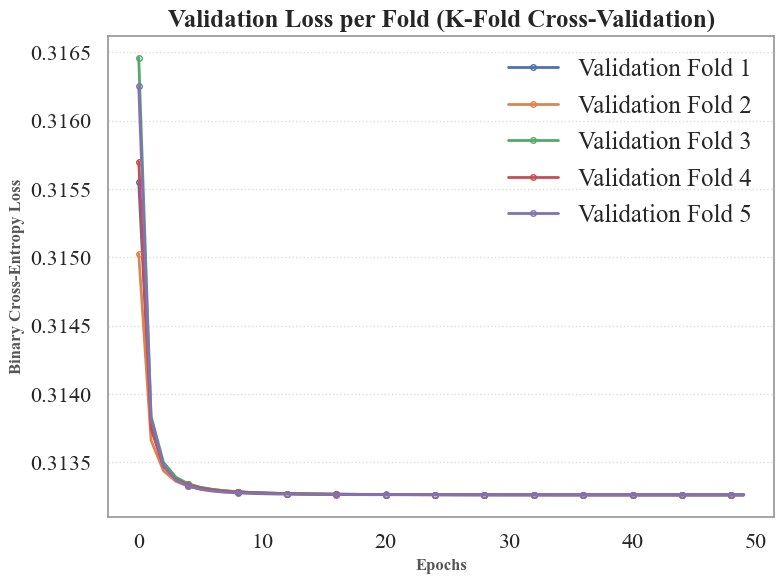

In [568]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局matplotlib样式，尝试设置字体为 Times New Roman
rcParams['font.family'] = 'Times New Roman'

# 其他样式保持不变...
rcParams['font.size'] = 12
rcParams['axes.labelcolor'] = '#555555'
rcParams['axes.edgecolor'] = '#999999'
rcParams['grid.color'] = '#CCCCCC'
rcParams['figure.facecolor'] = 'white'
rcParams['lines.linewidth'] = 2.0
rcParams['xtick.major.pad'] = 6
rcParams['ytick.major.pad'] = 6

# ...（其余加载数据和训练模型的代码不变）

# 绘制K折交叉验证的损失函数图并进行美化
plt.figure(figsize=(8, 6))
for i, history in enumerate(histories):
    val_losses = history['val_loss']
    plt.plot(val_losses, label=f'Validation Fold {i+1}', linewidth=2, marker='o', markersize=4, markerfacecolor='none', markevery=4)

plt.xlabel('Epochs', fontweight='bold')
plt.ylabel('Binary Cross-Entropy Loss', fontweight='bold')
plt.title('Validation Loss per Fold (K-Fold Cross-Validation)', fontweight='bold', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.legend(frameon=False, loc='best', fontsize=18)
plt.tight_layout()
plt.show()

# ...（计算准确率的部分代码不变）

Average accuracy on cross-validation sets: 0.872478386167147


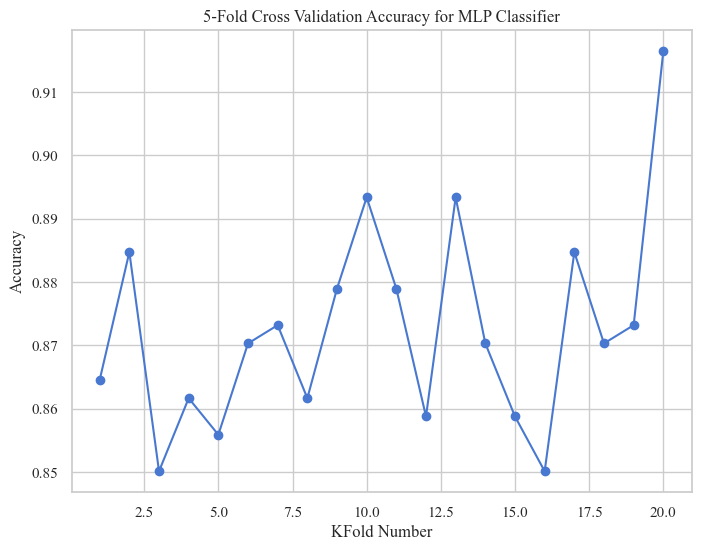

In [329]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# 读取数据
data = pd.read_csv('data2.csv')

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 
            'p2_distance_sum', 'p1_distance', 'p2_distance', 'game_victor']
target = 'point_victor'

# 数据预处理：标准化特征
scaler = StandardScaler()
X = scaler.fit_transform(data[features])
y = data[target]

# 使用KFold进行交叉验证
kf = KFold(n_splits=20, shuffle=True, random_state=42)
accuracies = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # 初始化多层感知机分类器
    clf = MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=42)

    # 训练模型
    clf.fit(X_train, y_train)

    # 预测测试集
    y_pred = clf.predict(X_test)

    # 计算并存储精度
    accuracies.append(accuracy_score(y_test, y_pred))

# 打印交叉验证平均准确率
print(f"Average accuracy on cross-validation sets: {np.mean(accuracies)}")

# 绘制交叉验证结果图
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o')
plt.xlabel('KFold Number')
plt.ylabel('Accuracy')
plt.title('20-Fold Cross Validation Accuracy for MLP Classifier')
plt.grid(True)
plt.show()

# 若要获取特征重要性，MLPClassifier通常没有直接的属性，可以尝试其他方法如PermutationImportance等

In [469]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置全局matplotlib样式以获得淡雅外观
rcParams['font.family'] = 'Arial'  # 或使用 'Times New Roman'（视系统支持情况而定）
rcParams['font.size'] = 12
rcParams['axes.labelcolor'] = '#555555'
rcParams['axes.edgecolor'] = '#999999'
rcParams['grid.color'] = '#CCCCCC'
rcParams['figure.facecolor'] = 'white'
rcParams['lines.linewidth'] = 2.0
rcParams['xtick.major.pad'] = 6
rcParams['ytick.major.pad'] = 6

# ...（其余加载数据和预处理的代码不变）

# KFold交叉验证及计算准确率
kf = KFold(n_splits=20, shuffle=True, random_state=42)
accuracies = []

for train_index, test_index in kf.split(X):
    # ...（训练模型及预测的代码不变）

# 计算平均准确率
avg_accuracy = np.mean(accuracies)

print(f"Average accuracy on cross-validation sets: {avg_accuracy:.3f}")

# 绘制交叉验证结果图并进行美化
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o', color='#1f77b4', linewidth=2, markersize=6, 
         markeredgecolor='none', markevery=4, label='Accuracy per Fold')
plt.xlabel('KFold Number', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.title('20-Fold Cross Validation Accuracy for MLP Classifier', fontweight='bold')
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ylim([0.5, 1])  # 可以自定义y轴范围来突出显示变化趋势
plt.legend(frameon=False, loc='best', fontsize=10)
plt.tight_layout()
plt.show()

IndentationError: expected an indented block (2919632059.py, line 25)

Average accuracy on cross-validation sets: 0.872478386167147


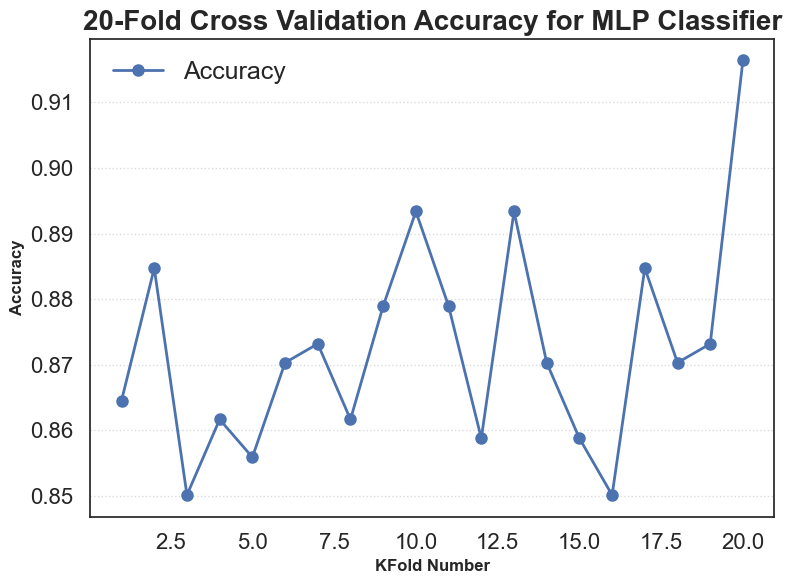

In [567]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
rcParams = {'font.family': 'Times New Roman',  # 设置字体为 Times New Roman
            # 其他样式设置...
}
# 设置matplotlib全局样式
plt.style.use('seaborn-ticks')  # 使用较为淡雅的样式
rcParams = {'font.family': 'Times New Roman',  # 设置字体为 Times New Roman
            'font.size': 14,
            'axes.labelcolor': '#333333',
            'axes.edgecolor': '#999999',
            'grid.color': '#CCCCCC',
            'figure.facecolor': 'white',
            'lines.linewidth': 2.0,
            'xtick.major.pad': 6,
            'ytick.major.pad': 6}

# 读取数据
data = pd.read_csv('data2.csv')

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 
            'p2_distance_sum', 'p1_distance', 'p2_distance', 'game_victor']
target = 'point_victor'

# 数据预处理：标准化特征
scaler = StandardScaler()
X = scaler.fit_transform(data[features])
y = data[target]

# 使用KFold进行交叉验证
kf = KFold(n_splits=20, shuffle=True, random_state=42)
accuracies = []

for fold, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # 初始化多层感知机分类器
    clf = MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=42)

    # 训练模型
    clf.fit(X_train, y_train)

    # 预测测试集
    y_pred = clf.predict(X_test)

    # 计算并存储精度
    accuracies.append(accuracy_score(y_test, y_pred))

# 打印交叉验证平均准确率
print(f"Average accuracy on cross-validation sets: {np.mean(accuracies)}")

# 绘制交叉验证结果图
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o', markersize=8, linewidth=2, label='Accuracy')
plt.xlabel('KFold Number', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.title('20-Fold Cross Validation Accuracy for MLP Classifier', fontweight='bold', fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.legend(frameon=False, loc='best', fontsize=18)
plt.tight_layout()
plt.show()

In [473]:
import matplotlib.pyplot as plt
from matplotlib import rcParams, font_manager

# 设置全局matplotlib样式以获得淡雅外观
try:
    # 尝试加载 Times New Roman 字体
    times_font = font_manager.FontProperties(fname="path/to/times.ttf").get_name()
except IOError:
    # 如果Times New Roman字体文件不存在，则使用系统默认的Arial或其他支持的字体
    times_font = 'Arial'

rcParams['font.family'] = times_font
rcParams['font.size'] = 12
rcParams['axes.labelcolor'] = '#555555'
rcParams['axes.edgecolor'] = '#999999'
rcParams['grid.color'] = '#CCCCCC'
rcParams['figure.facecolor'] = 'white'
rcParams['lines.linewidth'] = 2.0
rcParams['xtick.major.pad'] = 6
rcParams['ytick.major.pad'] = 6

# ...（其余加载数据和预处理的代码不变）

# KFold交叉验证及计算准确率
kf = KFold(n_splits=20, shuffle=True, random_state=42)
accuracies = []

for train_index, test_index in kf.split(X):
    # ...（训练模型及预测的代码不变）

# 计算平均准确率
avg_accuracy = np.mean(accuracies)

print(f"Average accuracy on cross-validation sets: {avg_accuracy:.3f}")

# 绘制交叉验证结果图并进行美化
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o', color='#1f77b4', linewidth=2, markersize=6, 
         markeredgecolor='none', markevery=4, label='Accuracy per Fold')
plt.xlabel('KFold Number', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.title('20-Fold Cross Validation Accuracy for MLP Classifier', fontweight='bold')
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ylim([0.5, 1])  # 可以自定义y轴范围来突出显示变化趋势
plt.legend(frameon=False, loc='best', fontsize=10)
plt.tight_layout()
plt.show()

IndentationError: expected an indented block (949223584.py, line 32)

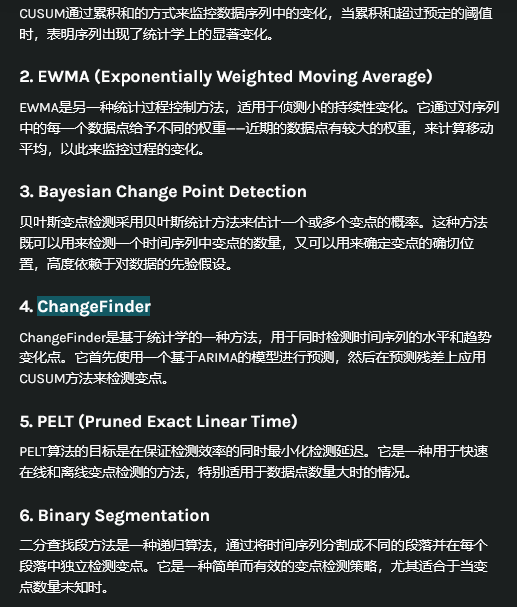

In [377]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 加载数据
data = pd.read_csv('data2.csv')

# 被标准化的列
columns_to_scale = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games',
                        'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score',"P1server","P2server",
                        'p1_ace','p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err',
                        'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']

# 初始化StandardScaler并进行标准化
scaler = StandardScaler()
data[columns_to_scale] = scaler.fit_transform(data[columns_to_scale])

# 定义特征权重字典
feature_weights = {
    'p1_ace': 3.811112,
    'p2_score': 2.217707,
    'victor_value': 2.063146 / 2,  # 假设平均分配给两个玩家
    'p1_err': 1.780813,
    'p2-1_score': 1.732923,
    'p1_distance': 1.707019,
    'p1_distance_sum': 1.633282,
    'p1_score': 1.606762,
    'game_victor': 1.563058 / 2,  # 假设平均分配给两个玩家
    'p1-2_games': 1.454290,
    'p1_games': 0.941274,
    'p2_fault': 0.674129,
    'p2_ace': 0.355335,
    'p2_games': -0.500947,
    'P2server': -0.640952,
    'p2_distance': -0.808530,
    'p2_distance_sum': -1.082411,
    'p1_fault': -1.183821,
    'P1server': -1.368342,
    'p2-1_games': -2.071581,
    'p1-2_score': -2.400559,
    'p2_err': -3.973756,
}

# 创建新列 p1_momentum 和 p2_momentum
for player, prefix in [('p1', 'p1_momentum'), ('p2', 'p2_momentum')]:
    momentum_cols = [col for col in data.columns if (col.startswith(prefix) and col.replace(prefix + '_', '') in feature_weights) or 
                     (not col.startswith(('p1', 'p2')) and col in feature_weights)]
    
    # 计算加权和（对于通用特征，先假定平均分配给两个玩家）
    weighted_sum = sum(data[col] * feature_weights[col.replace(prefix + '_', '') if col.startswith(prefix) else col] for col in momentum_cols)
    
    # 将计算结果添加为新列
    data[f'{player}_momentum'] = weighted_sum

# 打印前几行以验证是否成功添加了新列
print(data.head())

# 保存处理后的数据到新的CSV文件
data.to_csv('data2_processed.csv', index=False)

   match_id elapsed_time  p1_games  p2_games  p1-2_games  p2-1_games  \
0      1301      0:00:00 -1.351857 -1.343696   -0.062777    0.062777   
1      1301      0:00:38 -1.351857 -1.343696   -0.062777    0.062777   
2      1301      0:01:01 -1.351857 -1.343696   -0.062777    0.062777   
3      1301      0:01:31 -1.351857 -1.343696   -0.062777    0.062777   
4      1301      0:02:21 -1.351857 -1.343696   -0.062777    0.062777   

   p1_score  p2_score  p1-2_score  p2-1_score  ...    p2_err  p1_distance_sum  \
0 -1.181733 -1.126459   -0.047779    0.047779  ...  0.400426        -1.420067   
1 -1.181733 -0.222792   -0.900911    0.900911  ...  0.400426        -1.415579   
2 -0.274484 -0.222792   -0.047779    0.047779  ...  0.400426        -1.403790   
3 -0.274484  0.680876   -0.900911    0.900911  ...  0.400426        -1.360129   
4  0.632765  0.680876   -0.047779    0.047779  ...  0.400426        -1.359574   

   p2_distance_sum  p1_distance  p2_distance  point_victor  game_victor  \
0    

In [474]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 假设您有一个名为data的DataFrame，且其中包含需要标准化的列
# data = pd.read_csv('your_data.csv')  # 如果数据来自CSV文件，加载数据
# 或者已经通过某种方式创建了这个DataFrame
data = pd.read_csv('data.csv')
# 被标准化的列
columns_to_scale = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games',
                        'p1_score', 'p2_score', 'p1-2_score', 'p2-1_score',"P1server","P2server",
                        'p1_ace','p2_ace', 'p1_fault', 'p2_fault', 'p1_err', 'p2_err',
                        'p1_distance_sum', 'p2_distance_sum', 'p1_distance', 'p2_distance']

# 初始化StandardScaler
scaler = StandardScaler()

# 对指定列进行标准化，并将结果存储在新的DataFrame df中
df = data.copy()
df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
# 计算p1_performance
# 计算p1_performance
df['p1_momentum'] = (df['p1_games'] + df['p1-2_games'] + df['p1_score'] + df['p1-2_score'] +
                          df['P1server'] + df['p1_ace'] +
                          df['p1_fault'] + df['p1_err'] - df['p1_distance_sum'] - df['p1_distance'])

# 计算p2_performance
df['p2_momentum'] = (df['p2_games'] + df['p2-1_games'] + df['p2_score'] + df['p2-1_score'] +
                        df['P2server'] +df['p2_ace'] +
                          df['p2_fault'] + df['p2_err'] - df['p2_distance_sum'] - df['p2_distance'])


# 验证结果，打印出data的头部来检查新列是否添加成功
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_momentum,p2_momentum
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-2.354827,-1.182219
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-0.127640,0.623791
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-2.046989,-1.190598
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,-2.703994,-3.644482
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,7.500336,1.056829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,-4.359154,-6.092273
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,-1.037271,-5.246650
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,1.211048,-5.414989
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,0.574632,-3.088896


In [472]:
df.to_csv('dfff.csv', index=False)
df = pd.read_csv('dff.csv')
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_momentum,p2_momentum
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-6.379092,-4.934759
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-4.254623,-3.227168
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-4.872433,-3.119044
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,0.136229,2.848439
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,2.796967,-3.559137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,7.270197,6.817656
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,7.469078,4.265768
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,8.741522,2.727841
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,7.671673,3.915348


In [350]:
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_fault,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,0,-1,0,6.000,7.840,6.000,7.840,2,0
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,0,11.253,14.934,5.253,7.094,1,0
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,0,-1,0,25.053,34.742,13.800,19.808,2,0
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,0,76.161,110.373,51.108,75.631,1,0
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,0,76.810,111.186,0.649,0.813,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,0,6313.082,5894.973,38.620,50.971,1,0
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,0,6330.615,5922.739,17.533,27.766,1,0
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,0,6341.497,5941.067,10.882,18.328,2,0
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,0,6349.390,5951.604,7.893,10.537,1,0


In [352]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 读取数据
data = df

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 'p2_distance_sum', 
            'p1_distance', 'p2_distance', 'game_victor']

X = data[features]
data['point_victor'] = data['point_victor'].replace({1: 0, 2: 1})  # 将'1'转为'0'，将'2'转为'1'
y = data['point_victor']

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [
    ('MLP', MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)),
    ('SVM', SVC(probability=True, random_state=42)),
    ('LGBM', LGBMClassifier(random_state=42)),
    ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Logistic Regression', LogisticRegression(random_state=42)),
    ('Naive Bayes', GaussianNB())
]

for model_name, clf in models:
    # 训练模型
    clf.fit(X_train, y_train)
    
    # 预测测试集
    y_pred = clf.predict(X_test)

    # 计算并打印精度
    accuracy = accuracy_score(y_test, y_pred)
    print(f"\nAccuracy on test set for {model_name}: {accuracy}")

    # 计算并打印F1 Score
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f"F1-Score on test set for {model_name}: {f1}")

    # 计算并打印Recall
    recall = recall_score(y_test, y_pred, average='weighted')
    print(f"Recall on test set for {model_name}: {recall}")

    # 计算并打印Precision
    precision = precision_score(y_test, y_pred, average='weighted')
    print(f"Precision on test set for {model_name}: {precision}")

    # 计算并打印Sensitivity (True Positive Rate)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    sensitivity = tp / (tp + fn) if (tp + fn) != 0 else 0
    print(f"Sensitivity (True Positive Rate) on test set for {model_name}: {sensitivity}")

    # 计算并打印Specificity (True Negative Rate)
    specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
    print(f"Specificity (True Negative Rate) on test set for {model_name}: {specificity}\n")

D:\Compiler_Environment\Python\Anconda\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")



Accuracy on test set for MLP: 0.861671469740634
F1-Score on test set for MLP: 0.8616680232096814
Recall on test set for MLP: 0.861671469740634
Precision on test set for MLP: 0.8617218315699722
Sensitivity (True Positive Rate) on test set for MLP: 0.8672438672438673
Specificity (True Negative Rate) on test set for MLP: 0.8561151079136691


Accuracy on test set for SVM: 0.8393371757925072
F1-Score on test set for SVM: 0.839289210888849
Recall on test set for SVM: 0.8393371757925072
Precision on test set for SVM: 0.839786396898971
Sensitivity (True Positive Rate) on test set for SVM: 0.8571428571428571
Specificity (True Negative Rate) on test set for SVM: 0.8215827338129497

[LightGBM] [Info] Number of positive: 2698, number of negative: 2854
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1121
[LightGBM] [Info] Number of data points in the train 

In [354]:
import numpy as np
from pyswarm import pso
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score

# 定义你的目标函数：我们将要最大化的是随机森林的交叉验证评分
def rf_objective(params):
    # 参数需要整数化，因为pswarm对实数空间进行优化
    n_estimators, max_depth = int(params[0]), int(params[1])
    
    # 定义随机森林模型
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=42)
    
    # 使用交叉验证计算auc
    auc = cross_val_score(clf, X_train, y_train, cv=5, scoring='roc_auc').mean()
    
    # 由于pso是最小化算法，我们通过取负AUC来转化为最大化问题
    return -auc

# 定义搜索空间：n_estimators(10, 300); max_depth(1, 50).
lb = [10, 1]  # 下界
ub = [300, 50]  # 上界

# 执行PSO算法
xopt, fopt = pso(rf_objective, lb, ub, swarmsize=30, maxiter=50, minfunc=1e-4, minstep=1e-4, debug=True)

# 打印找到的最佳解和对应的AUC分数（负号转换回来）
print(f"Optimal parameters found: n_estimators={int(xopt[0])}, max_depth={int(xopt[1])}")
print(f"Maximum CV AUC: {-fopt}")

# 用最佳参数重新训练模型
clf_optimized = RandomForestClassifier(n_estimators=int(xopt[0]), max_depth=int(xopt[1]), random_state=42)
clf_optimized.fit(X_train, y_train)

# 其他的模型评估可以继续进行...


No constraints given.
New best for swarm at iteration 1: [261.93095041  12.57424137] -0.9524841742578378
Best after iteration 1: [261.93095041  12.57424137] -0.9524841742578378
New best for swarm at iteration 2: [300.          13.93648886] -0.9528520676369239


KeyboardInterrupt: 

Average accuracy on cross-validation sets: 0.872


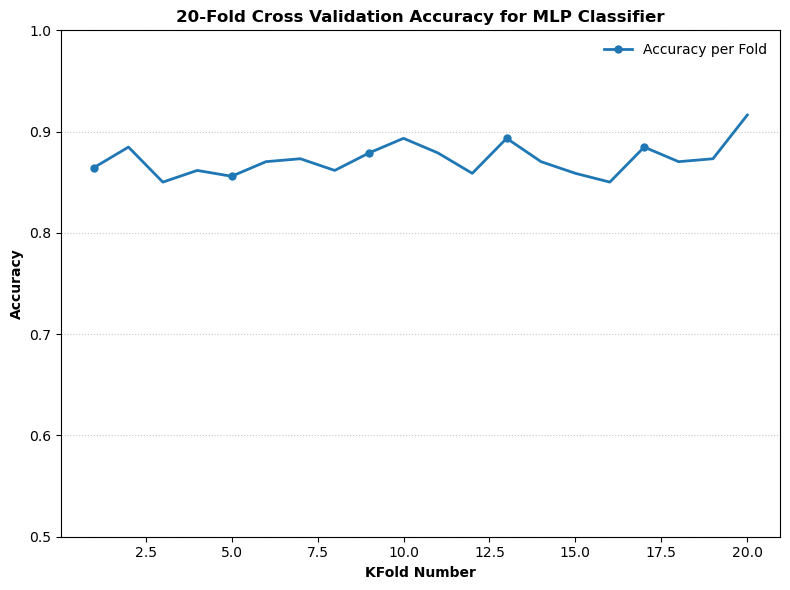

In [475]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

# 设置全局matplotlib样式以获得淡雅外观并使用Times New Roman字体（需确保系统支持）
plt.style.use('default')  # 使用默认样式作为基础
rcParams = {'font.family': 'Times New Roman',  # 设置字体为 Times New Roman
            'font.size': 12,
            'axes.labelcolor': '#555555',
            'axes.edgecolor': '#999999',
            'grid.color': '#CCCCCC',
            'figure.facecolor': 'white',
            'lines.linewidth': 2.0,
            'xtick.major.pad': 6,
            'ytick.major.pad': 6}

# 读取数据
data = pd.read_csv('data2.csv')

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 
            'p2_distance_sum', 'p1_distance', 'p2_distance', 'game_victor']
target = 'point_victor'

# 数据预处理：标准化特征
scaler = StandardScaler()
X = scaler.fit_transform(data[features])
y = data[target]

# 使用KFold进行交叉验证
kf = KFold(n_splits=20, shuffle=True, random_state=42)
accuracies = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # 初始化多层感知机分类器
    clf = MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=42)

    # 训练模型
    clf.fit(X_train, y_train)

    # 预测测试集
    y_pred = clf.predict(X_test)

    # 计算并存储精度
    accuracies.append(accuracy_score(y_test, y_pred))

# 计算平均准确率
avg_accuracy = np.mean(accuracies)

print(f"Average accuracy on cross-validation sets: {avg_accuracy:.3f}")

# 绘制交叉验证结果图并进行美化
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o', color='#1f77b4', linewidth=2, markersize=6, 
         markeredgecolor='none', markevery=4, label='Accuracy per Fold')
plt.xlabel('KFold Number', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.title('20-Fold Cross Validation Accuracy for MLP Classifier', fontweight='bold')
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ylim([0.5, 1])  # 可以自定义y轴范围来突出显示变化趋势
plt.legend(frameon=False, loc='best', fontsize=10)
plt.tight_layout()
plt.show()

In [358]:
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_momentum,p2_momentum
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,0,0,-6.379092,-4.934759
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,0,0,-4.254623,-3.227168
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,0,0,-4.872433,-3.119044
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,0,0,0.136229,2.848439
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,0,0,2.796967,-3.559137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,0,0,7.270197,6.817656
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,0,0,7.469078,4.265768
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,0,0,8.741522,2.727841
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,0,0,7.671673,3.915348


In [361]:
df = pd.read_csv('data.csv')
df

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_fault,p2_fault,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor
0,1301,0:00:00,0,0,0,0,0,0,0,0,...,0,0,-1,0,6.000,7.840,6.000,7.840,2,0
1,1301,0:00:38,0,0,0,0,0,15,-15,15,...,0,0,0,0,11.253,14.934,5.253,7.094,1,0
2,1301,0:01:01,0,0,0,0,15,15,0,0,...,0,0,-1,0,25.053,34.742,13.800,19.808,2,0
3,1301,0:01:31,0,0,0,0,15,30,-15,15,...,0,0,0,0,76.161,110.373,51.108,75.631,1,0
4,1301,0:02:21,0,0,0,0,30,30,0,0,...,0,0,0,0,76.810,111.186,0.649,0.813,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,5,4,1,-1,0,15,-15,15,...,0,0,0,0,6313.082,5894.973,38.620,50.971,1,0
6936,1701,4:40:43,5,4,1,-1,15,15,0,0,...,0,0,0,0,6330.615,5922.739,17.533,27.766,1,0
6937,1701,4:41:20,5,4,1,-1,30,15,15,-15,...,0,0,0,0,6341.497,5941.067,10.882,18.328,2,0
6938,1701,4:41:52,5,4,1,-1,30,30,0,0,...,0,0,0,0,6349.390,5951.604,7.893,10.537,1,0


Feature Importances:

p2_err             0.115
p1_momentum        0.111
p2_momentum        0.093
p2_distance_sum    0.080
p1_distance_sum    0.075
p1_err             0.073
game_victor        0.063
P2server           0.048
p1-2_score         0.047
p2-1_score         0.044
p2_games           0.038
P1server           0.036
p1_score           0.034
p2_score           0.032
p1_games           0.030
p2-1_games         0.025
p1-2_games         0.025
p2_ace             0.017
p1_ace             0.009
p1_fault           0.006
p2_fault           0.000
dtype: float64


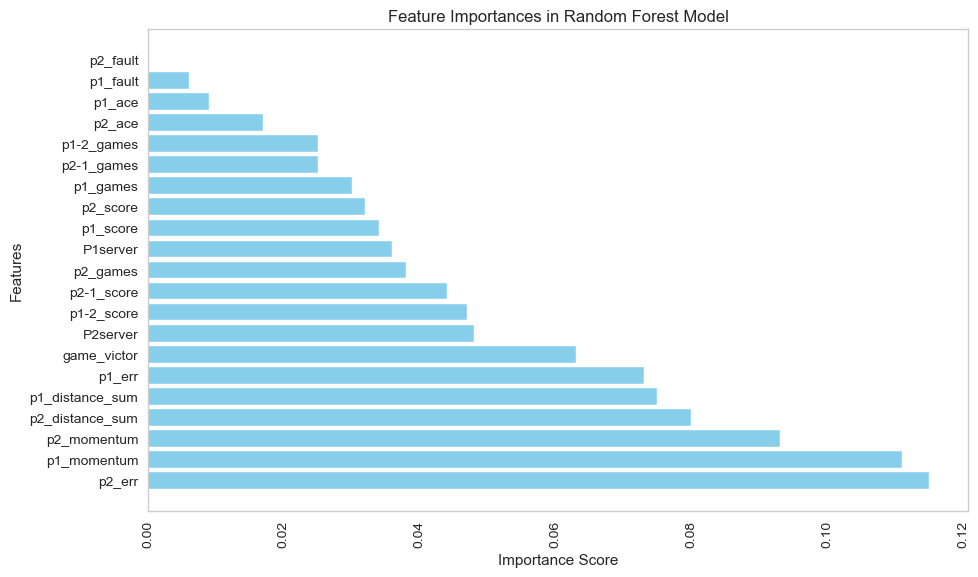

In [421]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 读取数据
data = df

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 'p2_distance_sum', 
            'p1_momentum', 'p2_momentum', 'game_victor']

X = data[features]
data['point_victor'] = data['point_victor']
y = data['point_victor']

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 只使用随机森林模型
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# 预测测试集
y_pred = clf.predict(X_test)


# 计算并打印特征重要性，保留三位小数

feature_importances = clf.feature_importances_

importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

importances = importances.round(3)


print("Feature Importances:\n")

print(importances)


# 绘制特征重要性条形图

plt.figure(figsize=(10, 6))

plt.barh(importances.index, importances.values, color='skyblue')

plt.title('Feature Importances in Random Forest Model')

plt.xlabel('Importance Score')

plt.ylabel('Features')

plt.xticks(rotation=90)

plt.tight_layout()

plt.show()

In [480]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

mpl.rcParams['font.family'] = 'Times New Roman'
# 确保timesnew roman字体可用（如果系统已安装）
# 若未安装，需先下载对应字体文件并正确配置
plt.rcParams['font.family'] = 'Times New Roman'

# 其他图形样式设置
plt.style.use('_mpl-gallery-nogrid')

# 绘制特征重要性条形图
fig, ax = plt.subplots(figsize=(10, 6))

bar_colors = '#87CEFA'  # SkyBlue
ax.barh(importances.index, importances.values, color=bar_colors)

# 设置标题、坐标轴标签等
ax.set_title('Feature Importances in Random Forest Model', fontweight='bold')
ax.set_xlabel('Importance Score', fontsize=12)
ax.set_ylabel('Features', fontsize=12)

# 设置刻度标签旋转角度
plt.xticks(rotation=90)

# 自动调整间距，使图形紧凑
plt.tight_layout()

# 添加数值标签到条形图上（可选）
for i, (importance, feature) in enumerate(zip(importances, importances.index)):
    ax.text(importances[feature], i, f'{importance:.3f}', va='center')

# 显示图形
plt.show()

NameError: name 'mpl' is not defined

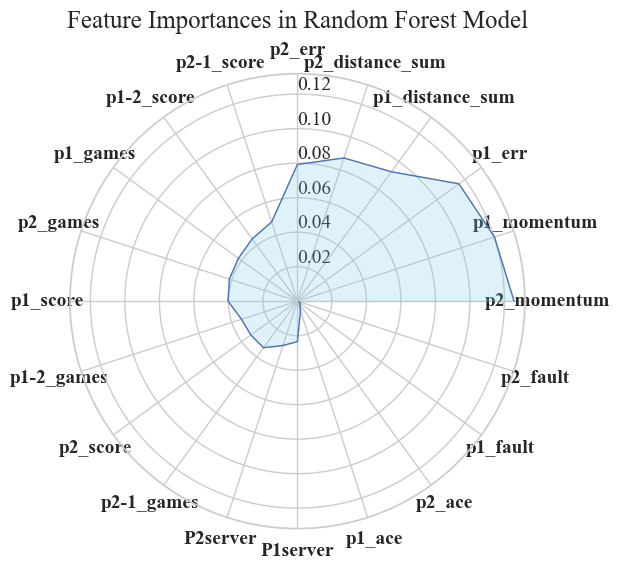

In [562]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Times New Roman'
# 读取数据并定义特征和目标变量 (假设df已存在)
data = df
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 'p2_distance_sum', 
            'p1_momentum', 'p2_momentum']
y = 'point_victor'

X = data[features]
y = data[y]

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 使用随机森林模型并计算特征重要性
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

feature_importances = clf.feature_importances_

# 将特征重要性转换为DataFrame并排序
importances = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importances = importances.sort_values('Importance', ascending=False)

# 绘制雷达图
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, polar=True)

# 确保角度数与特征数量一致
num_features = len(importances)
angles = np.linspace(0, 2*np.pi, num_features, endpoint=False)
importance_values = list(importances['Importance'].values)

# 绘制填充区域和线条
ax.fill(angles, importance_values, color='skyblue', alpha=0.25)
ax.plot(angles, importance_values, linewidth=1, linestyle='solid')

# 设置标签
ax.set_thetagrids(angles * 180 / np.pi, labels=importances['Feature'], fontsize=10, weight='bold')
ax.tick_params(labelsize=14)

# 设置标题和轴标签
ax.set_title('Feature Importances in Random Forest Model', va='bottom',fontsize=18)
ax.set_rlabel_position(90)  # Move radial labels away from plotted area

plt.tight_layout()
plt.show()

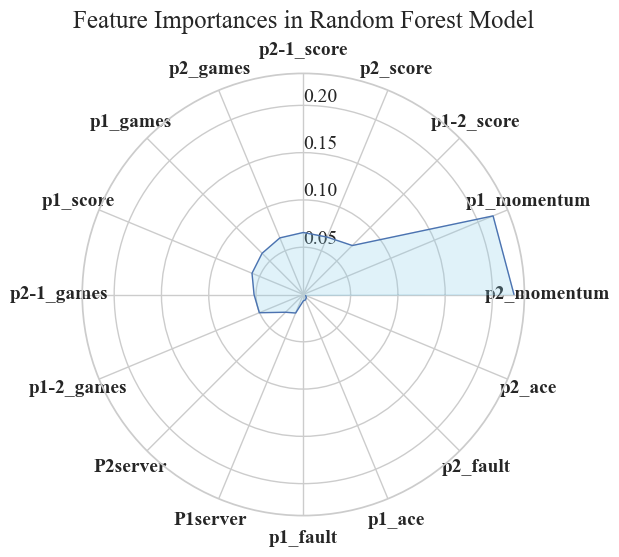

In [561]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Times New Roman'
# 读取数据并定义特征和目标变量 (假设df已存在)
data = df
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault',  
            'p1_momentum', 'p2_momentum']
y = 'point_victor'

X = data[features]
y = data[y]

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 使用随机森林模型并计算特征重要性
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

feature_importances = clf.feature_importances_

# 将特征重要性转换为DataFrame并排序
importances = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importances = importances.sort_values('Importance', ascending=False)

# 绘制雷达图
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, polar=True)

# 确保角度数与特征数量一致
num_features = len(importances)
angles = np.linspace(0, 2*np.pi, num_features, endpoint=False)
importance_values = list(importances['Importance'].values)

# 绘制填充区域和线条
ax.fill(angles, importance_values, color='skyblue', alpha=0.25)
ax.plot(angles, importance_values, linewidth=1, linestyle='solid')

# 设置标签
ax.set_thetagrids(angles * 180 / np.pi, labels=importances['Feature'], fontsize=10, weight='bold')
ax.tick_params(labelsize=14)

# 设置标题和轴标签
ax.set_title('Feature Importances in Random Forest Model', va='bottom',fontsize=18)
ax.set_rlabel_position(90)  # Move radial labels away from plotted area

plt.tight_layout()
plt.show()

In [381]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# 读取数据并定义特征和目标变量 (假设df已存在)
data = df
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault', 'p1_err', 'p2_err', 'p1_distance_sum', 'p2_distance_sum', 
            'p1_momentum', 'p2_momentum']
y = 'point_victor'

X = data[features]
y = data[y]

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 使用随机森林模型并计算特征重要性
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

feature_importances = clf.feature_importances_

# 将特征重要性转换为DataFrame并排序
importances = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importances = importances.sort_values('Importance', ascending=False)

# 绘制雷达图
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, polar=True)

# 确保角度数与特征数量一致
num_features = len(importances)
angles = np.linspace(0, 2*np.pi, num_features, endpoint=False)
importance_values = list(importances['Importance'].values)

# 绘制填充区域和线条
ax.fill(angles, importance_values, color='skyblue', alpha=0.25)
ax.plot(angles, importance_values, linewidth=1, linestyle='solid')

# 设置标签
ax.set_thetagrids(angles * 180 / np.pi, labels=importances['Feature'], fontsize=8, weight='bold')
ax.tick_params(labelsize=8)

# 设置标题和轴标签
ax.set_title('Feature Importances in Random Forest Model', va='bottom')
ax.set_rlabel_position(90)  # Move radial labels away from plotted area

plt.tight_layout()
plt.show()

SyntaxError: EOL while scanning string literal (1311563013.py, line 13)

Feature Importances:

p1_momentum    0.234
p2_momentum    0.181
p1-2_score     0.075
p2-1_score     0.070
p2_games       0.068
p2_score       0.064
p1_score       0.064
p1_games       0.057
P2server       0.042
p2-1_games     0.039
p1-2_games     0.039
P1server       0.022
p2_ace         0.022
p1_ace         0.011
p1_fault       0.009
p2_fault       0.004
dtype: float64


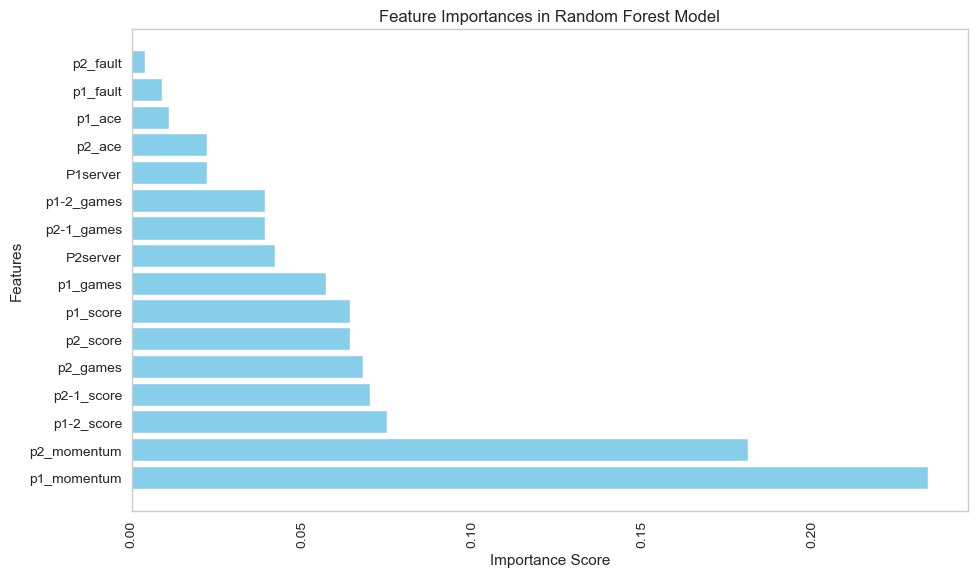

In [423]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 读取数据
data = df

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault',
            'p1_momentum', 'p2_momentum']

X = data[features]
data['point_victor'] = data['point_victor']
y = data['point_victor']

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 只使用随机森林模型
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# 预测测试集
y_pred = clf.predict(X_test)


# 计算并打印特征重要性，保留三位小数

feature_importances = clf.feature_importances_

importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

importances = importances.round(3)


print("Feature Importances:\n")

print(importances)


# 绘制特征重要性条形图

plt.figure(figsize=(10, 6))

plt.barh(importances.index, importances.values, color='skyblue')

plt.title('Feature Importances in Random Forest Model')

plt.xlabel('Importance Score')

plt.ylabel('Features')

plt.xticks(rotation=90)

plt.tight_layout()

plt.show()

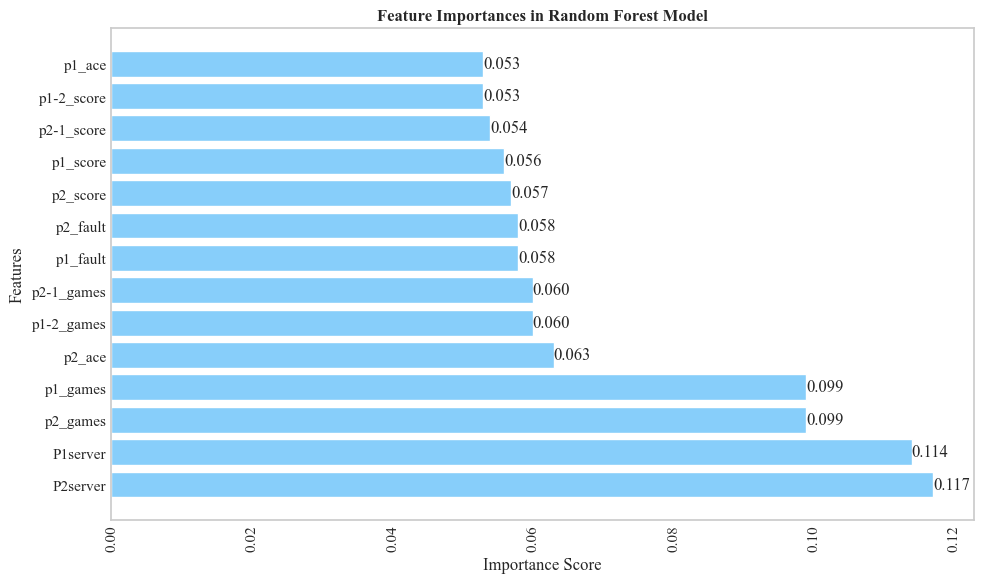

In [385]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# 确保timesnew roman字体可用（如果系统已安装）
# 若未安装，需先下载对应字体文件并正确配置
plt.rcParams['font.family'] = 'Times New Roman'

# 其他图形样式设置
plt.style.use('_mpl-gallery-nogrid')

# 绘制特征重要性条形图
fig, ax = plt.subplots(figsize=(10, 6))

bar_colors = '#87CEFA'  # SkyBlue
ax.barh(importances.index, importances.values, color=bar_colors)

# 设置标题、坐标轴标签等
ax.set_title('Feature Importances in Random Forest Model', fontweight='bold')
ax.set_xlabel('Importance Score', fontsize=12)
ax.set_ylabel('Features', fontsize=12)

# 设置刻度标签旋转角度
plt.xticks(rotation=90)

# 自动调整间距，使图形紧凑
plt.tight_layout()

# 添加数值标签到条形图上（可选）
for i, (importance, feature) in enumerate(zip(importances, importances.index)):
    ax.text(importances[feature], i, f'{importance:.3f}', va='center')

# 显示图形
plt.show()

Feature Importances:

P2server      0.117
P1server      0.114
p2_games      0.099
p1_games      0.099
p2_ace        0.063
p1-2_games    0.060
p2-1_games    0.060
p1_fault      0.058
p2_fault      0.058
p2_score      0.057
p1_score      0.056
p2-1_score    0.054
p1-2_score    0.053
p1_ace        0.053
dtype: float64


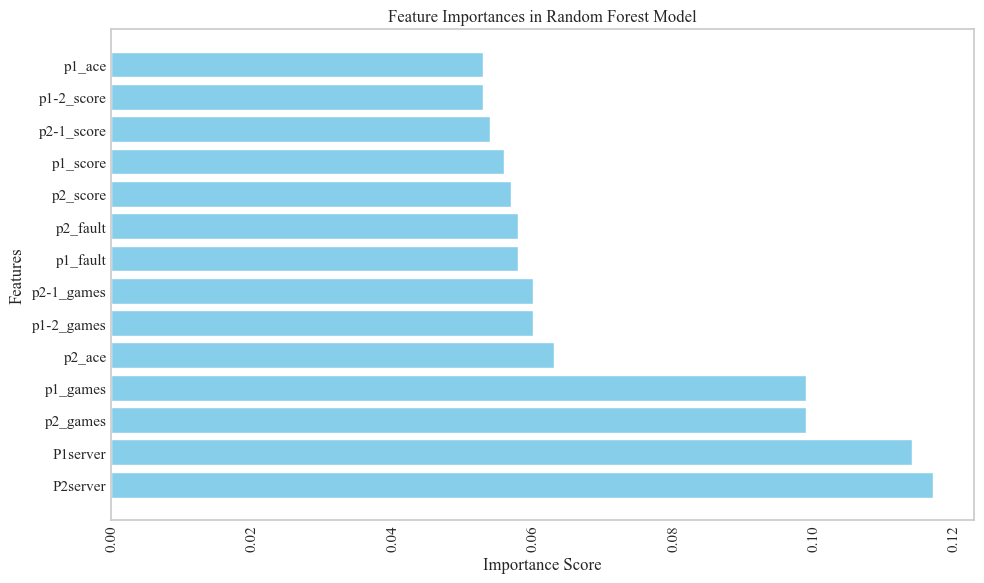

In [384]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 读取数据
data = df

# 定义特征和目标变量
features = ['p1_games', 'p2_games', 'p1-2_games', 'p2-1_games', 'p1_score', 'p2_score', 
            'p1-2_score', 'p2-1_score', 'P1server', 'P2server', 'p1_ace', 'p2_ace', 
            'p1_fault', 'p2_fault']

X = data[features]
data['point_victor'] = data['point_victor']
y = data['point_victor']

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 只使用随机森林模型
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# 预测测试集
y_pred = clf.predict(X_test)


# 计算并打印特征重要性，保留三位小数

feature_importances = clf.feature_importances_

importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

importances = importances.round(3)


print("Feature Importances:\n")

print(importances)


# 绘制特征重要性条形图

plt.figure(figsize=(10, 6))

plt.barh(importances.index, importances.values, color='skyblue')

plt.title('Feature Importances in Random Forest Model')

plt.xlabel('Importance Score')

plt.ylabel('Features')

plt.xticks(rotation=90)

plt.tight_layout()

plt.show()

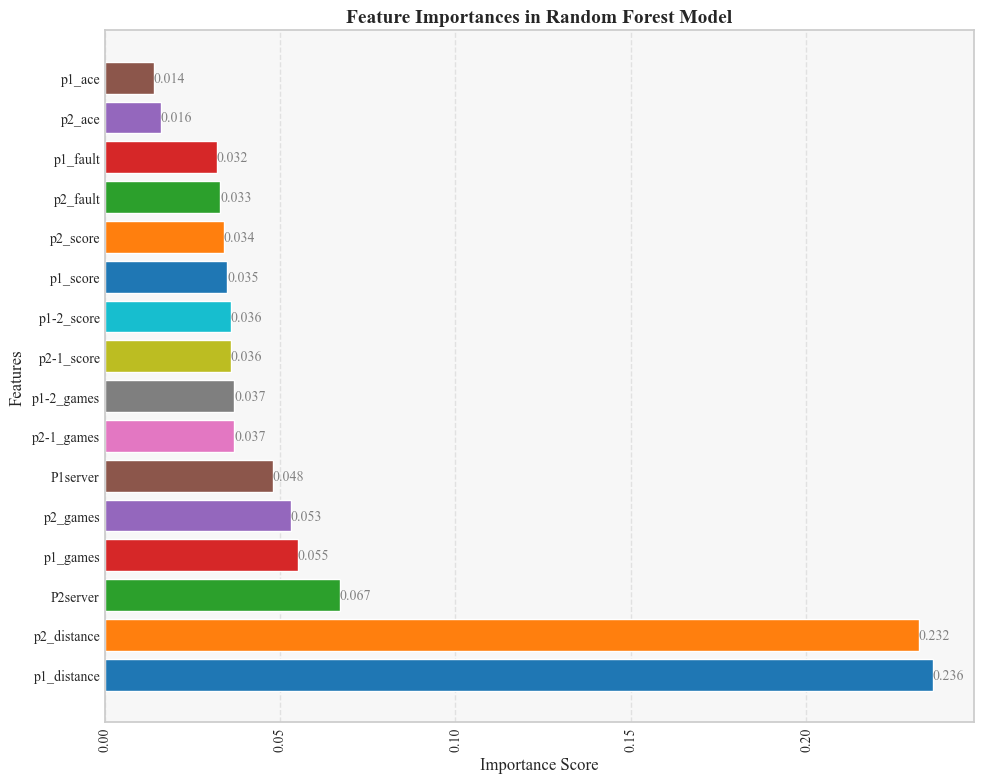

In [383]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# 设置全局字体为Times New Roman（确保已安装并正确配置）
font = FontProperties(family='Times New Roman')

# 定义配色方案
bar_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', 
              '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']  # 使用默认的matplotlib颜色循环作为示例

# 绘制特征重要性条形图
fig, ax = plt.subplots(figsize=(10, 8))

# 使用自定义颜色循环
for i, importance in enumerate(importances.values):
    ax.barh(importances.index[i], importance, color=bar_colors[i % len(bar_colors)])

# 调整图形样式
ax.set_facecolor('#f7f7f7')  # 设置背景色
ax.grid(axis='x', linestyle='--', alpha=0.5)  # 添加网格线
ax.set_title('Feature Importances in Random Forest Model', fontproperties=font, fontsize=14, fontweight='bold')
ax.set_xlabel('Importance Score', fontproperties=font, fontsize=12)
ax.set_ylabel('Features', fontproperties=font, fontsize=12)

# 设置刻度标签旋转角度及字体
plt.xticks(rotation=90, fontproperties=font, fontsize=10)
plt.yticks(fontproperties=font, fontsize=10)

# 自动调整间距，使图形紧凑
plt.tight_layout()

# 添加数值标签到条形图上（可选）
for i, (importance, feature) in enumerate(zip(importances, importances.index)):
    ax.text(importances[feature], i, f'{importance:.3f}', va='center', fontproperties=font, fontsize=10, color='gray')

# 显示图形
plt.show()

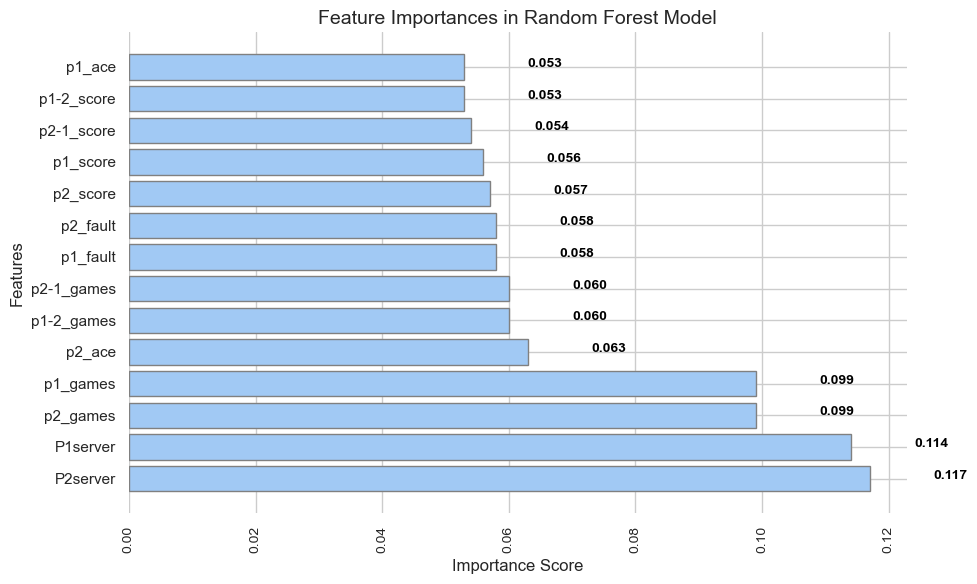

In [387]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ...（之前的代码不变）

# 绘制特征重要性条形图，使用Seaborn风格和自定义配色方案
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(importances.index, importances.values, color=sns.color_palette("pastel")[0], edgecolor='grey')

# 设置标题、标签及坐标轴刻度样式
plt.title('Feature Importances in Random Forest Model', fontsize=14)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)

# 调整x轴刻度标签旋转角度
plt.xticks(fontsize=10, rotation=90)

# 添加数值标签到条形图上
for i, v in enumerate(importances.values):
    ax.text(v + 0.01, i, f'{v:.3f}', color='black', fontweight='bold', fontsize=10)

# 美化图形布局
plt.tight_layout()
sns.despine(left=True, bottom=True)
plt.show()

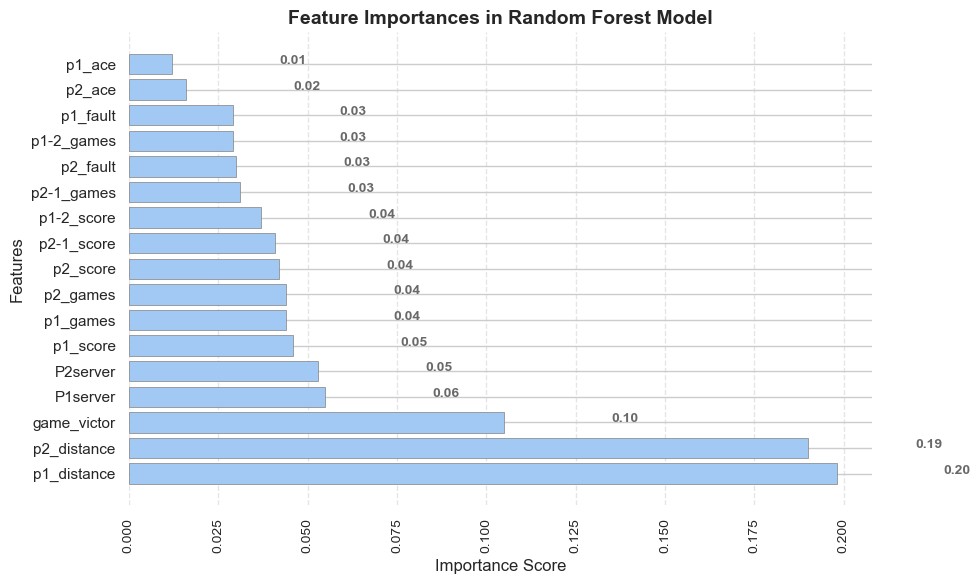

In [365]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rc

# 设置全局字体为Times New Roman（确保系统已安装此字体）
rc('font', family='Times New Roman')

# ...（之前的代码不变）

# 绘制特征重要性条形图，使用Seaborn风格和自定义配色方案
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(importances.index, importances.values, color=sns.color_palette("pastel")[0], edgecolor='grey', linewidth=0.5)

# 设置标题、标签及坐标轴刻度样式，并采用Times New Roman字体
plt.title('Feature Importances in Random Forest Model', fontsize=14, fontweight='bold')
plt.xlabel('Importance Score', fontsize=12, fontweight='normal')
plt.ylabel('Features', fontsize=12, fontweight='normal')

# 调整x轴刻度标签旋转角度
plt.xticks(fontsize=10, rotation=90)

# 添加数值标签到条形图上，略微增大偏移量并设定格式
for i, v in enumerate(importances.values):
    ax.text(v + 0.03, i, f'{v:.2f}', color='dimgrey', fontweight='bold', fontsize=10)

# 美化图形布局
plt.tight_layout()
sns.despine(left=True, bottom=True)
# 增加网格线以提高清晰度（可选）
ax.grid(axis='x', linestyle='--', alpha=0.5)

# 显示图形
plt.show()

# 如果在某些环境中仍无法正确显示Times New Roman，可能需要显式加载字体：
# from matplotlib.font_manager import FontProperties
# fontprop = FontProperties(fname='path_to_times_new_roman.ttf')  # 替换为实际字体文件路径
# 然后在设置文本时应用这个字体属性，例如：plt.title(..., fontproperties=fontprop)

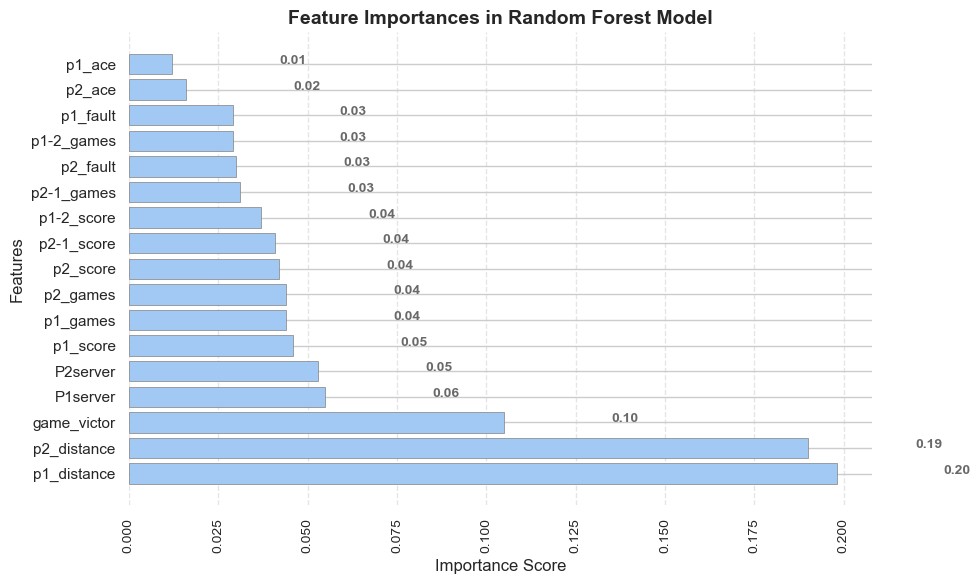

In [366]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rc

# 设置全局字体为Times New Roman（确保系统已安装此字体）
rc('font', family='Times New Roman')

# ...（之前的代码不变）

# 绘制特征重要性条形图，使用Seaborn风格和自定义配色方案
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(importances.index, importances.values, color=sns.color_palette("pastel")[0], edgecolor='grey', linewidth=0.5)

# 设置标题、标签及坐标轴刻度样式，并采用Times New Roman字体
plt.title('Feature Importances in Random Forest Model', fontsize=14, fontweight='bold')
plt.xlabel('Importance Score', fontsize=12, fontweight='normal')
plt.ylabel('Features', fontsize=12, fontweight='normal')

# 调整x轴刻度标签旋转角度
plt.xticks(fontsize=10, rotation=90)

# 添加数值标签到条形图上，略微增大偏移量并设定格式
for i, v in enumerate(importances.values):
    ax.text(v + 0.03, i, f'{v:.2f}', color='dimgrey', fontweight='bold', fontsize=10)

# 美化图形布局
plt.tight_layout()
sns.despine(left=True, bottom=True)
# 增加网格线以提高清晰度（可选）
ax.grid(axis='x', linestyle='--', alpha=0.5)

# 显示图形
plt.show()

# 如果在某些环境中仍无法正确显示Times New Roman，可能需要显式加载字体：
# from matplotlib.font_manager import FontProperties
# fontprop = FontProperties(fname='path_to_times_new_roman.ttf')  # 替换为实际字体文件路径
# 然后在设置文本时应用这个字体属性，例如：plt.title(..., fontproperties=fontprop)

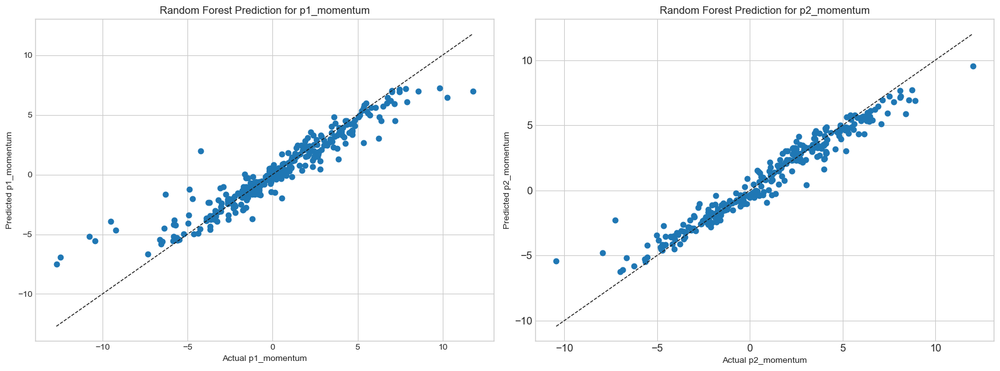

In [485]:
# 导入额外的模块以更改样式和字体
from matplotlib import rcParams
import matplotlib.style as style

# 设置全局样式为一种淡雅的主题，例如“bmh”、“ggplot”等
style.use('seaborn-whitegrid')  # 或选择你喜欢的淡雅主题

# 设置字体为新罗马字体，这里假设系统中存在'Arial'字体
rcParams['font.family'] = 'Arial'

# 绘制预测拟合图（原有代码保持不变）
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

axs[0].scatter(y_p1, y_pred_p1)
axs[0].plot([min(y_p1), max(y_p1)], [min(y_p1), max(y_p1)], '--k', linewidth=1)  # 线条宽度调小以适应淡雅风格
axs[0].set_xlabel("Actual p1_momentum")
axs[0].set_ylabel("Predicted p1_momentum")
axs[0].set_title("Random Forest Prediction for p1_momentum", fontweight='normal')

axs[1].scatter(y_p2, y_pred_p2)
axs[1].plot([min(y_p2), max(y_p2)], [min(y_p2), max(y_p2)], '--k', linewidth=1)
axs[1].set_xlabel("Actual p2_momentum")
axs[1].set_ylabel("Predicted p2_momentum")
axs[1].set_title("Random Forest Prediction for p2_momentum", fontweight='normal')

plt.tick_params(labelsize=12)  # 调整刻度标签字体大小

plt.tight_layout()
plt.show()

p1模型评估指标：R²=0.99, RMSE=0.46, MAE=0.33, MSE=0.21, MAPE=52.64%, SSE=61.22, Explained Variance=0.99
p2模型评估指标：R²=0.98, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=27.57%, SSE=87.13, Explained Variance=0.98


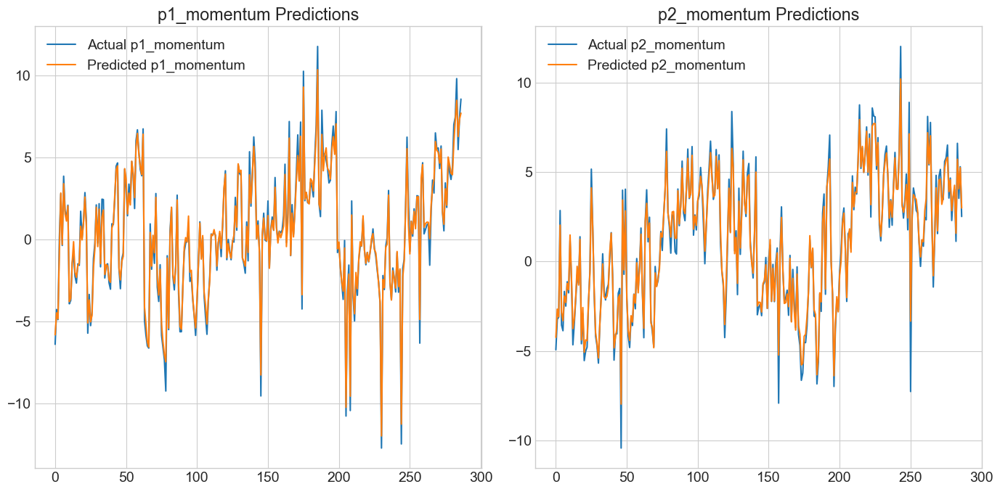

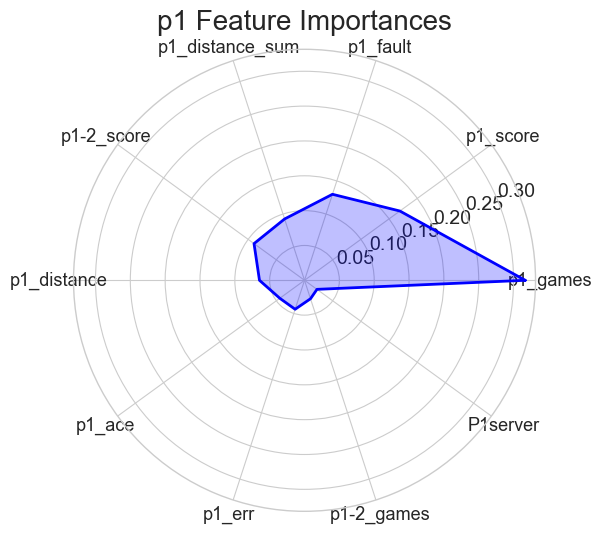

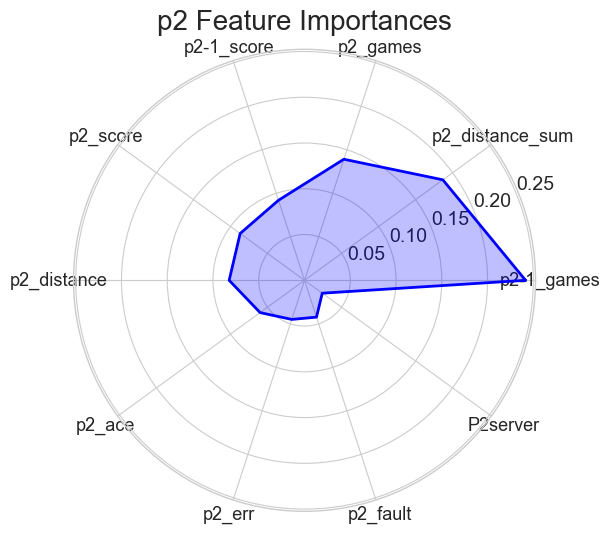

In [489]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 假设df是已经加载并预处理的DataFrame

# 定义一个函数来完成模型训练、预测和评估的过程
def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)

    # 预测
    y_pred = model.predict(X)

    # 计算指标
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)

    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

# 定义网格搜索参数
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

# 加载数据
df = pd.read_csv('dff.csv')  # 确保文件路径正确


# 选择match_id为1301的数据
match_data = df[df['match_id'] == 1301]
df = match_data

# 分别对p1和p2进行训练和评估
features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

# 训练并评估p1和p2模型
model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

# 打印评估结果
print("p1模型评估指标：R²={:.2f}, RMSE={:.2f}, MAE={:.2f}, MSE={:.2f}, MAPE={:.2f}%, SSE={:.2f}, Explained Variance={:.2f}".format(r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1))
print("p2模型评估指标：R²={:.2f}, RMSE={:.2f}, MAE={:.2f}, MSE={:.2f}, MAPE={:.2f}%, SSE={:.2f}, Explained Variance={:.2f}".format(r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2))

# 绘制预测和实际值
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum')
plt.plot(y_pred_p1, label='Predicted p1_momentum')
plt.title('p1_momentum Predictions')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum')
plt.plot(y_pred_p2, label='Predicted p2_momentum')
plt.title('p2_momentum Predictions')
plt.legend()

plt.tight_layout()
plt.show()

# 绘制特征重要性雷达图
def plot_feature_importance(importances, features, title):
    # 构建特征重要性DataFrame
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    # 排序
    importances_df = importances_df.sort_values('importance', ascending=False)

    # 雷达图需要的角度和半径
    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, importances, color='blue', alpha=0.25)
    ax.plot(angles, importances, color='blue', linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'], size=13)

    plt.title(title, size=20)
    plt.show()

# 绘制特征重要性雷达图
plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')


p1模型评估指标：R²=0.99, RMSE=0.46, MAE=0.33, MSE=0.21, MAPE=52.64%, SSE=61.22, Explained Variance=0.99
p2模型评估指标：R²=0.98, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=27.57%, SSE=87.13, Explained Variance=0.98


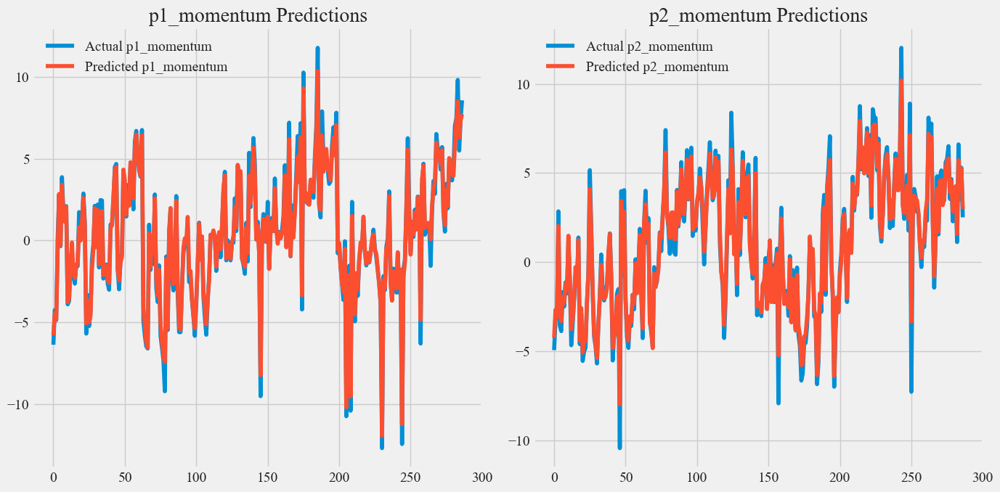

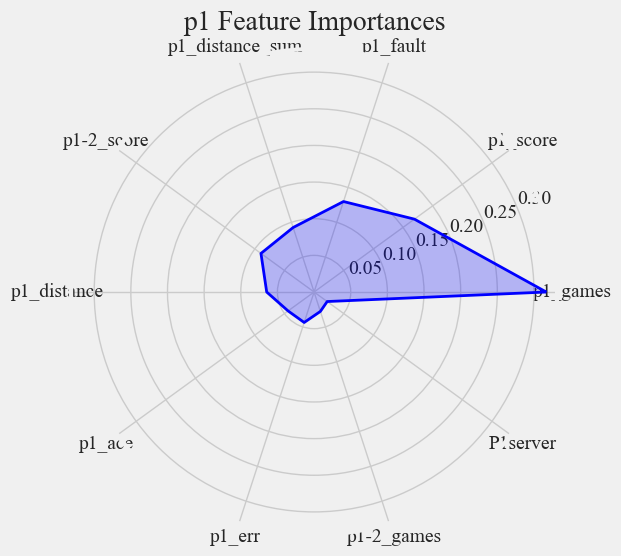

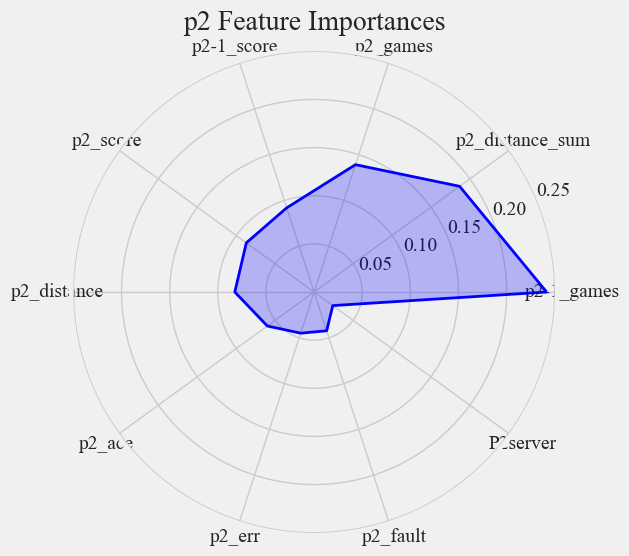

In [492]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 设置matplotlib全局字体为Times New Roman
plt.rcParams.update({'font.family':'Times New Roman', 'font.size': 12})

# 设置图表风格为典雅的fivethirtyeight
plt.style.use('fivethirtyeight')

def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)
    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data

features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

print("p1模型评估指标：R²={:.2f}, RMSE={:.2f}, MAE={:.2f}, MSE={:.2f}, MAPE={:.2f}%, SSE={:.2f}, Explained Variance={:.2f}".format(r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1))
print("p2模型评估指标：R²={:.2f}, RMSE={:.2f}, MAE={:.2f}, MSE={:.2f}, MAPE={:.2f}%, SSE={:.2f}, Explained Variance={:.2f}".format(r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2))

plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum')
plt.plot(y_pred_p1, label='Predicted p1_momentum')
plt.title('p1_momentum Predictions')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum')
plt.plot(y_pred_p2, label='Predicted p2_momentum')
plt.title('p2_momentum Predictions')
plt.legend()

plt.tight_layout()
plt.show()

def plot_feature_importance(importances, features, title):
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    importances_df = importances_df.sort_values('importance', ascending=False)

    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, importances, color='blue', alpha=0.25)
    ax.plot(angles, importances, color='blue', linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'])
    plt.title(title, size=20)
    plt.show()

plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')



Updated Evaluation Metrics:

p1_model: R²=0.99, RMSE=0.46, MAE=0.33, MSE=0.21, MAPE=52.64%, SSE=61.22, Explained Variance=0.99
p2_model: R²=0.98, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=27.57%, SSE=87.13, Explained Variance=0.98


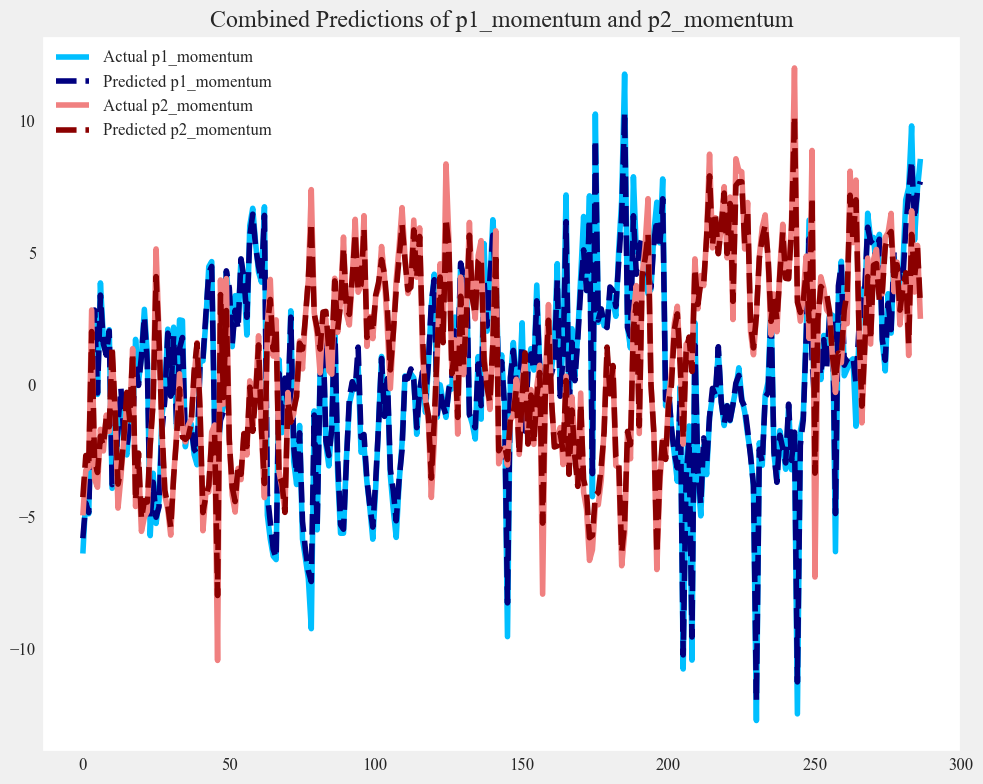

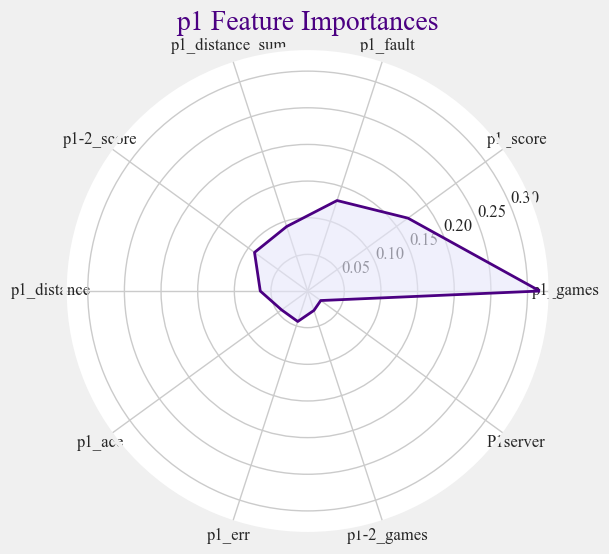

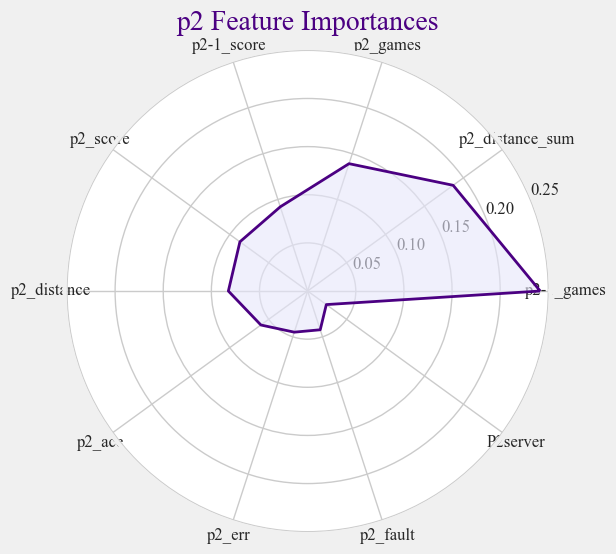

In [493]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 更新matplotlib配置以使用Times New Roman，同时适应淡雅风格要求
plt.rcParams.update({
    'font.family':'Times New Roman',
    'font.size': 12,
    'axes.grid': False,  # 禁用网格
    'axes.facecolor': 'white',  # 将背景色设置为白色
})

# 不使用plt.style.use('fivethirtyeight')以避免重置为灰色网格背景

def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)
    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data

features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

# 更新打印风格
print("Updated Evaluation Metrics:\n")
print(f"p1_model: R²={r2_p1:.2f}, RMSE={rmse_p1:.2f}, MAE={mae_p1:.2f}, MSE={mse_p1:.2f}, MAPE={mape_p1:.2f}%, SSE={sse_p1:.2f}, Explained Variance={explained_var_p1:.2f}")
print(f"p2_model: R²={r2_p2:.2f}, RMSE={rmse_p2:.2f}, MAE={mae_p2:.2f}, MSE={mse_p2:.2f}, MAPE={mape_p2:.2f}%, SSE={sse_p2:.2f}, Explained Variance={explained_var_p2:.2f}")

# 绘制合并的预测和实际值图
plt.figure(figsize=(10, 8))
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum', color='deepskyblue')
plt.plot(y_pred_p1, label='Predicted p1_momentum', linestyle='--', color='navy')
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum', color='lightcoral')
plt.plot(y_pred_p2, label='Predicted p2_momentum', linestyle='--', color='darkred')
plt.title('Combined Predictions of p1_momentum and p2_momentum')
plt.legend()

plt.tight_layout()
plt.show()

def plot_feature_importance(importances, features, title):
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    importances_df = importances_df.sort_values('importance', ascending=False)

    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, importances, color='lavender', alpha=0.6)
    ax.plot(angles, importances, color='indigo', linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'])
    plt.title(title, size=20, color='indigo')
    plt.show()

# 绘制特征重要性
plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')


In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns

# 假设数据如下：
# df = pd.read_csv('your_data.csv')  # 读取您的数据
# p1_features = ['p1_games', 'p1-2_games', ..., 'p1_distance']
# p2_features = ['p2_games', 'p2-1_games', ..., 'p2_distance']
# df_p1 = df[p1_features + ['p1_momentum']]
# df_p2 = df[p2_features + ['p2_momentum']]

# 定义网格搜索参数
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 对于p1_momentum
X_p1 = df_p1[p1_features].values
y_p1 = df_p1['p1_momentum'].values

# 使用K折交叉验证
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 训练模型
rf_p1 = RandomForestRegressor(random_state=42)
grid_search_p1 = GridSearchCV(rf_p1, param_grid, cv=kf, scoring=['r2', 'neg_mean_squared_error'])
grid_search_p1.fit(X_p1, y_p1)

# 获取最佳模型参数
best_rf_p1 = grid_search_p1.best_estimator_
best_params_p1 = grid_search_p1.best_params_

# 预测与评估
y_p1_pred = best_rf_p1.predict(X_p1)
r2_p1 = r2_score(y_p1, y_p1_pred)
rmse_p1 = np.sqrt(mean_squared_error(y_p1, y_p1_pred))
mae_p1 = mean_absolute_error(y_p1, y_p1_pred)
explained_var_p1 = explained_variance_score(y_p1, y_p1_pred)
sse_p1 = ((y_p1 - y_p1_pred) ** 2).sum()

print(f"p1_momentum Metrics: R²: {r2_p1}, RMSE: {rmse_p1}, MAE: {mae_p1}, SSE: {sse_p1}")

# 特征重要性
importances_p1 = best_rf_p1.feature_importances_
feature_importance_df_p1 = pd.DataFrame({'Feature': p1_features, 'Importance': importances_p1})
sorted_importance_p1 = feature_importance_df_p1.sort_values(by='Importance', ascending=False)

# 绘制雷达图
plt.figure(figsize=(8, 6))
sns.set(style="whitegrid")
ax = sns.barplot(x="Importance", y="Feature", data=sorted_importance_p1, palette="rocket")
ax.set_xlabel("Feature Importance")

# 对于p2_momentum重复上述步骤...
# X_p2, y_p2, best_rf_p2, best_params_p2, y_p2_pred, r2_p2, rmse_p2, mae_p2, explained_var_p2, sse_p2 等变量的定义和计算...

# 绘制p2_momentum的特征重要性雷达图
# ...

# 如果需要在同一张图上绘制真实曲线与预测曲线
plt.figure(figsize=(12, 6))
plt.plot(df_p1.index, y_p1, label='True p1_momentum')
plt.plot(df_p1.index, y_p1_pred, label='Predicted p1_momentum')
plt.legend()
plt.xlabel('Time / Index')
plt.ylabel('Momentum')

# 对于p2_momentum也绘制真实曲线与预测曲线...
# plt.plot(df_p2.index, y_p2, ...)
# plt.plot(df_p2.index, y_p2_pred, ...)

plt.show()

Updated Evaluation Metrics:

p1_model: R²=0.99, RMSE=0.46, MAE=0.33, MSE=0.21, MAPE=52.64%, SSE=61.22, Explained Variance=0.99
p2_model: R²=0.98, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=27.57%, SSE=87.13, Explained Variance=0.98


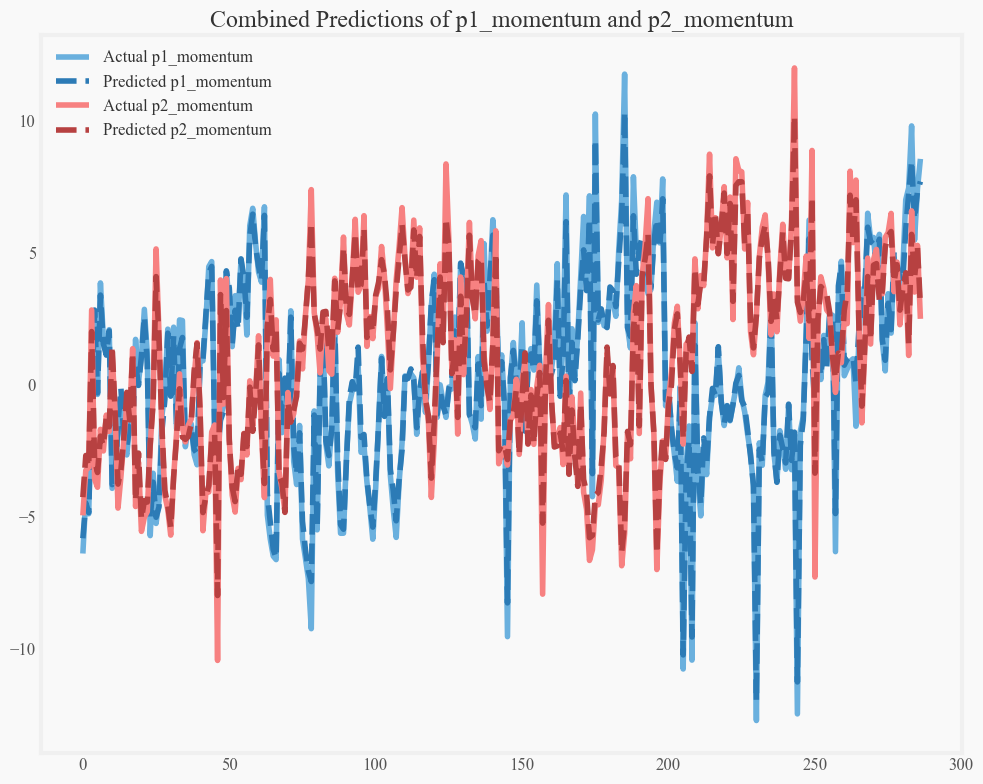

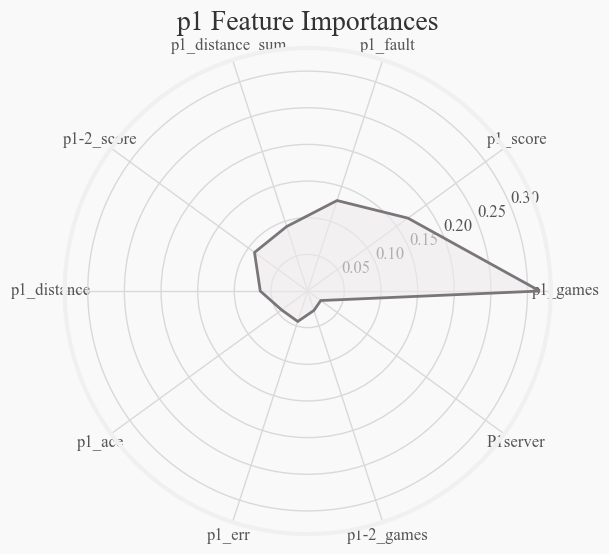

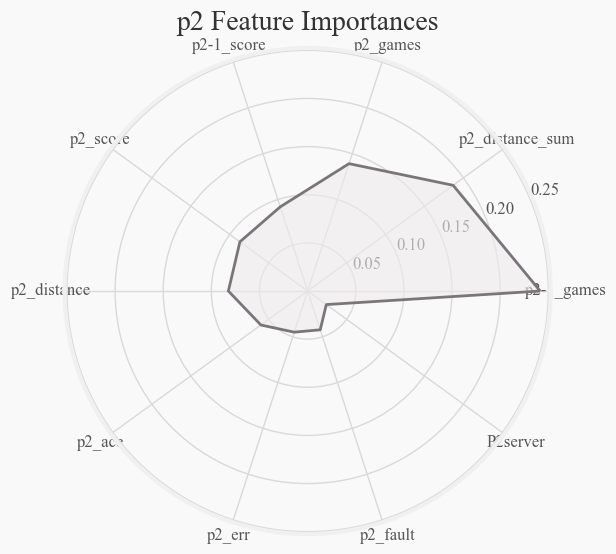

In [494]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 更新matplotlib配置以使用Times New Roman字体和淡雅风格
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 12,
    'axes.grid': False,  # 禁用网格
    'axes.facecolor': '#f9f9f9',  # 将背景色设置为浅灰色
    'figure.facecolor': '#f9f9f9',  # 设置图表背景色为浅灰色
    'xtick.color': '#555555',  # 调整刻度线颜色
    'ytick.color': '#555555',
    'text.color': '#333333',  # 文本颜色
    'grid.color': '#d9d9d9',  # 辅助网格线颜色（虽然已禁用）
})

def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)
    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data

features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

# 更新打印风格
print("Updated Evaluation Metrics:\n")
print(f"p1_model: R²={r2_p1:.2f}, RMSE={rmse_p1:.2f}, MAE={mae_p1:.2f}, MSE={mse_p1:.2f}, MAPE={mape_p1:.2f}%, SSE={sse_p1:.2f}, Explained Variance={explained_var_p1:.2f}")
print(f"p2_model: R²={r2_p2:.2f}, RMSE={rmse_p2:.2f}, MAE={mae_p2:.2f}, MSE={mse_p2:.2f}, MAPE={mape_p2:.2f}%, SSE={sse_p2:.2f}, Explained Variance={explained_var_p2:.2f}")

# 绘制合并的预测和实际值图（采用淡雅配色方案）
plt.figure(figsize=(10, 8))
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum', color='#6ab0de')
plt.plot(y_pred_p1, label='Predicted p1_momentum', linestyle='--', color='#2c7bb6')
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum', color='#f78181')
plt.plot(y_pred_p2, label='Predicted p2_momentum', linestyle='--', color='#b74141')
plt.title('Combined Predictions of p1_momentum and p2_momentum', color='#333333')
plt.legend(fontsize=12, facecolor='#f9f9f9')

plt.tight_layout()
plt.show()

def plot_feature_importance(importances, features, title):
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    importances_df = importances_df.sort_values('importance', ascending=False)

    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, importances, color='#f0ebed', alpha=0.6)
    ax.plot(angles, importances, color='#7a757a', linewidth=2, linestyle='solid')
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'], color='#555555')
    plt.title(title, size=20, color='#333333')
    plt.show()

# 绘制特征重要性
plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')

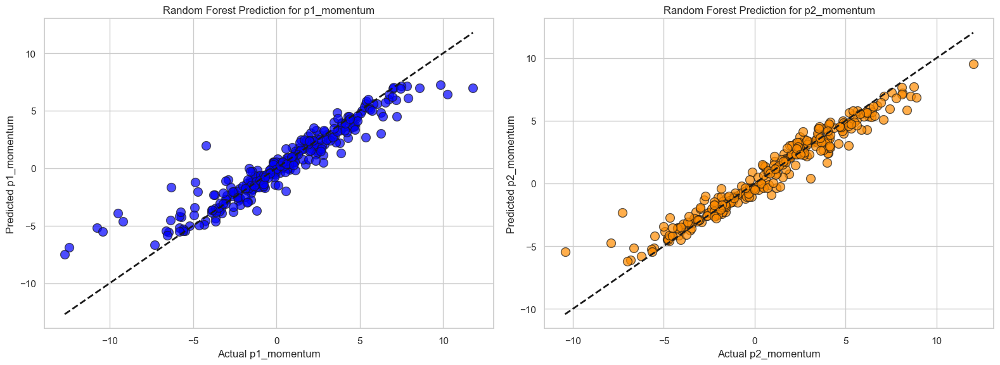

In [400]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
import numpy as np

# 假定df已经载入

# 选择match_id为1301的数据
match_data = df[df['match_id'] == 1301]
df = match_data 

# 定义特征和目标变量
features_p1 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']
features_p2 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']

target_p1 = ['p1_momentum']
target_p2 = ['p2_momentum']

X_p1 = match_data[features_p1]
X_p2 = match_data[features_p2]
y_p1 = match_data[target_p1].squeeze()
y_p2 = match_data[target_p2].squeeze()

# 网格搜索参数设置
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 使用r2_score作为评分标准
scorer = make_scorer(r2_score)

# 创建并训练随机森林回归器（带网格搜索）
rf_p1 = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, scoring=scorer, cv=5)
rf_p2 = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, scoring=scorer, cv=5)

rf_p1.fit(X_p1, y_p1)
rf_p2.fit(X_p2, y_p2)

# 绘制预测拟合图，同时增加美观度和字体大小
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# 设置全局字体大小
plt.rcParams.update({'font.size': 14})

# p1_momentum
axs[0].scatter(y_p1, y_pred_p1, color='blue', edgecolor='k', alpha=0.7, s=100)  # 调整点的颜色、边界颜色、透明度和大小
axs[0].plot([min(y_p1), max(y_p1)], [min(y_p1), max(y_p1)], '--k', linewidth=2)  # 调整线的样式和粗度
axs[0].set_xlabel("Actual p1_momentum")
axs[0].set_ylabel("Predicted p1_momentum")
axs[0].set_title("Random Forest Prediction for p1_momentum")

# p2_momentum
axs[1].scatter(y_p2, y_pred_p2, color='darkorange', edgecolor='k', alpha=0.7, s=100)  # 同上
axs[1].plot([min(y_p2), max(y_p2)], [min(y_p2), max(y_p2)], '--k', linewidth=2)
axs[1].set_xlabel("Actual p2_momentum")
axs[1].set_ylabel("Predicted p2_momentum")
axs[1].set_title("Random Forest Prediction for p2_momentum")

plt.tight_layout()
plt.show()


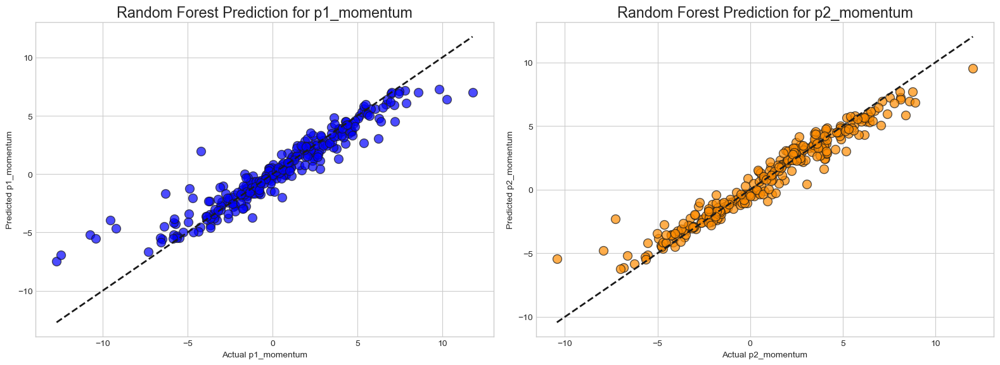

In [486]:
# 获取最优参数和模型，并基于最优模型进行预测
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 预测
y_pred_p1 = best_rf_p1.predict(X_p1)
y_pred_p2 = best_rf_p2.predict(X_p2)

# 现在可以绘制预测图形
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

plt.rcParams.update({'font.size': 14})

# p1_momentum
axs[0].scatter(y_p1, y_pred_p1, color='blue', edgecolor='k', alpha=0.7, s=100)
axs[0].plot([min(y_p1), max(y_p1)], [min(y_p1), max(y_p1)], '--k', linewidth=2)
axs[0].set_xlabel("Actual p1_momentum")
axs[0].set_ylabel("Predicted p1_momentum")
axs[0].set_title("Random Forest Prediction for p1_momentum")

# p2_momentum
axs[1].scatter(y_p2, y_pred_p2, color='darkorange', edgecolor='k', alpha=0.7, s=100)
axs[1].plot([min(y_p2), max(y_p2)], [min(y_p2), max(y_p2)], '--k', linewidth=2)
axs[1].set_xlabel("Actual p2_momentum")
axs[1].set_ylabel("Predicted p2_momentum")
axs[1].set_title("Random Forest Prediction for p2_momentum")

plt.tight_layout()
plt.show()

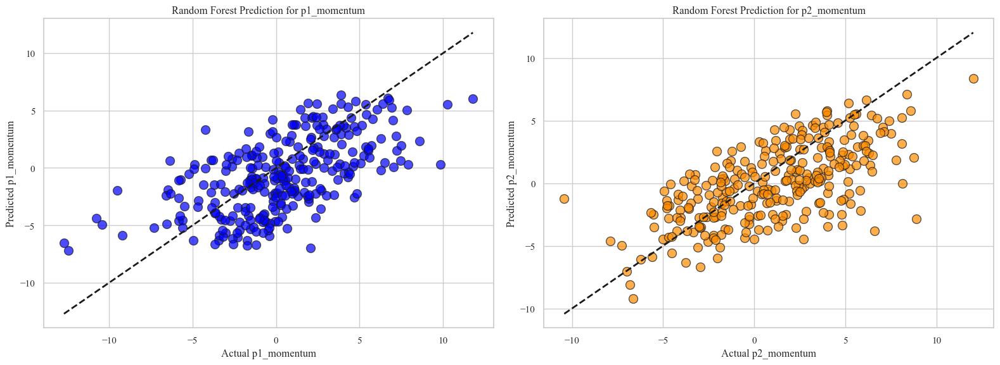

In [415]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
import numpy as np

# 假定df已经载入
df = pd.read_csv('dff.csv')

# 选择match_id为1301的数据
match_data = df[df['match_id'] == 1301]
df = match_data 

# 定义特征和目标变量
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']
features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']

target_p1 = ['p1_momentum']
target_p2 = ['p2_momentum']

X_p1 = match_data[features_p1]
X_p2 = match_data[features_p2]
y_p1 = match_data[target_p1].squeeze()
y_p2 = match_data[target_p2].squeeze()

# 网格搜索参数设置
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 使用r2_score作为评分标准
scorer = make_scorer(r2_score)

# 创建并训练随机森林回归器（带网格搜索）
rf_p1 = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, scoring=scorer, cv=5)
rf_p2 = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, scoring=scorer, cv=5)

rf_p1.fit(X_p1, y_p1)
rf_p2.fit(X_p2, y_p2)

# 绘制预测拟合图，同时增加美观度和字体大小
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# 设置全局字体大小
plt.rcParams.update({'font.size': 14})

# p1_momentum
axs[0].scatter(y_p1, y_pred_p1, color='blue', edgecolor='k', alpha=0.7, s=100)  # 调整点的颜色、边界颜色、透明度和大小
axs[0].plot([min(y_p1), max(y_p1)], [min(y_p1), max(y_p1)], '--k', linewidth=2)  # 调整线的样式和粗度
axs[0].set_xlabel("Actual p1_momentum")
axs[0].set_ylabel("Predicted p1_momentum")
axs[0].set_title("Random Forest Prediction for p1_momentum")

# p2_momentum
axs[1].scatter(y_p2, y_pred_p2, color='darkorange', edgecolor='k', alpha=0.7, s=100)  # 同上
axs[1].plot([min(y_p2), max(y_p2)], [min(y_p2), max(y_p2)], '--k', linewidth=2)
axs[1].set_xlabel("Actual p2_momentum")
axs[1].set_ylabel("Predicted p2_momentum")
axs[1].set_title("Random Forest Prediction for p2_momentum")

plt.tight_layout()
plt.show()


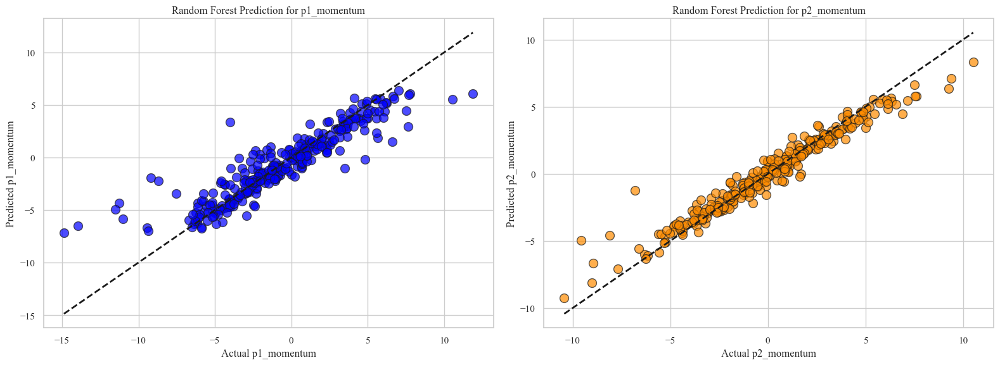

In [414]:
# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2
rf_p1.fit(X_p1, y_p1)
rf_p2.fit(X_p2, y_p2)

# 绘制预测拟合图，同时增加美观度和字体大小
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
# 设置全局字体为Times New Roman（请确保提供的路径有效）
times_new_roman_font = FontProperties(fname="path/to/Times_New_Roman.ttf")
plt.rcParams['font.family'] = ['Times New Roman']  # 或者使用 'serif' 类型以尝试系统自带的类似字体
# 设置全局字体大小
plt.rcParams.update({'font.size': 14})

# p1_momentum
axs[0].scatter(y_p1, y_pred_p1, color='blue', edgecolor='k', alpha=0.7, s=100)  # 调整点的颜色、边界颜色、透明度和大小
axs[0].plot([min(y_p1), max(y_p1)], [min(y_p1), max(y_p1)], '--k', linewidth=2)  # 调整线的样式和粗度
axs[0].set_xlabel("Actual p1_momentum")
axs[0].set_ylabel("Predicted p1_momentum")
axs[0].set_title("Random Forest Prediction for p1_momentum")

# p2_momentum
axs[1].scatter(y_p2, y_pred_p2, color='darkorange', edgecolor='k', alpha=0.7, s=100)  # 同上
axs[1].plot([min(y_p2), max(y_p2)], [min(y_p2), max(y_p2)], '--k', linewidth=2)
axs[1].set_xlabel("Actual p2_momentum")
axs[1].set_ylabel("Predicted p2_momentum")
axs[1].set_title("Random Forest Prediction for p2_momentum")

plt.tight_layout()
plt.show()


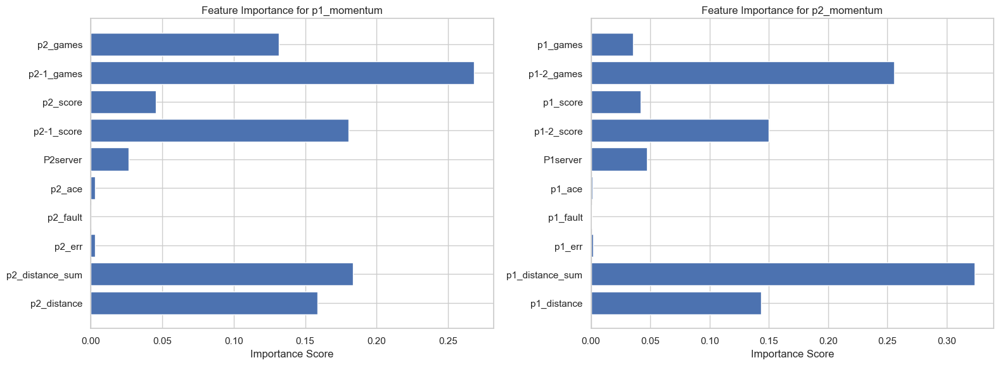

In [407]:
# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2

# 将特征重要性排序并绘制条形图
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

axs[0].barh(feature_names_p1, feature_importances_p1)
axs[0].set_title("Feature Importance for p1_momentum")
axs[0].set_xlabel("Importance Score")
axs[0].invert_yaxis()  # 翻转y轴，使特征名从上到下排列

axs[1].barh(feature_names_p2, feature_importances_p2)
axs[1].set_title("Feature Importance for p2_momentum")
axs[1].set_xlabel("Importance Score")
axs[1].invert_yaxis()

plt.tight_layout()
plt.show()

# 注意：此处假设y_pred_p1和y_pred_p2已经计算过，如果尚未计算，需要先预测
y_pred_p1 = best_rf_p1.predict(X_p1)
y_pred_p2 = best_rf_p2.predict(X_p2)

# 继续执行您之前的绘图代码（显示预测结果散点图）
# ...

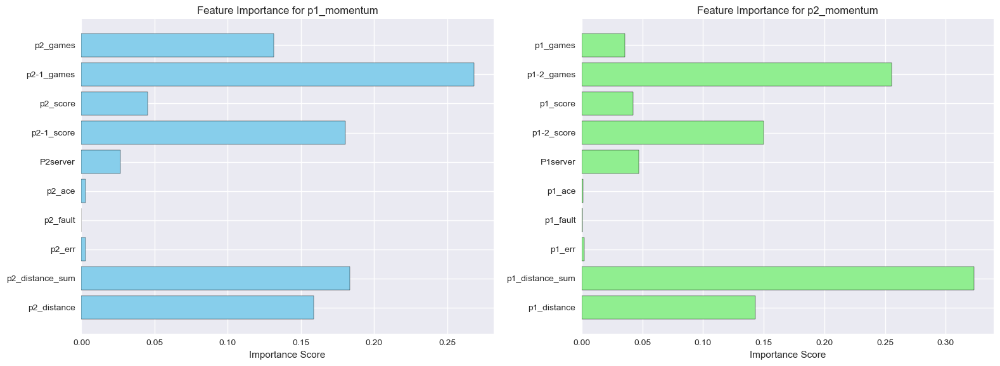

In [416]:
import matplotlib.pyplot as plt

# 设置绘图风格为seaborn，以获得更加美观、淡雅的图表
plt.style.use('seaborn')

# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2

# 将特征重要性排序并绘制条形图
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# p1特征重要性条形图
axs[0].barh(feature_names_p1, feature_importances_p1, color='skyblue', edgecolor='black')
axs[0].set_title("Feature Importance for p1_momentum")
axs[0].set_xlabel("Importance Score")
axs[0].invert_yaxis()  # 翻转y轴，使特征名从上到下排列

# p2特征重要性条形图
axs[1].barh(feature_names_p2, feature_importances_p2, color='lightgreen', edgecolor='black')
axs[1].set_title("Feature Importance for p2_momentum")
axs[1].set_xlabel("Importance Score")
axs[1].invert_yaxis()

plt.tight_layout()
plt.show()

# 注意：此处假设y_pred_p1和y_pred_p2已经计算过，如果尚未计算，需要先预测
y_pred_p1 = best_rf_p1.predict(X_p1)
y_pred_p2 = best_rf_p2.predict(X_p2)

# 继续执行您之前的绘图代码（显示预测结果散点图）
# ...


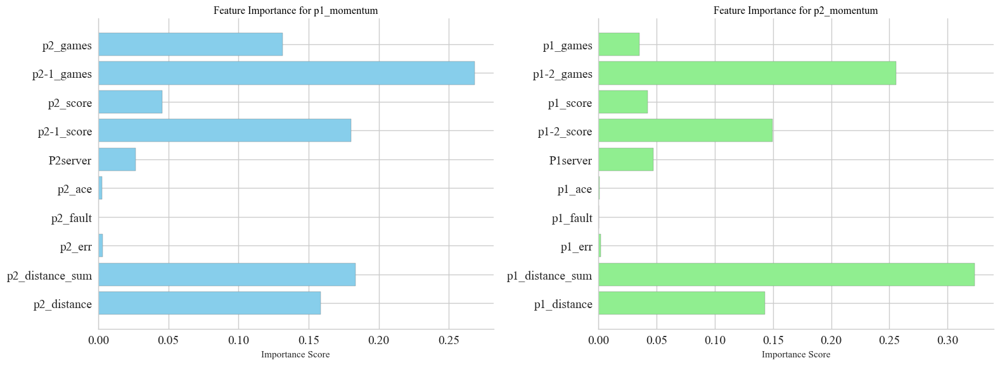

In [418]:
import matplotlib.pyplot as plt
import seaborn as sns

# 设置全局样式为seaborn-whitegrid，同时设置字体和背景色
plt.style.use(['seaborn-whitegrid', {
    'font.family': 'Times New Roman',
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'text.color': 'black',
}])

# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2

# 将特征重要性排序并绘制条形图
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# p1特征重要性条形图
axs[0].barh(feature_names_p1, feature_importances_p1, color='skyblue', edgecolor='grey')
axs[0].set_title("Feature Importance for p1_momentum")
axs[0].set_xlabel("Importance Score", fontname="Times New Roman")
axs[0].invert_yaxis()  

# p2特征重要性条形图
axs[1].barh(feature_names_p2, feature_importances_p2, color='lightgreen', edgecolor='grey')
axs[1].set_title("Feature Importance for p2_momentum")
axs[1].set_xlabel("Importance Score", fontname="Times New Roman")
axs[1].invert_yaxis()

# 美化图表：去除顶部和右部边框、增加间距
for ax in axs:
    ax.tick_params(labelsize=14)  # 设置刻度标签大小
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

# 注意：此处假设y_pred_p1和y_pred_p2已经计算过，如果尚未计算，需要先预测
y_pred_p1 = best_rf_p1.predict(X_p1)
y_pred_p2 = best_rf_p2.predict(X_p2)

# 继续执行您之前的绘图代码（显示预测结果散点图），记得将字体设置为Times New Roman

Updated Evaluation Metrics:

p1_model: R²=0.99, RMSE=0.46, MAE=0.33, MSE=0.21, MAPE=52.64%, SSE=61.22, Explained Variance=0.99
p2_model: R²=0.98, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=27.57%, SSE=87.13, Explained Variance=0.98


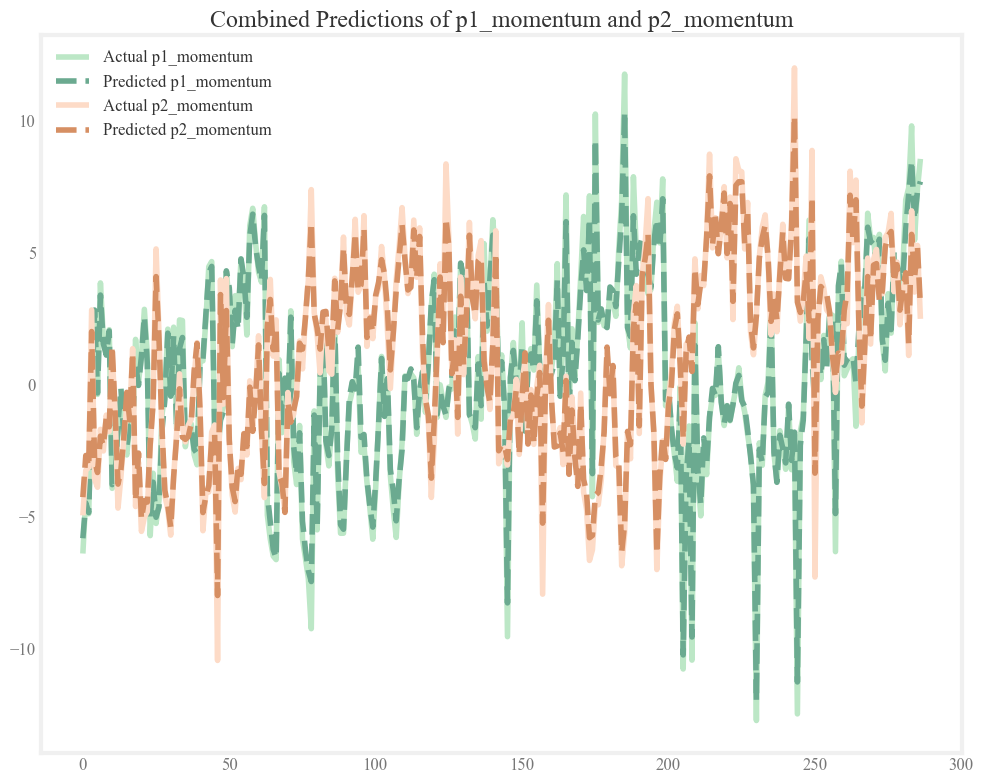

AttributeError: 'Text' object has no property 'linewidth'

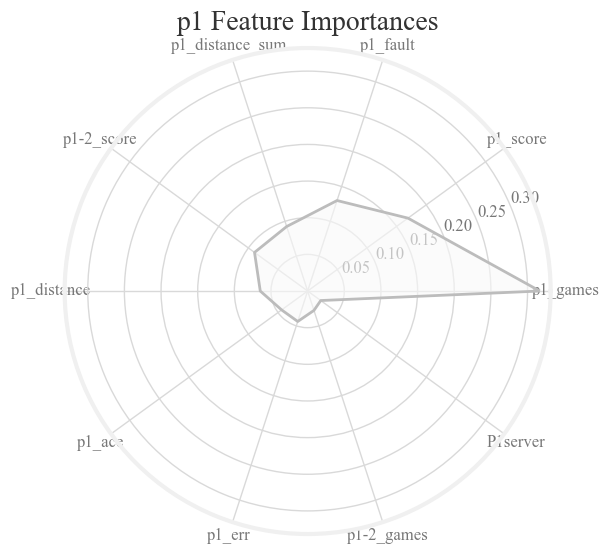

In [500]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 更新matplotlib配置以使用Times New Roman字体、米白色背景和淡雅风格
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 12,
    'axes.grid': False,  # 禁用网格
    'axes.facecolor': 'white',  # 将背景色设置为米白色
    'figure.facecolor': 'white',  # 设置图表背景色为米白色
    'xtick.color': '#777777',  # 调整刻度线颜色
    'ytick.color': '#777777',
    'text.color': '#333333',  # 文本颜色
    'grid.color': '#d9d9d9',  # 辅助网格线颜色（虽然已禁用）
})

def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)
    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data

features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

# 更新打印风格
print("Updated Evaluation Metrics:\n")
print(f"p1_model: R²={r2_p1:.2f}, RMSE={rmse_p1:.2f}, MAE={mae_p1:.2f}, MSE={mse_p1:.2f}, MAPE={mape_p1:.2f}%, SSE={sse_p1:.2f}, Explained Variance={explained_var_p1:.2f}")
print(f"p2_model: R²={r2_p2:.2f}, RMSE={rmse_p2:.2f}, MAE={mae_p2:.2f}, MSE={mse_p2:.2f}, MAPE={mape_p2:.2f}%, SSE={sse_p2:.2f}, Explained Variance={explained_var_p2:.2f}")

# 绘制合并的预测和实际值图（采用淡雅配色方案）
plt.figure(figsize=(10, 8))
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum', color='#bce7c6')
plt.plot(y_pred_p1, label='Predicted p1_momentum', linestyle='--', color='#6baa90')
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum', color='#fddbc7')
plt.plot(y_pred_p2, label='Predicted p2_momentum', linestyle='--', color='#d68f63')
plt.title('Combined Predictions of p1_momentum and p2_momentum', color='#333333')
plt.legend(fontsize=12, facecolor='#f5f5dc')

plt.tight_layout()
plt.show()

def plot_feature_importance(importances, features, title):
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    importances_df = importances_df.sort_values('importance', ascending=False)

    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ax.fill(angles, importances, color='#f9f9f9', alpha=0.6)
    ax.plot(angles, importances, color='#bcbcbc', linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'], color='#777777')
    plt.title(title, size=20, color='#333333',linewidth=2, linestyle='solid')
    plt.gca().set_facecolor('white')  # 设置极坐标图背景色为米白色
    plt.show()
 
# 绘制特征重要性
plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')

Updated Evaluation Metrics:

p1_model: R²=0.99, RMSE=0.50, MAE=0.34, MSE=0.25, MAPE=29.87%, SSE=79.82, Explained Variance=0.99
p2_model: R²=0.97, RMSE=0.55, MAE=0.36, MSE=0.30, MAPE=35.82%, SSE=97.31, Explained Variance=0.97


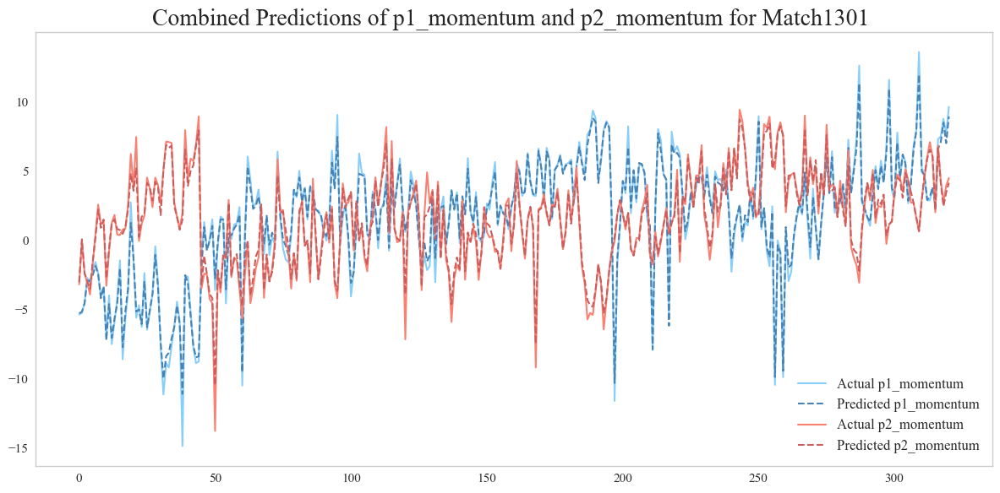

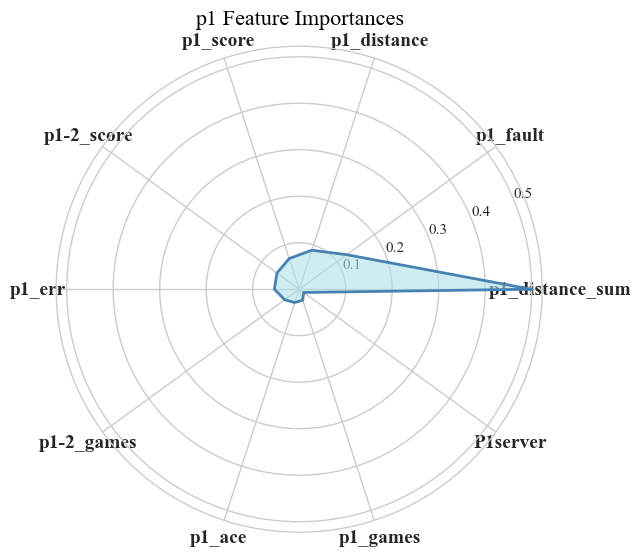

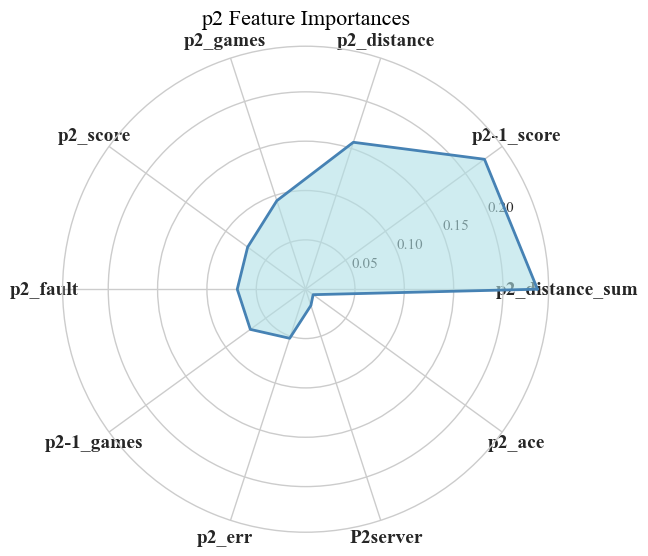

In [683]:
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
import matplotlib.pyplot as plt
from math import sqrt

# 更新matplotlib配置以使用Times New Roman，同时适应淡雅风格要求
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 12,
    'axes.grid': False,  # 禁用网格
    'axes.facecolor': 'white',  # 将背景色设置为白色
    'figure.facecolor': 'white'  # Canvas color
})

def train_evaluate_model(X, y, param_grid, cv=5):
    model = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    mape = np.mean(np.abs((y - y_pred) / y)) * 100
    sse = np.sum((y - y_pred)**2)
    explained_var = explained_variance_score(y, y_pred)
    return model, y_pred, r2, rmse, mae, mse, mape, sse, explained_var, model.best_estimator_.feature_importances_

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1701]
df = match_data

features_p1 = ['p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
features_p2 = ['p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

X_p1 = df[features_p1]
y_p1 = df['p1_momentum']
X_p2 = df[features_p2]
y_p2 = df['p2_momentum']

model_p1, y_pred_p1, r2_p1, rmse_p1, mae_p1, mse_p1, mape_p1, sse_p1, explained_var_p1, importances_p1 = train_evaluate_model(X_p1, y_p1, param_grid)
model_p2, y_pred_p2, r2_p2, rmse_p2, mae_p2, mse_p2, mape_p2, sse_p2, explained_var_p2, importances_p2 = train_evaluate_model(X_p2, y_p2, param_grid)

# 更新打印风格
print("Updated Evaluation Metrics:\n")
print(f"p1_model: R²={r2_p1:.2f}, RMSE={rmse_p1:.2f}, MAE={mae_p1:.2f}, MSE={mse_p1:.2f}, MAPE={mape_p1:.2f}%, SSE={sse_p1:.2f}, Explained Variance={explained_var_p1:.2f}")
print(f"p2_model: R²={r2_p2:.2f}, RMSE={rmse_p2:.2f}, MAE={mae_p2:.2f}, MSE={mse_p2:.2f}, MAPE={mape_p2:.2f}%, SSE={sse_p2:.2f}, Explained Variance={explained_var_p2:.2f}")

# 绘制合并的预测和实际值图
plt.figure(figsize=(12, 6))
# 使用更柔和的颜色
plt.plot(y_p1.reset_index(drop=True), label='Actual p1_momentum', color='#87CEFA')  # Sky Blue
plt.plot(y_pred_p1, label='Predicted p1_momentum', linestyle='--', color='#4682B4')  # Steel Blue
plt.plot(y_p2.reset_index(drop=True), label='Actual p2_momentum', color='#FA8072')  # Salmon
plt.plot(y_pred_p2, label='Predicted p2_momentum', linestyle='--', color='#CD5C5C')  # Indian Red
plt.title('Combined Predictions of p1_momentum and p2_momentum for Match1301 ',fontsize=20)
plt.legend()

plt.tight_layout()
plt.show()

def plot_feature_importance(importances, features, title):
    importances_df = pd.DataFrame({'feature': features, 'importance': importances})
    importances_df = importances_df.sort_values('importance', ascending=False)

    angles = np.linspace(0, 2 * np.pi, len(features), endpoint=False).tolist()
    angles += angles[:1]
    importances = list(importances_df['importance'])
    importances += importances[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    # 更淡雅的颜色设置
    ax.fill(angles, importances, color='#B0E0E6', alpha=0.6)  # Powder Blue
    ax.plot(angles, importances, color='#4682B4', linewidth=2)  # Steel Blue
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(importances_df['feature'], fontsize=14, weight='bold')
    plt.title(title, size=16, color='black')
    plt.show()


# 绘制特征重要性
plot_feature_importance(importances_p1, features_p1, 'p1 Feature Importances')
plot_feature_importance(importances_p2, features_p2, 'p2 Feature Importances')


In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

# 确保这段代码与您的环境兼容，可能需要根据您的系统安装PyTorch
# PyTorch LSTM模型定义
class LSTMPredictor(nn.Module):
    def __init__(self, input_dim, hidden_layer_size, output_dim=1, num_layers=1):
        super(LSTMPredictor, self).__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_dim, hidden_layer_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_layer_size, output_dim)

    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq)
        predictions = self.linear(lstm_out)
        return predictions[:, -1]

def prepare_data(series, n_steps):
    X, y = [], []
    for i in range(len(series)):
        end_ix = i + n_steps
        if end_ix > len(series)-1:
            break
        seq_x, seq_y = series[i:end_ix], series[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# 载入数据
df = pd.read_csv('dff.csv')
match_data = df[df['match_id'] == 1301]

# 选择一个序列进行变点检测
series = match_data['p1_momentum'].values
n_steps = 5
X, y = prepare_data(series, n_steps)
X = X.reshape((X.shape[0], X.shape[1], 1))

# 转换为PyTorch张量
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# 数据加载器
train_data = TensorDataset(X_tensor, y_tensor)
train_loader = DataLoader(train_data, shuffle=False, batch_size=16)

# 模型参数
input_dim = 1
hidden_layer_size = 50
output_dim = 1
num_layers = 1

# 初始化模型
model = LSTMPredictor(input_dim, hidden_layer_size, output_dim, num_layers)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# 训练模型
epochs = 100

for i in range(epochs):
    for seq, labels in train_loader:
        optimizer.zero_grad()
        y_pred = model(seq)
        single_loss = loss_function(y_pred, labels)
        single_loss.backward()
        optimizer.step()

    if i%25 == 0:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

print(f'epoch: {i:3} final loss: {single_loss.item():10.10f}')

# 使用训练好的模型对全序列进行预测
model.eval()
with torch.no_grad():
    predictions = model(X_tensor)
    loss = loss_function(predictions, y_tensor)

# 差异表示预测误差
differences = torch.abs(predictions - y_tensor).view(-1).numpy()

# 基于某一阈值识别变点
threshold = differences.mean() + differences.std()  # 简单的阈值：均值加一标准差
change_points = np.where(differences > threshold)[0]

plt.figure(figsize=(14, 6))
plt.plot(series, label='Momentum')
plt.scatter(change_points, series[change_points], color='red', label='Change Point', zorder=5)
plt.legend()
plt.title("Momentum and Identified Change Points")
plt.show()


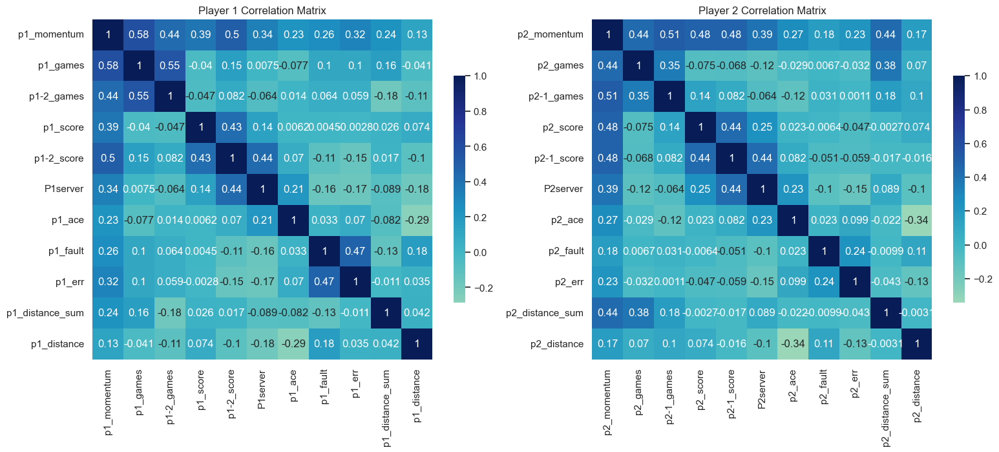

In [528]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 假设你有一个名为df的DataFrame，其中包含了所有相关的列
# df = pd.DataFrame({
#     'p1_momentum': [...],
#     'p1_games': [...],
#     # 其他列...
#     'p2_momentum': [...],
#     'p2_games': [...],
#     # 其他列...
# })

# 对于选手1的相关性计算
p1_correlations = df[['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace',
                      'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']].corr(method='spearman')

# 对于选手2的相关性计算
p2_correlations = df[['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace',
                      'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']].corr(method='spearman')

# 创建一个网格布局以放置两个热力图，并设置整体样式为 seaborn 的 "whitegrid" 主题
sns.set(style="whitegrid")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# 绘制选手1的相关性热力图，使用淡雅的颜色映射方案
sns.heatmap(p1_correlations, annot=True, cmap="YlGnBu", center=0, square=True,  cbar_kws={"shrink": .5}, ax=ax1)
ax1.set_title('Player 1 Correlation Matrix')

# 绘制选手2的相关性热力图，同样使用淡雅的颜色映射方案
sns.heatmap(p2_correlations, annot=True, cmap="YlGnBu", center=0, square=True, cbar_kws={"shrink": .5}, ax=ax2)
ax2.set_title('Player 2 Correlation Matrix')

plt.tight_layout()
plt.show()

In [ ]:
# 绘制雷达图
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, polar=True)

# 确保角度数与特征数量一致
num_features = len(importances)
angles = np.linspace(0, 2*np.pi, num_features, endpoint=False)
importance_values = list(importances['Importance'].values)

# 绘制填充区域和线条
ax.fill(angles, importance_values, color='skyblue', alpha=0.25)
ax.plot(angles, importance_values, linewidth=1, linestyle='solid')

# 设置标签
ax.set_thetagrids(angles * 180 / np.pi, labels=importances['Feature'], fontsize=8, weight='bold')
ax.tick_params(labelsize=12)

# 设置标题和轴标签
ax.set_title('Feature Importances in Random Forest Model', va='bottom')
ax.set_rlabel_position(90)  # Move radial labels away from plotted area

plt.tight_layout()
plt.show()

In [517]:
import pandas as pd
from scipy import stats

# 假设df是你的数据集DataFrame
# df = pd.read_csv('your_dataset.csv') # 如果有数据文件

# 定义要检验的列名列表
p1_columns = ['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
p2_columns = ['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

# 定义一个函数来执行Anderson-Darling测试并打印结果
def anderson_darling_test(series, col_name):
    result = stats.anderson(series, dist='norm')
    print(f"Anderson-Darling test for {col_name}:\nStatistic: {result.statistic}, significance levels: {result.significance_level}, critical values: {result.critical_values}\n")

# 对p1相关列进行测试
print("p1相关列的正态性检验结果：")
for col in p1_columns:
    anderson_darling_test(df[col], col)

# 对p2相关列进行测试
print("\np2相关列的正态性检验结果：")
for col in p2_columns:
    anderson_darling_test(df[col], col)


p1相关列的正态性检验结果：
Anderson-Darling test for p1_momentum:
Statistic: 4.304000440512027, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787 0.917 1.091]

Anderson-Darling test for p1_games:
Statistic: 168.77408971934165, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787 0.917 1.091]

Anderson-Darling test for p1-2_games:
Statistic: 171.2705829794795, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787 0.917 1.091]

Anderson-Darling test for p1_score:
Statistic: 354.4365868316172, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787 0.917 1.091]

Anderson-Darling test for p1-2_score:
Statistic: 151.14856051403422, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787 0.917 1.091]

Anderson-Darling test for P1server:
Statistic: 1247.2840028506125, significance levels: [15.  10.   5.   2.5  1. ], critical values: [0.576 0.656 0.787

In [518]:
import pandas as pd
from scipy import stats

# 假设 df 已经定义且包括了所有必要的列
# 定义列名列表
p1_columns = ['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
p2_columns = ['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

def anderson_darling_test(series, col_name):
    result = stats.anderson(series.dropna(), dist='norm')  # 使用 dropna() 去除NaN值
    print(f"Anderson-Darling test for {col_name}:\nStatistic: {result.statistic}")

    # 检查正态性，对每个显著性水平和临界值
    for i in range(len(result.significance_level)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < cv:
            print(f"At {sl}% Significance Level: Data looks normal (Statistic < Critical Value: {result.statistic} < {cv}).")
        else:
            print(f"At {sl}% significance level: Data does not look normal (Statistic >= Critical Value: {result.statistic} >= {cv}).")

# 对p1相关列进行测试
print("p1相关列的正态性检验结果：")
for col in p1_columns:
    anderson_darling_test(df[col], col)

# 对p2相关列进行测试
print("\np2相关列的正态性检验结果：")
for col in p2_columns:
    anderson_darling_test(df[col], col)


p1相关列的正态性检验结果：
Anderson-Darling test for p1_momentum:
Statistic: 4.304000440512027
At 15.0% significance level: Data does not look normal (Statistic >= Critical Value: 4.304000440512027 >= 0.576).
At 10.0% significance level: Data does not look normal (Statistic >= Critical Value: 4.304000440512027 >= 0.656).
At 5.0% significance level: Data does not look normal (Statistic >= Critical Value: 4.304000440512027 >= 0.787).
At 2.5% significance level: Data does not look normal (Statistic >= Critical Value: 4.304000440512027 >= 0.917).
At 1.0% significance level: Data does not look normal (Statistic >= Critical Value: 4.304000440512027 >= 1.091).
Anderson-Darling test for p1_games:
Statistic: 168.77408971934165
At 15.0% significance level: Data does not look normal (Statistic >= Critical Value: 168.77408971934165 >= 0.576).
At 10.0% significance level: Data does not look normal (Statistic >= Critical Value: 168.77408971934165 >= 0.656).
At 5.0% significance level: Data does not look normal 

In [519]:
from scipy import stats

# 假设 df 是你的Pandas DataFrame，并且已经定义好
# 假设你已经有一个列名列表，想要检测这些列的正态性

def anderson_darling_normality_test(series, col_name):
    result = stats.anderson(series.dropna(), dist='norm')
    print(f"Testing {col_name}:")
    print(f"Statistic: {result.statistic:.4f}")
    p_value = 0.05  # 设定显著性水平为5%
    # 在Anderson-Darling测试中，并非直接提供p值，而是提供与不同显著性水平对应的临界值
    critical_value_at_5 = result.critical_values[result.significance_level == 5][0]
    if result.statistic < critical_value_at_5:
        print(f"At 5% significance level: Data seems normal (Statistic < Critical value: {result.statistic:.4f} < {critical_value_at_5}).\n")
        return True
    else:
        print(f"At 5% significance level: Data does not seem normal (Statistic >= Critical Value: {result.statistic:.4f} >= {critical_value_at_5}).\n")
        return False

columns_to_test = ['your_column']  # 用你想要测试的列名替换 'your_column'
normality_results = {}

for col in columns_to_test:
    is_normal = anderson_darling_normality_test(df[col], col)
    normality_results[col] = "Normal" if is_normal else "Not Normal"

# 输出每列的正态性结果
for col, result in normality_results.items():
    print(f"{col}: {result}")

# 注意: 当数据量大时，即便微小的偏离也可能导致拒绝正态性假设，所以解释结果时需要综合考虑


KeyError: 'your_column'

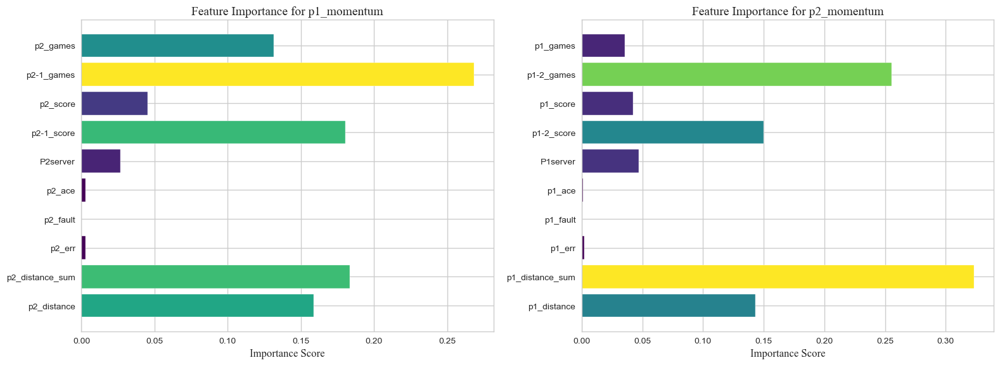

In [419]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# 设置绘图全局字体为 Times New Roman
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']

# 设置图表风格为白色背景
plt.style.use('seaborn-whitegrid') # seaborn-whitegrid 风格自带白色背景和网格线，适合美化图表

# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2

# 将特征重要性排序并绘制条形图
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# 为了更好的美观，也可以定义一个颜色序列
colors_p1 = plt.cm.viridis(feature_importances_p1 / max(feature_importances_p1))
colors_p2 = plt.cm.viridis(feature_importances_p2 / max(feature_importances_p2))

axs[0].barh(feature_names_p1, feature_importances_p1, color=colors_p1)
axs[0].set_title("Feature Importance for p1_momentum", fontsize=14, fontname='Times New Roman')
axs[0].set_xlabel("Importance Score", fontsize=12, fontname='Times New Roman')
axs[0].invert_yaxis()  # 翻转y轴，使特征名从上到下排列

axs[1].barh(feature_names_p2, feature_importances_p2, color=colors_p2)
axs[1].set_title("Feature Importance for p2_momentum", fontsize=14, fontname='Times New Roman')
axs[1].set_xlabel("Importance Score", fontsize=12, fontname='Times New Roman')
axs[1].invert_yaxis()

plt.tight_layout()
plt.show()


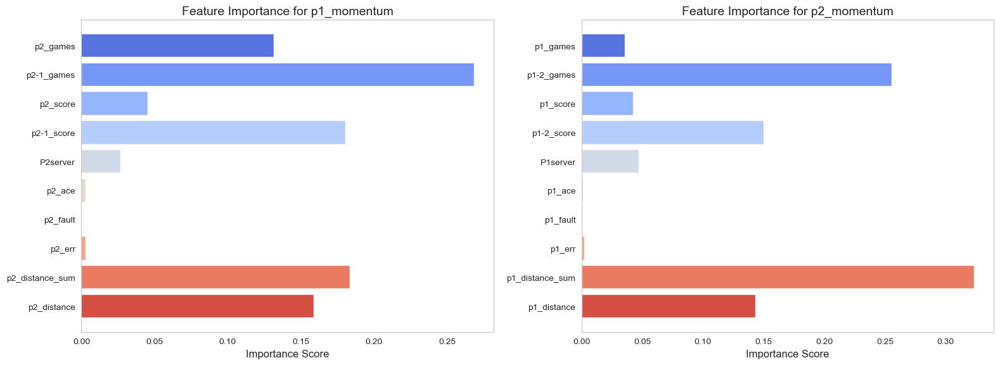

In [420]:
import matplotlib.pyplot as plt
import seaborn as sns

# 使用 seaborn 的 light 风格设置增强视觉效果
sns.set_style("whitegrid", {'axes.grid' : False})  # 使用白色网格风格，并关闭网格线使图表更淡雅

# 让我们假设您的 RandomForestClassifier 模型和特征名称列表("features_p1" 和 "features_p2")已经定义

# 获取最优参数及训练后的模型
best_rf_p1 = rf_p1.best_estimator_
best_rf_p2 = rf_p2.best_estimator_

# 计算特征重要性
feature_importances_p1 = best_rf_p1.feature_importances_
feature_importances_p2 = best_rf_p2.feature_importances_

# 提取特征名称
feature_names_p1 = features_p1
feature_names_p2 = features_p2

# 将特征重要性排序并绘制条形图
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# 选择色彩渐变
colors_p1 = sns.color_palette("coolwarm", len(feature_names_p1))
colors_p2 = sns.color_palette("coolwarm", len(feature_names_p2))

# 绘制特征重要性条形图
axs[0].barh(feature_names_p1, feature_importances_p1, color=colors_p1)
axs[0].set_title("Feature Importance for p1_momentum", fontsize=14)
axs[0].set_xlabel("Importance Score", fontsize=12)
axs[0].invert_yaxis()

axs[1].barh(feature_names_p2, feature_importances_p2, color=colors_p2)
axs[1].set_title("Feature Importance for p2_momentum", fontsize=14)
axs[1].set_xlabel("Importance Score", fontsize=12)
axs[1].invert_yaxis()

plt.tight_layout()
plt.show()


C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1158724993.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0


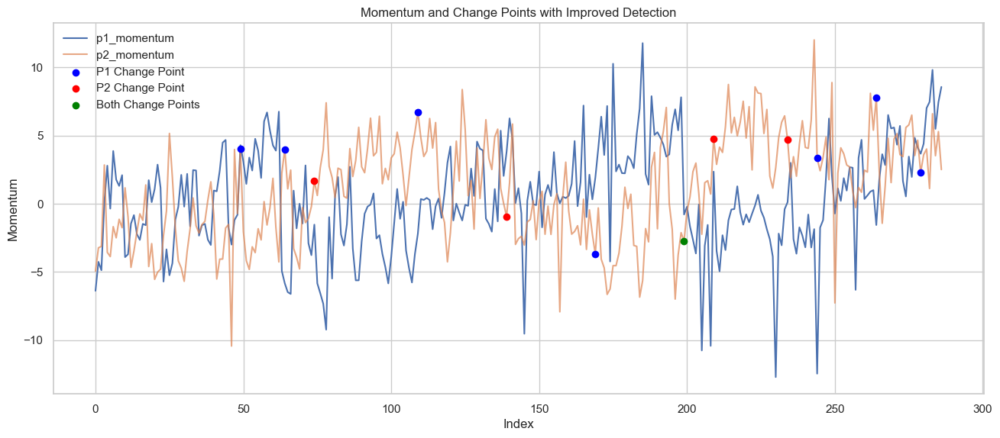

In [545]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt

# 假设df是您的DataFrame
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定的match_id，例如1301
match_data = df[df['match_id'] == 1301]

def detect_change_points(series, model="l2", pen=3):
    """
    检测给定序列中的变点。
    
    参数:
    - series: 序列数据，np.array格式。
    - model: 用于变点检测的模型。
    - pen: 惩罚参数，控制变点数量。
    """
    algo = rpt.Pelt(model=model, min_size=1).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]

# 尝试不同的成本函数和调整惩罚参数
p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy(), model="rbf", pen=2)
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy(), model="rbf", pen=2)

match_data['change_point'] = 0

for index in p1_cp:
    match_data.iloc[index-1, match_data.columns.get_loc('change_point')] = 1
for index in p2_cp:
    if match_data.iloc[index-1, match_data.columns.get_loc('change_point')] == 1:
        match_data.iloc[index-1, match_data.columns.get_loc('change_point')] = 3
    else:
        match_data.iloc[index-1, match_data.columns.get_loc('change_point')] = 2

plt.figure(figsize=(14, 6))
plt.plot(match_data.index, match_data['p1_momentum'], label='p1_momentum')
plt.plot(match_data.index, match_data['p2_momentum'], label='p2_momentum', alpha=0.7)

for cp_type, color, label in zip([1, 2, 3], ['blue', 'red', 'green'], ['P1 Change Point', 'P2 Change Point', 'Both Change Points']):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        plt.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label, zorder=5)

plt.legend()
plt.title("Momentum and Change Points with Improved Detection")
plt.xlabel("Index")
plt.ylabel("Momentum")
plt.show()


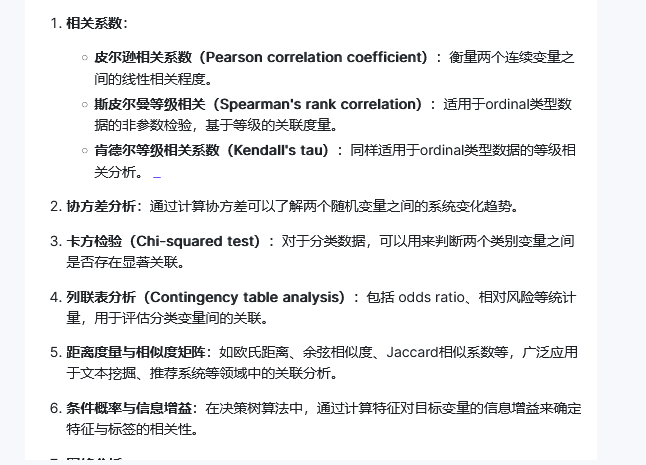

In [40]:
from sklearn.model_selection import train_test_split

# 定义特征和目标变量
X = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault', 'P1_distance_run', 'p1_performance']]  # 特征
y = data['point_victor']  # 目标变量

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.ensemble import RandomForestClassifier

# 初始化随机森林分类器
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# 训练模型
clf.fit(X_train, y_train)
# 获取特征重要性
feature_importances = clf.feature_importances_

# 打印每个特征的重要性
features = X.columns
importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

print("Feature Importances:\n")
print(importances)
from sklearn.metrics import accuracy_score

# 预测测试集
y_pred = clf.predict(X_test)

# 计算并打印精度
print("Accuracy on test set: ", accuracy_score(y_test, y_pred))


Feature Importances:

p1_performance     0.419170
P1_distance_run    0.415311
P1_serve           0.074475
P1_scoreAD         0.041291
P1_score           0.025696
P1_ace             0.016554
P1_double_fault    0.007503
dtype: float64
Accuracy on test set:  0.5857348703170029


In [41]:
from sklearn.model_selection import train_test_split

# 定义特征和目标变量
X = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault',  'p1_performance']]  # 特征
y = data['point_victor']  # 目标变量

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.ensemble import RandomForestClassifier

# 初始化随机森林分类器
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# 训练模型
clf.fit(X_train, y_train)
# 获取特征重要性
feature_importances = clf.feature_importances_

# 打印每个特征的重要性
features = X.columns
importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

print("Feature Importances:\n")
print(importances)
from sklearn.metrics import accuracy_score

# 预测测试集
y_pred = clf.predict(X_test)

# 计算并打印精度
print("Accuracy on test set: ", accuracy_score(y_test, y_pred))

Feature Importances:

p1_performance     0.833955
P1_serve           0.073991
P1_scoreAD         0.040811
P1_score           0.024855
P1_ace             0.020152
P1_double_fault    0.006238
dtype: float64
Accuracy on test set:  0.5835734870317003


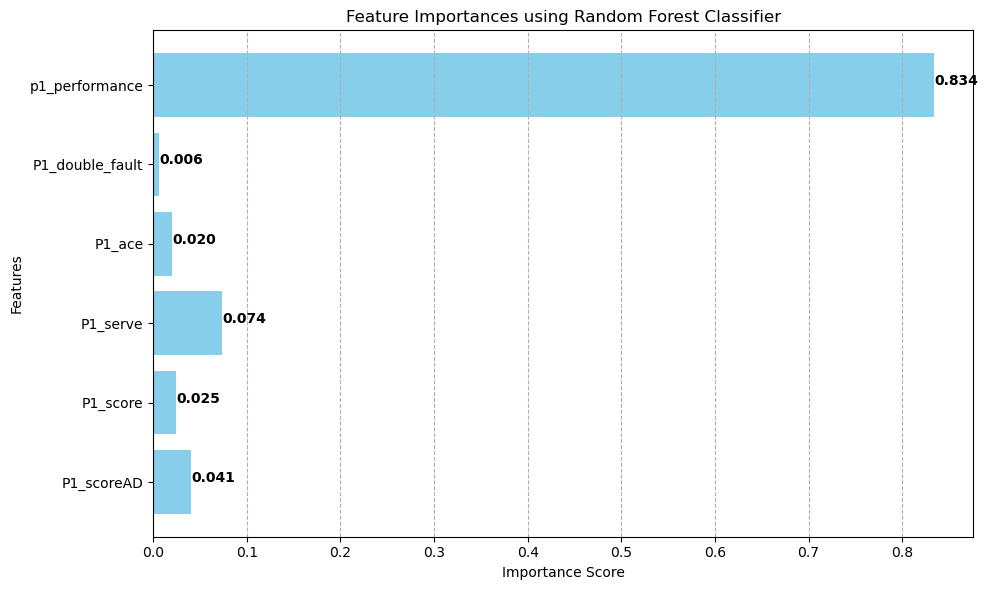

In [42]:
import matplotlib.pyplot as plt

# 将特征重要性转换为DataFrame以方便绘图
importances_df = pd.DataFrame({'Features': features, 'Importance': feature_importances})

# 绘制特征重要性条形图
plt.figure(figsize=(10, 6))
plt.barh(importances_df['Features'], importances_df['Importance'], color='skyblue')
plt.title('Feature Importances using Random Forest Classifier')
plt.xlabel('Importance Score')
plt.ylabel('Features')

# 添加数值标签到每个柱子上
for i, v in enumerate(importances_df['Importance']):
    plt.text(v, i, f'{v:.3f}', color='black', fontweight='bold')

plt.grid(axis='x', linestyle='--')
plt.tight_layout()
plt.show()

In [43]:
from sklearn.model_selection import train_test_split

# 定义特征和目标变量
X = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault']]  # 特征
y = data['point_victor']  # 目标变量

# 分割数据为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.ensemble import RandomForestClassifier

# 初始化随机森林分类器
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# 训练模型
clf.fit(X_train, y_train)
# 获取特征重要性
feature_importances = clf.feature_importances_

# 打印每个特征的重要性
features = X.columns
importances = pd.Series(feature_importances, index=features).sort_values(ascending=False)

print("Feature Importances:\n")
print(importances)
from sklearn.metrics import accuracy_score

# 预测测试集
y_pred = clf.predict(X_test)

# 计算并打印精度
print("Accuracy on test set: ", accuracy_score(y_test, y_pred))

Feature Importances:

P1_serve           0.629021
P1_ace             0.137189
P1_scoreAD         0.133479
P1_double_fault    0.052502
P1_score           0.047808
dtype: float64
Accuracy on test set:  0.654178674351585


In [44]:
from xgboost import XGBClassifier

# 训练模型
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_clf.fit(X_train, y_train)

# 评估模型
y_pred = xgb_clf.predict(X_test)
print("XGBoost Accuracy: ", accuracy_score(y_test, y_pred))


XGBoost Accuracy:  0.6505763688760807


D:\Compiler_Environment\Python\Anconda\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


In [45]:
from lightgbm import LGBMClassifier

# 训练模型
lgb_clf = LGBMClassifier()
lgb_clf.fit(X_train, y_train)

# 评估模型
y_pred = lgb_clf.predict(X_test)
print("LightGBM Accuracy: ", accuracy_score(y_test, y_pred))


[LightGBM] [Info] Number of positive: 2854, number of negative: 2698
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27
[LightGBM] [Info] Number of data points in the train set: 5552, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.514049 -> initscore=0.056211
[LightGBM] [Info] Start training from score 0.056211
LightGBM Accuracy:  0.6527377521613833


In [46]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score
import pandas as pd

# 假定数据和标签已经定义
# X = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault', 'P1_distance_run']]
# y = data['point_victor']
# 分割数据集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 标准化数据
scaler = StandardScaler()

# PCA降维
pca = PCA(n_components=0.95)  # 保留95%的方差

# 定义模型
svm_clf = SVC(random_state=42)
mlp_clf = MLPClassifier(random_state=42)
rf_clf = RandomForestClassifier(random_state=42)

# 创建管道
svm_pipeline = make_pipeline(scaler, pca, svm_clf)
mlp_pipeline = make_pipeline(scaler, pca, mlp_clf)
rf_pipeline = make_pipeline(scaler, rf_clf)  # 随机森林不需要PCA降维

# 模型训练和评估
models = {'SVM': svm_pipeline, 'MLP': mlp_pipeline, 'RandomForest': rf_pipeline}
scores = {}
for model_name, model_pipeline in models.items():
    model_pipeline.fit(X_train, y_train)
    scores[model_name] = model_pipeline.score(X_test, y_test)

# 打印评分
for model_name, score in scores.items():
    print(f"{model_name} Accuracy: {score}")


SVM Accuracy: 0.6642651296829971
MLP Accuracy: 0.6621037463976945
RandomForest Accuracy: 0.654178674351585


In [535]:
data

,match_id,elapsed_time,p1_games,p2_games,p1-2_games,p2-1_games,p1_score,p2_score,p1-2_score,p2-1_score,...,p1_err,p2_err,p1_distance_sum,p2_distance_sum,p1_distance,p2_distance,point_victor,game_victor,p1_momentum,p2_momentum
0,1301,0:00:00,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-1.126459,-0.047779,0.047779,...,-2.651869,0.400426,-1.420067,-1.435668,-0.592066,-0.440602,2,0,-2.354827,-1.182219
1,1301,0:00:38,-1.351857,-1.343696,-0.062777,0.062777,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,-1.415579,-1.429488,-0.647912,-0.495992,1,0,-0.127640,0.623791
2,1301,0:01:01,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,-0.222792,-0.047779,0.047779,...,-2.651869,0.400426,-1.403790,-1.412231,-0.008932,0.448008,2,0,-2.046989,-1.190598
3,1301,0:01:31,-1.351857,-1.343696,-0.062777,0.062777,-0.274484,0.680876,-0.900911,0.900911,...,0.377093,0.400426,-1.360129,-1.346342,2.780240,4.592803,1,0,-2.703994,-3.644482
4,1301,0:02:21,-1.351857,-1.343696,-0.062777,0.062777,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,-1.359574,-1.345634,-0.992110,-0.962349,1,0,7.500336,1.056829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6935,1701,4:39:58,1.557617,1.057863,0.674402,-0.674402,-1.181733,-0.222792,-0.900911,0.900911,...,0.377093,0.400426,3.968046,3.693139,1.846629,2.761826,1,0,-4.359154,-6.092273
6936,1701,4:40:43,1.557617,1.057863,0.674402,-0.674402,-0.274484,-0.222792,-0.047779,0.047779,...,0.377093,0.400426,3.983025,3.717328,0.270150,1.038881,1,0,-1.037271,-5.246650
6937,1701,4:41:20,1.557617,1.057863,0.674402,-0.674402,0.632765,-0.222792,0.805354,-0.805354,...,0.377093,0.400426,3.992321,3.733295,-0.227084,0.338120,2,0,1.211048,-5.414989
6938,1701,4:41:52,1.557617,1.057863,0.674402,-0.674402,0.632765,0.680876,-0.047779,0.047779,...,0.377093,0.400426,3.999064,3.742475,-0.450544,-0.240353,1,0,0.574632,-3.088896


In [536]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设'data'是你的DataFrame
# 计算相关性矩阵
corr_matrix = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault', 'P1_distance_run', 'point_victor', 'p1_performance']].corr()

# 打印相关性矩阵
print(corr_matrix)


KeyError: "['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault', 'P1_distance_run', 'p1_performance'] not in index"

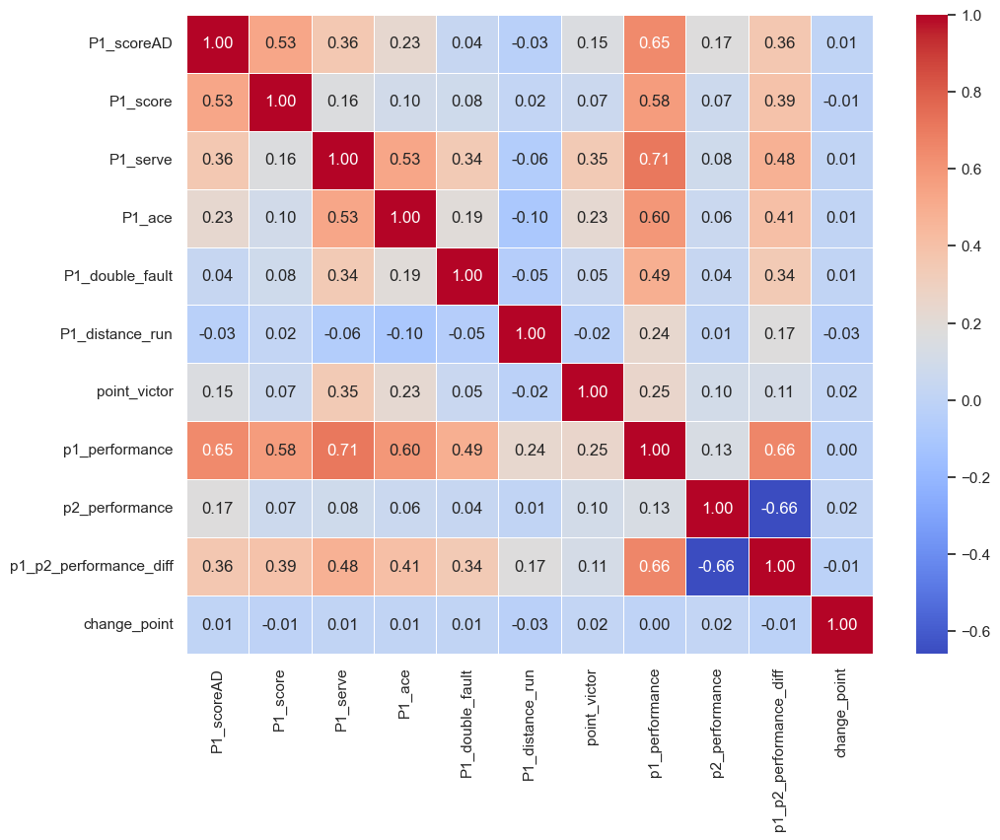

In [537]:
# 设置绘图的大小
plt.figure(figsize=(10, 8))

# 绘制热力图，使用seaborn库
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# 显示图形
plt.show()



In [538]:
import ruptures as rpt  # 引入ruptures
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 假设data是你已经创建的DataFrame，且已经包含'p1_performance'列

# 将'p1_performance'列转换为numpy数组，ruptures需要numpy数组或列表作为输入
points = np.array(data['p1_performance'])

# 使用ruptures进行变点检测
# KernelCPD 是一种可以适用的算法，这里作为展示，我们用比较通用的 Binary Segmentation
algo = rpt.Binseg(model="l2").fit(points)
my_bkps = algo.predict(n_bkps=10)  # n_bkps=10表示最多检测出10个变点

# 绘图展示
rpt.display(points, my_bkps, figsize=(10, 6))
plt.title('Detected Change Points in P1 Performance')
plt.show()


KeyError: 'p1_performance'

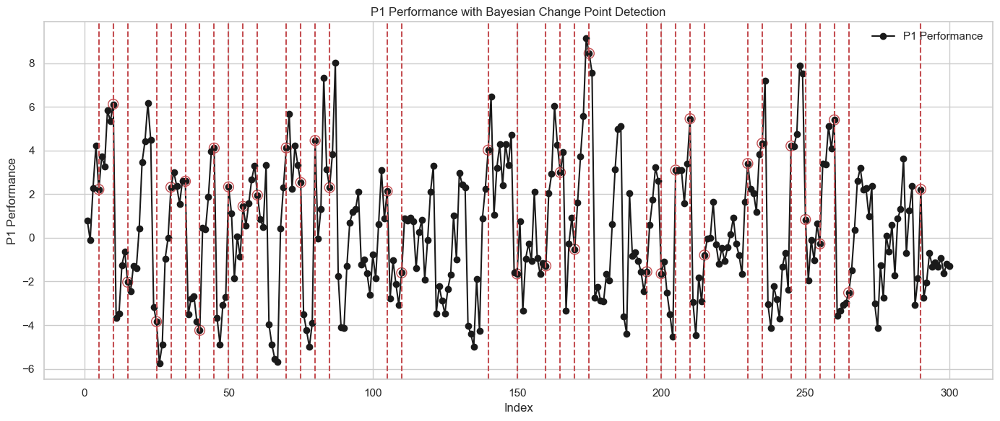

In [539]:
import matplotlib.pyplot as plt
import ruptures as rpt

# 假定 p1_performance_data 已经是前300行的'p1_performance'
model = "l2"
algo = rpt.Pelt(model=model, min_size=1, jump=5).fit(p1_performance_data.values)
result = algo.predict(pen=10)

# 绘制 p1_performance 及其变点
plt.figure(figsize=(14, 6))
plt.plot(p1_performance_data.index, p1_performance_data, '-ok', label='P1 Performance')

# 标记出变点
for point in result[:-1]:  # 减一因为ruptures结果的最后一个点通常是序列末尾
    plt.axvline(x=p1_performance_data.index[point-1], color='r', linestyle='--')

# 添加圆圈标记变点，注意这里对于索引需要小心处理，确保其在p1_performance_data的索引范围内
for point in result[:-1]:
    # 确保索引在有效范围内
    if point-1 < len(p1_performance_data):
        plt.scatter(p1_performance_data.index[point-1], p1_performance_data.iloc[point-1], s=100, facecolors='none', edgecolors='r')

plt.title('P1 Performance with Bayesian Change Point Detection')
plt.xlabel('Index')
plt.ylabel('P1 Performance')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1975263695.py:36: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlGnBu_r").copy()
  cmap_lighter.set_over('w')
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1975263695.py:37: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlGnBu_r").copy()
  cmap_lighter.set_under('w')
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1975263695.py:38: MatplotlibDeprecationWarning: You are modifying the state of a globally registered col

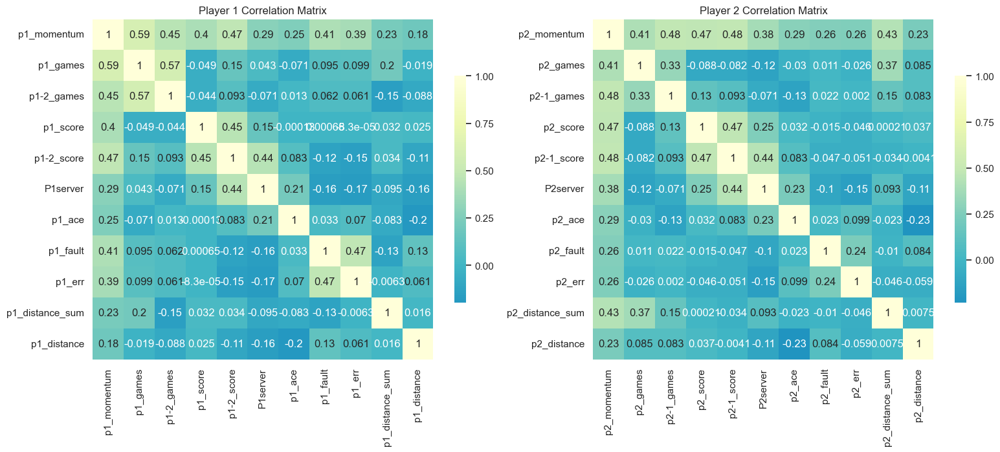

In [532]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib import rcParams

# 设置全局字体为 Times New Roman
rcParams['font.family'] = 'Times New Roman'

# 假设你有一个名为df的DataFrame，其中包含了所有相关的列
# df = pd.DataFrame({
#     'p1_momentum': [...],
#     'p1_games': [...],
#     # 其他列...
#     'p2_momentum': [...],
#     'p2_games': [...],
#     # 其他列...
# })

# 对于选手1的相关性计算
p1_correlations = df[['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace',
                      'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']].corr(method='pearson')

# 对于选手2的相关性计算
p2_correlations = df[['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace',
                      'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']].corr(method='pearson')

# 创建一个网格布局以放置两个热力图，并设置整体样式为 seaborn 的 "whitegrid" 主题
sns.set(style="whitegrid")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# 绘制选手1的相关性热力图，使用更为淡雅的颜色映射方案
cmap_lighter = sns.color_palette("YlGnBu_r", as_cmap=True)
cmap_lighter.set_over('w')
cmap_lighter.set_under('w')
cmap_lighter.set_bad('w')
sns.heatmap(p1_correlations, annot=True, cmap=cmap_lighter, center=0, square=True, 
            cbar_kws={"shrink": .5, "ticks": [-1, -.75, -.5, -.25, 0, .25, .5, .75, 1]}, ax=ax1)
ax1.set_title('Player 1 Correlation Matrix')

# 绘制选手2的相关性热力图，同样使用更为淡雅的颜色映射方案
sns.heatmap(p2_correlations, annot=True, cmap=cmap_lighter, center=0, square=True,  
            cbar_kws={"shrink": .5, "ticks": [-1, -.75, -.5, -.25, 0, .25, .5, .75, 1]}, ax=ax2)
ax2.set_title('Player 2 Correlation Matrix')

plt.tight_layout()
plt.show()

In [540]:
import pandas as pd
import numpy as np
import ruptures as rpt
import matplotlib.pyplot as plt
from collections import defaultdict

# 假设data是你的DataFrame
# 此处省略data的加载过程
# data = pd.read_csv('path_to_your_data.csv') 

# 定义函数执行变点检测
def detect_change_points(series):
    algo = rpt.Pelt(model="rbf").fit(series)  # 使用Pelt模型，基于RBF核
    result = algo.predict(pen=3)  # 设置惩罚参数，这一参数可能需要根据数据调整
    return result[:-1]  # 返回检测到的变点位置，除去末尾位置

# 执行变点检测
p1_change_points = detect_change_points(data['p1_performance'].values)
p2_change_points = detect_change_points(data['p2_performance'].values)

# 初始化change_point列为0
data['change_point'] = 0

# 更新DataFrame以反映变点情况
for cp in p1_change_points:
    data.at[cp, 'change_point'] |= 1  # 设置或保持值为1（仅p1变点）

for cp in p2_change_points:
    data.at[cp, 'change_point'] |= 2  # 设置或保持值为2（仅p2变点），若前一步已设置为1，则现在变为3

# 绘制图形
plt.figure(figsize=(14, 6))

# p1_performance
plt.plot(data.index, data['p1_performance'], label='Player 1 Performance', color='blue')
# p2_performance
plt.plot(data.index, data['p2_performance'], label='Player 2 Performance', color='red')

# 标记p1变点
for cp in p1_change_points:
    plt.scatter(cp, data.at[cp, 'p1_performance'], color='cyan', label='P1 Change Point' if cp == p1_change_points[0] else "")

# 标记p2变点
for cp in p2_change_points:
    plt.scatter(cp, data.at[cp, 'p2_performance'], color='magenta', label='P2 Change Point' if cp == p2_change_points[0] else "")

# 精化图表
plt.legend()
plt.title('Performance Change Point Detection')
plt.xlabel('Index')
plt.ylabel('Performance')
plt.grid(True)
plt.tight_layout()
plt.show()


KeyError: 'p1_performance'

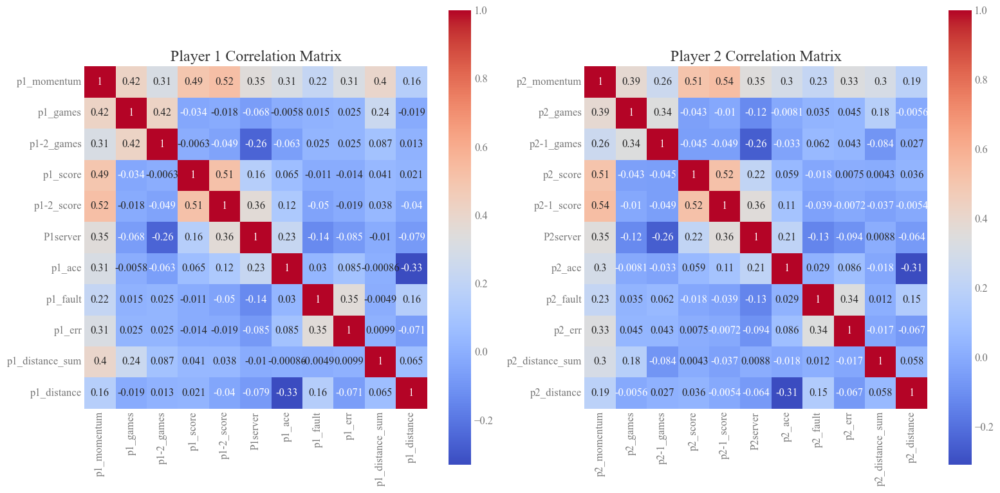

In [521]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 假设你有一个名为df的DataFrame，其中包含了所有相关的列
# df = pd.DataFrame({
#     'p1_momentum': [...],
#     'p1_games': [...],
#     # 其他列...
#     'p2_momentum': [...],
#     'p2_games': [...],
#     # 其他列...
# })

# 对于选手1的相关性计算
p1_correlations = df[['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace',
                      'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']].corr(method='spearman')

# 对于选手2的相关性计算
p2_correlations = df[['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace',
                      'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']].corr(method='spearman')

# 创建一个网格布局以放置两个热力图
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# 绘制选手1的相关性热力图
sns.heatmap(p1_correlations, annot=True, cmap="coolwarm", square=True, ax=ax1)
ax1.set_title('Player 1 Correlation Matrix')

# 绘制选手2的相关性热力图
sns.heatmap(p2_correlations, annot=True, cmap="coolwarm", square=True, ax=ax2)
ax2.set_title('Player 2 Correlation Matrix')

plt.tight_layout()
plt.show()

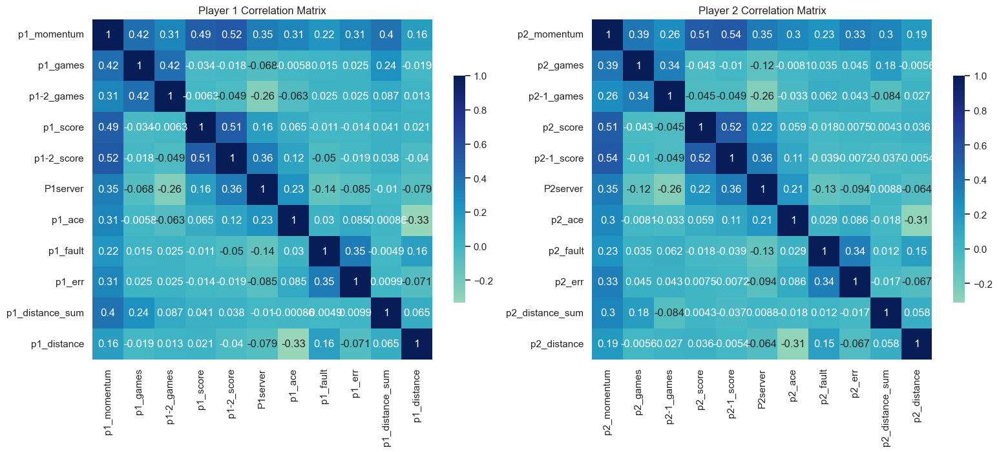

In [525]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 假设你有一个名为df的DataFrame，其中包含了所有相关的列
# df = pd.DataFrame({
#     'p1_momentum': [...],
#     'p1_games': [...],
#     # 其他列...
#     'p2_momentum': [...],
#     'p2_games': [...],
#     # 其他列...
# })

# 对于选手1的相关性计算
p1_correlations = df[['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace',
                      'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']].corr(method='spearman')

# 对于选手2的相关性计算
p2_correlations = df[['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace',
                      'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']].corr(method='spearman')

# 创建一个网格布局以放置两个热力图，并设置整体样式为 seaborn 的 "whitegrid" 主题
sns.set(style="whitegrid")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# 绘制选手1的相关性热力图，使用淡雅的颜色映射方案
sns.heatmap(p1_correlations, annot=True, cmap="YlGnBu", center=0, square=True,  cbar_kws={"shrink": .5}, ax=ax1)
ax1.set_title('Player 1 Correlation Matrix')

# 绘制选手2的相关性热力图，同样使用淡雅的颜色映射方案
sns.heatmap(p2_correlations, annot=True, cmap="YlGnBu", center=0, square=True, cbar_kws={"shrink": .5}, ax=ax2)
ax2.set_title('Player 2 Correlation Matrix')

plt.tight_layout()
plt.show()

C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\2080498122.py:37: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlGnBu_r").copy()
  cmap_lighter.set_over('w')
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\2080498122.py:38: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlGnBu_r").copy()
  cmap_lighter.set_under('w')
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\2080498122.py:39: MatplotlibDeprecationWarning: You are modifying the state of a globally registered col

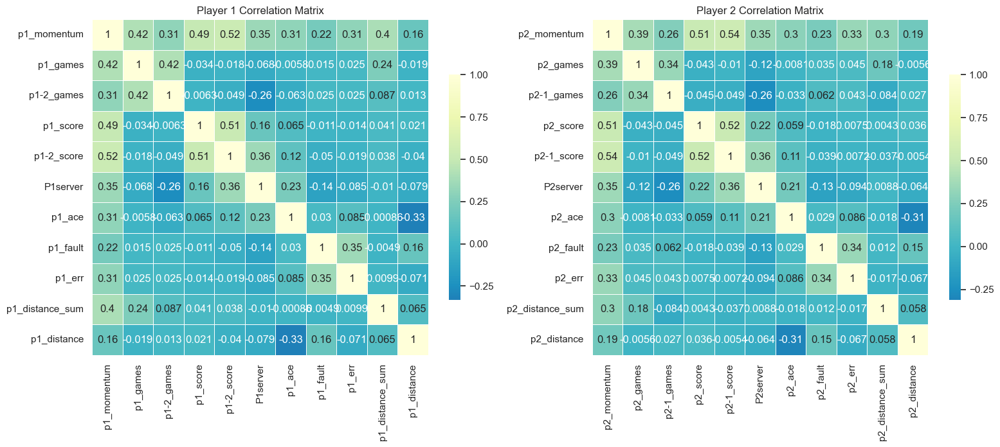

In [526]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib import rcParams

# 设置全局字体为 Times New Roman
rcParams['font.family'] = 'Times New Roman'

# 假设你有一个名为df的DataFrame，其中包含了所有相关的列
# df = pd.DataFrame({
#     'p1_momentum': [...],
#     'p1_games': [...],
#     # 其他列...
#     'p2_momentum': [...],
#     'p2_games': [...],
#     # 其他列...
# })

# 对于选手1的相关性计算
p1_correlations = df[['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace',
                      'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']].corr(method='spearman')

# 对于选手2的相关性计算
p2_correlations = df[['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace',
                      'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']].corr(method='spearman')

# 创建一个网格布局以放置两个热力图，并设置整体样式为 seaborn 的 "whitegrid" 主题
sns.set(style="whitegrid")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# 绘制选手1的相关性热力图，使用更为淡雅的颜色映射方案
# 自定义颜色范围以使颜色变淡，这里使用 YlGnBu_r 的反向版本
cmap_lighter = sns.color_palette("YlGnBu_r", as_cmap=True)
cmap_lighter.set_over('w')
cmap_lighter.set_under('w')
cmap_lighter.set_bad('w')
sns.heatmap(p1_correlations, annot=True, cmap=cmap_lighter, center=0, square=True, linewidths=.5, 
            cbar_kws={"shrink": .5, "ticks": [-1, -.75, -.5, -.25, 0, .25, .5, .75, 1]}, ax=ax1)
ax1.set_title('Player 1 Correlation Matrix')

# 绘制选手2的相关性热力图，同样使用更为淡雅的颜色映射方案
sns.heatmap(p2_correlations, annot=True, cmap=cmap_lighter, center=0, square=True, linewidths=.5, 
            cbar_kws={"shrink": .5, "ticks": [-1, -.75, -.5, -.25, 0, .25, .5, .75, 1]}, ax=ax2)
ax2.set_title('Player 2 Correlation Matrix')

plt.tight_layout()
plt.show()

KeyError: 'change_point'

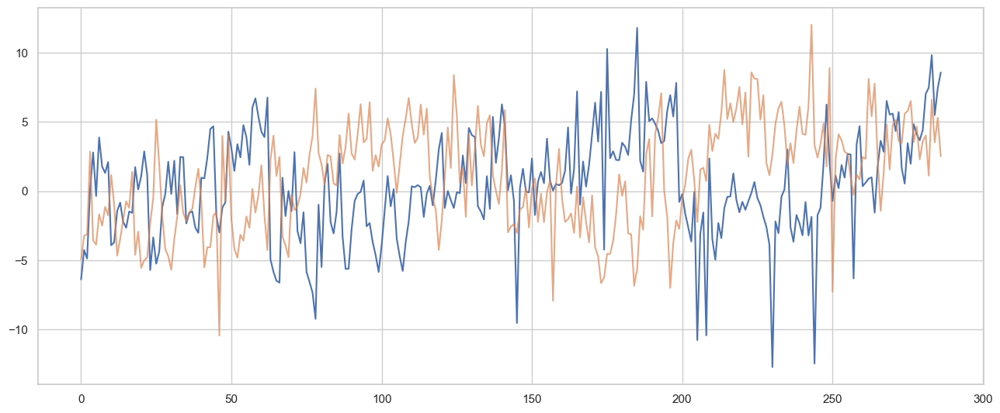

In [543]:
import ruptures as rpt

# 假定data已被加载且包含所需列

# 函数：检测单个序列的变点
def detect_change_points(series, pen=3):
    model = "l2"  # 使用l2损失，也可根据数据尝试不同的模型，如"rbf", "linear"等
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]  # 排除列表最后一个元素，它通常代表序列的结束而非真正的变点

# 检测每个序列的变点
p1_cp = detect_change_points(df['p1_momentum'].to_numpy())
p2_cp = detect_change_points(df['p2_momentum'].to_numpy())
df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data
# 初始化change_point列
df['change_point'] = 0

# 标记p1的变点
for index in p1_cp:
    df.loc[index-1, 'change_point'] = 1  # 这里index-1是因为变点检测的结果是从1开始的索引，而DataFrame是从0开始

# 标记p2的变点
for index in p2_cp:
    # 对于p2，要检查是否已经为该索引标记了变点（即p1的变点）
    if df.loc[index-1, 'change_point'] == 1:
        df.loc[index-1, 'change_point'] = 3  # 两者都变，则标记为3
    else:
        df.loc[index-1, 'change_point'] = 2

# 此处可根据需要调整画图代码，下面是基于调整后逻辑的简化画图代码

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))

# 绘制p1和p2的性能
plt.plot(df['p1_momentum'], label='p1_momentum')
plt.plot(df['p2_momentum'], label='p2_momentum', alpha=0.7)

# 突变点标记
for cp_type, color, label in zip([1, 2, 3], ['blue', 'red', 'green'], ['P1 Change', 'P2 Change', 'Both Change']):
    indices = df.index[data['change_point'] == cp_type].tolist()
    plt.scatter(indices, df.loc[indices, 'p2_momentum'], color=color, label=label)

plt.legend()
plt.title("Performance and Change Points")
plt.xlabel("Index")
plt.ylabel("Performance")
plt.show()


In [662]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt

# 假设df是您的DataFrame
# 请确保替换'dff.csv'为您数据文件的正确路径
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定的match_id，例如1301
match_data = df[df['match_id'] == 1601]

# 函数：检测单个序列的变点
def detect_change_points(series, pen=3):
    model = "l2"  # 使用l2损失
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]  # 排除序列末尾的元素

# 对p1_momentum和p2_momentum执行变点检测
p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy())
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy())

# 初始化change_point列
match_data['change_point'] = 0

# 标记p1和p2的变点
for index in p1_cp:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

# 绘制动量和变点
plt.figure(figsize=(14, 6))
plt.plot(match_data.index, match_data['p1_momentum'], label='p1_momentum')
plt.plot(match_data.index, match_data['p2_momentum'], label='p2_momentum', alpha=0.7)

# 对变点进行标记
for cp_type, color, label in zip([1, 2, 3], ['blue', 'red', 'green'], ['P1 Change Point', 'P2 Change Point', 'Both Change Points']):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        plt.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label)

plt.legend()
plt.title("Momentum and Change Points")
plt.xlabel("Index")
plt.ylabel("Momentum")
plt.show()

C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\3386592839.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\3386592839.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data.at[index, 'change_point'] = 1


KeyError: 90

In [665]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt

# 假设df是您的DataFrame
# 请确保替换'dff.csv'为您数据文件的正确路径
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定的match_id，例如1301
match_data = df[df['match_id'] == 1701]

# 函数：检测单个序列的变点
def detect_change_points(series, pen=3):
    model = "l2"  # 使用l2损失
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]  # 排除序列末尾的元素

# 对p1_momentum和p2_momentum执行变点检测
p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy())
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy())

# 初始化change_point列
match_data['change_point'] = 0

# 标记p1和p2的变点
for index in p1_cp:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

# 绘制动量和变点
plt.figure(figsize=(14, 6))
plt.plot(match_data.index, match_data['p1_momentum'], label='p1_momentum')
plt.plot(match_data.index, match_data['p2_momentum'], label='p2_momentum', alpha=0.7)

# 对变点进行标记
for cp_type, color, label in zip([1, 2, 3], ['blue', 'red', 'green'], ['P1 Change Point', 'P2 Change Point', 'Both Change Points']):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        plt.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label)

plt.legend()
plt.title("Momentum and Change Points")
plt.xlabel("Index")
plt.ylabel("Momentum")
plt.show()


C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\805887796.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\805887796.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data.at[index, 'change_point'] = 1


KeyError: 25

In [664]:
import matplotlib.font_manager as fm

# 添加 Times New Roman 字体
times_font = fm.FontProperties(fname="path/to/times.ttf")  # 替换为实际 Times New Roman 字体文件路径

# 设置绘图样式
plt.style.use("seaborn-darkgrid")  # 使用seaborn的暗网格样式

# 修改全局字体配置
plt.rcParams['font.family'] = 'Times New Roman'  # 如果系统已安装此字体，可以直接写入字体名称
# 或者使用添加的字体
# plt.rcParams['font.family'] = times_font.get_name()

# ... 其他绘图相关设置不变 ...

# 在 ax.set_title, ax.set_xlabel, ax.set_ylabel 中也可以直接指定字体属性，例如：
ax.set_title("Momentum and Change Points", fontsize=16, fontweight='bold', fontproperties=times_font)

Text(0.5, 1.0, 'Momentum and Change Points')

C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\3437192028.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0


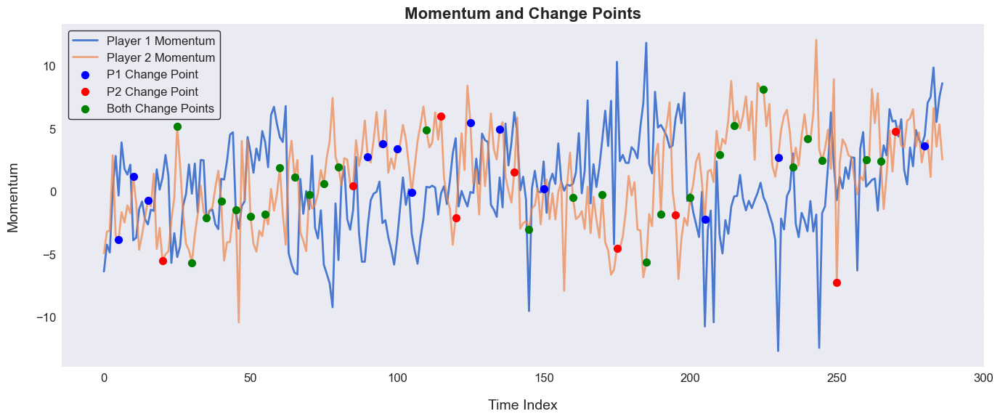

In [663]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt

# 假设df是您的DataFrame
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定match_id的数据
match_data = df[df['match_id'] == 1301]

def detect_change_points(series, pen=3):
    model = "l2"
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]

p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy())
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy())

# 初始化change_point列并标记变点
match_data['change_point'] = 0
for index in p1_cp:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

# 设置绘图样式
plt.style.use("seaborn-darkgrid")  # 使用seaborn的暗网格样式
plt.rcParams['font.family'] = 'Arial'  # 字体设置
plt.rcParams['font.size'] = 14  # 字体大小
plt.rcParams['axes.labelpad'] = 15  # 标签与轴之间的间距
plt.rcParams['lines.markersize'] = 6  # 标记点大小
plt.rcParams['legend.fontsize'] = 12  # 图例字体大小
plt.rcParams['legend.framealpha'] = 0.8  # 图例透明度

# 绘制动量曲线及变点
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(match_data.index, match_data['p1_momentum'], label='Player 1 Momentum', linewidth=2)
ax.plot(match_data.index, match_data['p2_momentum'], label='Player 2 Momentum', linewidth=2, alpha=0.7)

# 对变点进行标记
cp_colors = {'1': 'blue', '2': 'red', '3': 'green'}
cp_labels = ['P1 Change Point', 'P2 Change Point', 'Both Change Points']
for cp_type, color, label in zip([1, 2, 3], cp_colors.values(), cp_labels):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        ax.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label, s=50, zorder=10)  # 增大标记点大小

ax.set_title("Momentum and Change Points", fontsize=16, fontweight='bold')
ax.set_xlabel("Time Index", fontsize=14)
ax.set_ylabel("Momentum", fontsize=14)
ax.tick_params(labelsize=12)
ax.grid(True, linestyle='-.', color='#ECEEEF')  # 更改网格线样式和颜色
ax.legend(fontsize=12, frameon=True, edgecolor='black')

plt.tight_layout()
plt.show()

In [659]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt
import seaborn as sns  # 导入seaborn库来改进配色方案

# 设置Seaborn的风格，使得图表更加美观
sns.set(style='whitegrid', palette='muted')

# 假设df是您的DataFrame
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定的match_id，例如1301
match_data = df[df['match_id'] == 1701]

def detect_change_points(series, pen=3):
    model = "l2"
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]

# 检测变点
p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy())
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy())
match_data['change_point'] = 0

for index in p1_cp:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

plt.figure(figsize=(14, 6))
plt.plot(match_data.index, match_data['p1_momentum'], label='Player 1 Momentum', color='#4287f5', linewidth=2)  # 使用清晰的蓝色
plt.plot(match_data.index, match_data['p2_momentum'], label='Player 2 Momentum', color='#f54242', alpha=0.7, linewidth=2)  # 使用明显的红色，透明度设置为0.7

# 使用不同的标记风格来标记变点
marker_style = dict(linestyle='None', marker='o', markersize=8, fillstyle='full')

# 标记变点
for cp_type, color, label in zip([1, 2, 3], ['#4daf4a', '#ffd700', '#ff69b4'], ['P1 Change Point', 'P2 Change Point', 'Both Change Points']):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        plt.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label, **marker_style)

plt.legend()
plt.title("Momentum and Change Points", fontsize=16)
plt.xlabel("Index", fontsize=14)
plt.ylabel("Momentum", fontsize=14)
plt.tight_layout()
sns.despine()  # 移除顶部和右侧的线条，让图表看起来更干净

plt.show()


C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1209623935.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0
C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\1209623935.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data.at[index, 'change_point'] = 1


KeyError: 25

In [542]:
df = pd.read_csv('dff.csv')  # Adjust the path as necessary

match_data = df[df['match_id'] == 1301]
df = match_data

In [533]:
import ruptures as rpt

# 假定data已被加载且包含所需列

# 函数：检测单个序列的变点
def detect_change_points(series, pen=3):
    model = "l2"  # 使用l2损失，也可根据数据尝试不同的模型，如"rbf", "linear"等
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]  # 排除列表最后一个元素，它通常代表序列的结束而非真正的变点

# 检测每个序列的变点
p1_cp = detect_change_points(df['p1_performance'].to_numpy())
p2_cp = detect_change_points(df['p2_performance'].to_numpy())

# 初始化change_point列
df['change_point'] = 0

# 标记p1的变点
for index in p1_cp:
    df.loc[index-1, 'change_point'] = 1  # 这里index-1是因为变点检测的结果是从1开始的索引，而DataFrame是从0开始

# 标记p2的变点
for index in p2_cp:
    # 对于p2，要检查是否已经为该索引标记了变点（即p1的变点）
    if df.loc[index-1, 'change_point'] == 1:
        df.loc[index-1, 'change_point'] = 3  # 两者都变，则标记为3
    else:
        df.loc[index-1, 'change_point'] = 2

# 此处可根据需要调整画图代码，下面是基于调整后逻辑的简化画图代码

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))

# 绘制p1和p2的性能
plt.plot(df['p1_performance'], label='P1 Performance')
plt.plot(df['p2_performance'], label='P2 Performance', alpha=0.7)

# 突变点标记
for cp_type, color, label in zip([1, 2, 3], ['blue', 'red', 'green'], ['P1 Change', 'P2 Change', 'Both Change']):
    indices = df.index[data['change_point'] == cp_type].tolist()
    plt.scatter(indices, df.loc[indices, 'p1_performance'], color=color, label=label)

plt.legend()
plt.title("Performance and Change Points")
plt.xlabel("Index")
plt.ylabel("Performance")
plt.show()


KeyError: 'p1_performance'

C:\Users\zhongquji-cold\AppData\Local\Temp\ipykernel_17576\3234182357.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  match_data['change_point'] = 0


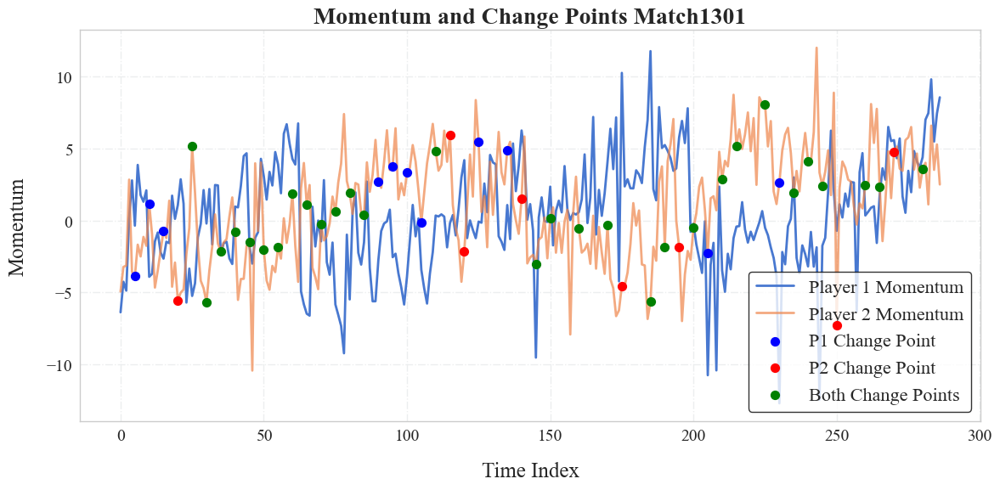

In [682]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
# 在进行变点标记前，先确认变点索引是否在DataFrame的索引范围内
p1_cp_valid = [cp for cp in p1_cp if cp in match_data.index]
p2_cp_valid = [cp for cp in p2_cp if cp in match_data.index]

# 初始化change_point列并标记变点
for index in p1_cp_valid:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp_valid:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2
# 假设df是您的DataFrame
df = pd.read_csv('dff.csv')  # 调整路径为实际数据文件位置

# 筛选特定match_id的数据
match_data = df[df['match_id'] == 1301]

def detect_change_points(series, pen=2):
    model = "l2"
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return result[:-1]

p1_cp = detect_change_points(match_data['p1_momentum'].to_numpy())
p2_cp = detect_change_points(match_data['p2_momentum'].to_numpy())

# 初始化change_point列并标记变点
match_data['change_point'] = 0
for index in p1_cp:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

# 设置绘图样式（白色背景，Times New Roman字体）
plt.style.use("seaborn-whitegrid")  # 使用seaborn的白色网格样式
rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 14,
    'axes.labelpad': 15,
    'lines.markersize': 6,
    'legend.fontsize': 12,
    'legend.framealpha': 0.8,
    'figure.facecolor': 'white',  # 设置画布背景为纯白色
    'axes.facecolor': 'white',
    'savefig.facecolor': 'white',
})

# 绘制动量曲线及变点
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(match_data.index, match_data['p1_momentum'], label='Player 1 Momentum', linewidth=2)
ax.plot(match_data.index, match_data['p2_momentum'], label='Player 2 Momentum', linewidth=2, alpha=0.7)

cp_colors = {'1': 'blue', '2': 'red', '3': 'green'}
cp_labels = ['P1 Change Point', 'P2 Change Point', 'Both Change Points']
for cp_type, color, label in zip([1, 2, 3], cp_colors.values(), cp_labels):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        ax.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label, s=50, zorder=10)  

ax.set_title("Momentum and Change Points Match1301", fontsize=20, fontweight='bold')
ax.set_xlabel("Time Index", fontsize=18)
ax.set_ylabel("Momentum", fontsize=18)
ax.tick_params(labelsize=14)
ax.grid(True, linestyle='-.', color='#ECEEEF')  
ax.legend(fontsize=16, frameon=True, edgecolor='black')

plt.tight_layout()
plt.show()

In [678]:
import pandas as pd
import ruptures as rpt
import matplotlib.pyplot as plt

# 假设df是您的DataFrame
# 请确保替换'dff.csv'为您数据文件的正确路径
df = pd.read_csv('dff.csv')  

# 筛选特定match_id的数据（这里假设您想选择id为1301的比赛）
match_data = df[df['match_id'] == 1301]

def detect_change_points(series, pen=3):
    model = "l2"
    algo = rpt.Pelt(model=model).fit(series)
    result = algo.predict(pen=pen)
    return [cp for cp in result[:-1] if cp in series.index]  # 确保变点索引在series的索引范围内

# 对p1_momentum和p2_momentum执行变点检测，并筛选出有效的索引
p1_cp_valid = detect_change_points(match_data['p1_momentum'])
p2_cp_valid = detect_change_points(match_data['p2_momentum'])

# 初始化change_point列并标记变点
match_data['change_point'] = 0
for index in p1_cp_valid:
    match_data.at[index, 'change_point'] = 1
for index in p2_cp_valid:
    if match_data.at[index, 'change_point'] == 1:
        match_data.at[index, 'change_point'] = 3
    else:
        match_data.at[index, 'change_point'] = 2

# 设置绘图样式
plt.style.use("seaborn-whitegrid")  # 使用seaborn的白色网格样式
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 14,
    'axes.labelpad': 15,
    'lines.markersize': 6,
    'legend.fontsize': 12,
    'legend.framealpha': 0.8,
    'figure.facecolor': 'white',  # 设置画布背景为纯白色
    'axes.facecolor': 'white',
    'savefig.facecolor': 'white',
})

# 绘制动量曲线及变点
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(match_data.index, match_data['p1_momentum'], label='Player 1 Momentum', linewidth=2)
ax.plot(match_data.index, match_data['p2_momentum'], label='Player 2 Momentum', linewidth=2, alpha=0.7)

cp_colors = {'1': 'blue', '2': 'red', '3': 'green'}
cp_labels = ['P1 Change Point', 'P2 Change Point', 'Both Change Points']
for cp_type, color, label in zip([1, 2, 3], cp_colors.values(), cp_labels):
    indices = match_data[match_data['change_point'] == cp_type].index
    if not indices.empty:
        ax.scatter(indices, match_data.loc[indices, 'p2_momentum'], color=color, label=label, s=50, zorder=10)  

ax.set_title("Momentum and Change Points for Match1301", fontsize=20, fontweight='bold')
ax.set_xlabel("Time Index", fontsize=18)
ax.set_ylabel("Momentum", fontsize=18)
ax.tick_params(labelsize=16)
ax.grid(True, linestyle='-.', color='#ECEEEF')  
ax.legend(fontsize=16, frameon=True, edgecolor='black')

plt.tight_layout()
plt.show()

AttributeError: 'Series' object has no attribute 'reshape'

In [520]:
import pandas as pd
from scipy.stats import anderson

# 假设df是你的DataFrame，包含了所有的数据列
# 首先将数据加载到DataFrame中
# df = pd.read_csv('your_data.csv')

# 定义要检验的列
columns_p1 = ['p1_momentum', 'p1_games', 'p1-2_games', 'p1_score', 'p1-2_score', 'P1server', 'p1_ace', 'p1_fault', 'p1_err', 'p1_distance_sum', 'p1_distance']
columns_p2 = ['p2_momentum', 'p2_games', 'p2-1_games', 'p2_score', 'p2-1_score', 'P2server', 'p2_ace', 'p2_fault', 'p2_err', 'p2_distance_sum', 'p2_distance']

# 创建一个函数来执行Anderson-Darling测试并打印结果
def ad_test_normality(data, columns):
    for col in columns:
        result = anderson(data[col])
        print(f'Anderson-Darling test for {col}:')
        print(f'Statistic: {result.statistic:.3f}')
        for i in range(len(result.critical_values)):
            sl, cv = result.significance_level[i], result.critical_values[i]
            if result.statistic < cv:
                print(f'At the significance level {sl}%, data looks normal (statistic < {cv}).')
            else:
                print(f'At the significance level {sl}%, data does not look normal (statistic >= {cv}).')
        print('\n')

# 对p1的相关性列进行测试
print("Testing normality for p1 related columns:")
ad_test_normality(df, columns_p1)

# 对p2的相关性列进行测试
print("Testing normality for p2 related columns:")
ad_test_normality(df, columns_p2)


Testing normality for p1 related columns:
Anderson-Darling test for p1_momentum:
Statistic: 4.304
At the significance level 15.0%, data does not look normal (statistic >= 0.576).
At the significance level 10.0%, data does not look normal (statistic >= 0.656).
At the significance level 5.0%, data does not look normal (statistic >= 0.787).
At the significance level 2.5%, data does not look normal (statistic >= 0.917).
At the significance level 1.0%, data does not look normal (statistic >= 1.091).


Anderson-Darling test for p1_games:
Statistic: 168.774
At the significance level 15.0%, data does not look normal (statistic >= 0.576).
At the significance level 10.0%, data does not look normal (statistic >= 0.656).
At the significance level 5.0%, data does not look normal (statistic >= 0.787).
At the significance level 2.5%, data does not look normal (statistic >= 0.917).
At the significance level 1.0%, data does not look normal (statistic >= 1.091).


Anderson-Darling test for p1-2_games:
S

In [76]:
data.head(20)

,match_id,P1_scoreAD,P1_score,P1_serve,P1_ace,P1_double_fault,P1_distance_run,point_victor,p1_performance,p2_performance,p1_p2_performance_diff,change_point
0,1301,-0.047779,-1.181733,1.021263,1.934021,-0.335198,-0.592066,0,0.798509,6.117200,-5.318692,0
1,1301,-0.900911,-1.181733,1.021263,1.934021,-0.335198,-0.647912,1,-0.110470,-3.669086,3.558616,0
2,1301,-0.047779,-0.274484,1.021263,1.934021,-0.335198,-0.008932,0,2.288891,-3.478634,5.767525,0
3,1301,-0.900911,-0.274484,1.021263,1.934021,-0.335198,2.780240,1,4.224931,-1.249577,5.474508,0
4,1301,-0.047779,0.632765,1.021263,1.934021,-0.335198,-0.992110,1,2.212962,-0.636473,2.849436,1
5,1301,0.520976,1.237597,1.021263,1.934021,-0.335198,-0.645071,0,3.733589,-2.032967,5.766556,0
6,1301,-0.047779,1.237597,1.021263,1.934021,-0.335198,-0.530986,1,3.278919,-2.459602,5.738521,0
7,1301,0.805354,2.144846,1.021263,1.934021,-0.335198,0.267907,0,5.838194,-1.290126,7.128320,0
8,1301,-0.047779,1.237597,1.021263,1.934021,-0.335198,1.537792,1,5.347697,-1.399465,6.747162,0
9,1301,0.805354,2.144846,1.021263,1.934021,-0.335198,0.546914,1,6.117200,0.417155,5.700046,3


In [306]:

data.to_csv('p2f.csv', index=False)
data = pd.read_csv('p2f.csv')

In [60]:
data = pd.read_csv('p2f.csv')

In [63]:
data.head(15)

,match_id,P1_scoreAD,P1_score,P1_serve,P1_ace,P1_double_fault,P1_distance_run,point_victor,p1_performance,p2_performance
0,1301,-0.047779,-1.181733,1.021263,1.934021,-0.335198,-0.592066,0,0.798509,6.117200
1,1301,-0.900911,-1.181733,1.021263,1.934021,-0.335198,-0.647912,1,-0.110470,-3.669086
2,1301,-0.047779,-0.274484,1.021263,1.934021,-0.335198,-0.008932,0,2.288891,-3.478634
3,1301,-0.900911,-0.274484,1.021263,1.934021,-0.335198,2.780240,1,4.224931,-1.249577
4,1301,-0.047779,0.632765,1.021263,1.934021,-0.335198,-0.992110,1,2.212962,-0.636473
5,1301,0.520976,1.237597,1.021263,1.934021,-0.335198,-0.645071,0,3.733589,-2.032967
6,1301,-0.047779,1.237597,1.021263,1.934021,-0.335198,-0.530986,1,3.278919,-2.459602
7,1301,0.805354,2.144846,1.021263,1.934021,-0.335198,0.267907,0,5.838194,-1.290126
8,1301,-0.047779,1.237597,1.021263,1.934021,-0.335198,1.537792,1,5.347697,-1.399465
9,1301,0.805354,2.144846,1.021263,1.934021,-0.335198,0.546914,1,6.117200,0.417155


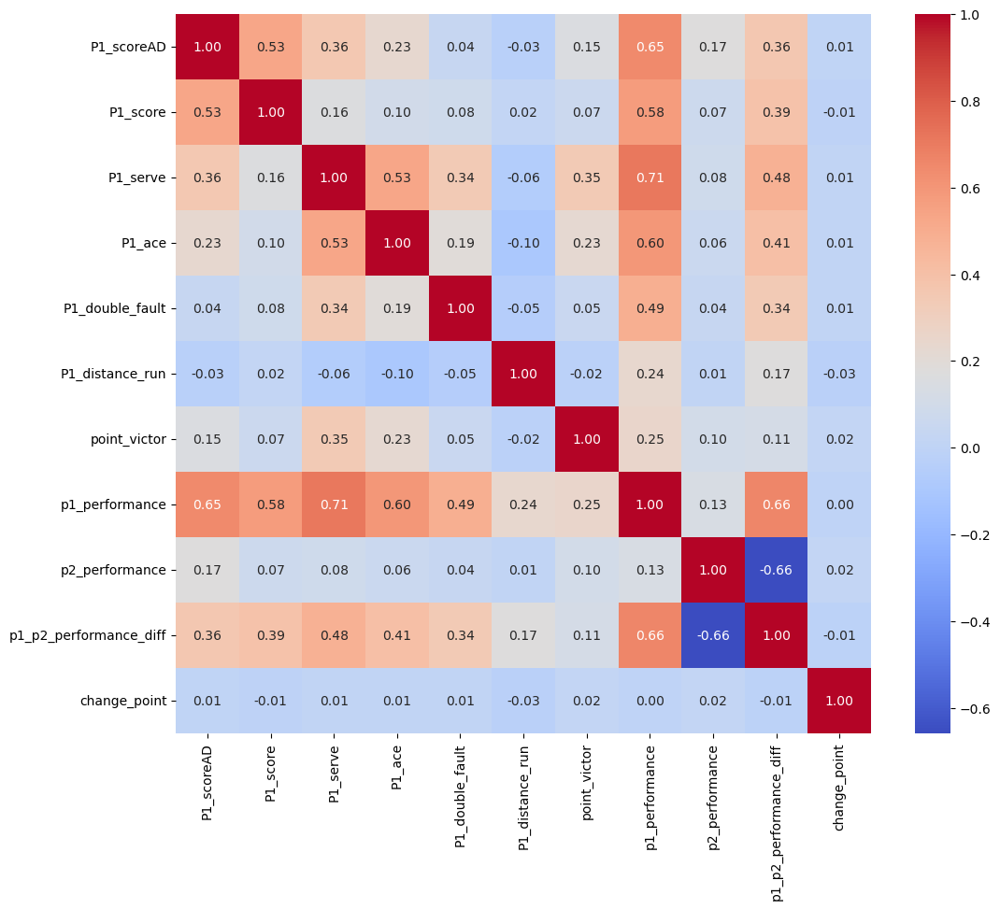

In [77]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设data已经加载到DataFrame中
# 计算相关性矩阵
corr_matrix = data[['P1_scoreAD', 'P1_score', 'P1_serve', 'P1_ace', 'P1_double_fault', 'P1_distance_run', 'point_victor', 'p1_performance', 'p2_performance', 'p1_p2_performance_diff', 'change_point']].corr()

# 绘制热力图查看相关性
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()


Random Forest Accuracy:  0.8040345821325648
              precision    recall  f1-score   support

           0       0.82      0.98      0.89      1139
           1       0.00      0.00      0.00        48
           2       0.00      0.00      0.00        54
           3       0.05      0.01      0.01       147

    accuracy                           0.80      1388
   macro avg       0.22      0.25      0.23      1388
weighted avg       0.68      0.80      0.73      1388



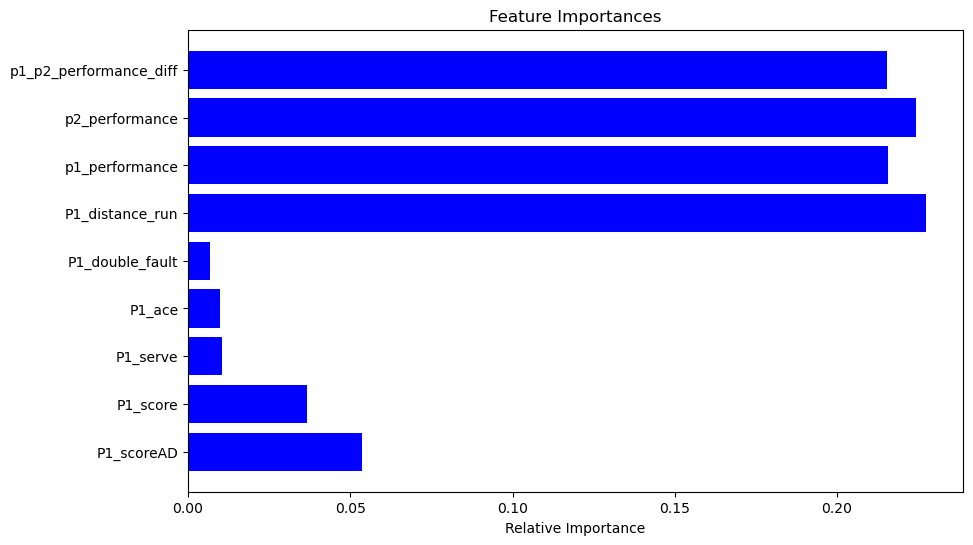

In [80]:
from sklearn.ensemble import RandomForestClassifier

# 继续使用之前定义的features和target变量y
X = data[features]
y = data['change_point']

# 数据集划分
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 初始化并训练Random Forest模型
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)

# 进行预测
y_pred = rf_clf.predict(X_test)

# 打印准确率
print("Random Forest Accuracy: ", accuracy_score(y_test, y_pred))

# 打印其他评价指标
print(classification_report(y_test, y_pred))

# 计算特征重要性
feature_importances = rf_clf.feature_importances_

# 创建特征重要性的图
plt.figure(figsize=(10, 6))
plt.title('Feature Importances')
plt.barh(range(len(feature_importances)), feature_importances, color='b', align='center')
plt.yticks(range(len(feature_importances)), features)
plt.xlabel('Relative Importance')
plt.show()

